In [ ]:
import os
import numpy as np
from sklearn.model_selection import train_test_split
from keras.preprocessing.image import img_to_array, load_img
from keras.models import Model
from keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, concatenate
from keras.optimizers import Adam
from keras.callbacks import ModelCheckpoint

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
!apt-get install unrar
!unrar x "/content/dataset.rar" "/content/"

Streaming output truncated to the last 5000 lines.
Extracting  /content/dataset/images/test7Original_RGATE_G_1001_DS_248.TIFF      79%  OK 
Extracting  /content/dataset/images/test7Original_RGATE_G_1001_DS_252.TIFF      79%  OK 
Extracting  /content/dataset/images/test7Original_RGATE_G_1001_DS_256.TIFF      79%  OK 
Extracting  /content/dataset/images/test7Original_RGATE_G_1001_DS_260.TIFF      79%  OK 
Extracting  /content/dataset/images/test7Original_RGATE_G_1001_DS_264.TIFF      80%  OK 
Extracting  /content/dataset/images/test7Original_RGATE_G_1001_DS_268.TIFF      80%  OK 
Extracting  /content/dataset/images/test7Original_RGATE_G_1001_DS_272.TIFF      80%  OK 
Extracting  /content/dataset/images/test7Original_RGATE_G_1001_DS_276.TIFF      80%  OK 
Extracting  /content/dataset/images/test7Original_RGATE_G_1001_DS_28.TIFF      80%  OK 
Extracting  /content/dataset/images/test7Original_RGATE_G_1001_DS_28

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms as T
import torchvision
import torch.nn.functional as F
from torch.autograd import Variable

from PIL import Image
import cv2
import albumentations as A

import time
import os
from tqdm.notebook import tqdm

In [ ]:
IMAGE_PATH = '/content/dataset/images/'
MASK_PATH = '/content/dataset/masks/'

In [ ]:
n_classes = 2

def create_df(path):
    name = []
    for dirname, _, filenames in os.walk(path):
        for filename in sorted(filenames):  # Sort the filenames
            index_name = (filename.split('.')[0])
            index = index_name
            name.append(index)

    return pd.DataFrame({'id': name}, index = np.arange(0, len(name)))

df = create_df(IMAGE_PATH)
df_mask = create_df(MASK_PATH)

print('Total Images: ', len(df))
print('Total Images: ', len(df_mask))

Total Images:  4560
Total Images:  4560


In [ ]:
df.head()

,id
0,Original_SGATE_G_1001_DS_0
1,Original_SGATE_G_1001_DS_100
2,Original_SGATE_G_1001_DS_104
3,Original_SGATE_G_1001_DS_108
4,Original_SGATE_G_1001_DS_112


In [ ]:
df_mask.head()

,id
0,ground_SGATE_G_1001_DS_0
1,ground_SGATE_G_1001_DS_100
2,ground_SGATE_G_1001_DS_104
3,ground_SGATE_G_1001_DS_108
4,ground_SGATE_G_1001_DS_112


In [ ]:
print(df['id'][0])
print(df_mask['id'][0])

Original_SGATE_G_1001_DS_0
ground_SGATE_G_1001_DS_0


In [ ]:
#split data
X_trainval, X_test = train_test_split(df['id'].values, test_size=0.1, random_state=19)
X_train, X_val = train_test_split(X_trainval, test_size=0.15, random_state=19)

# Split data for masks
X_trainval_mask, X_test_mask = train_test_split(df_mask['id'].values, test_size=0.1, random_state=19)
X_train_mask, X_val_mask = train_test_split(X_trainval_mask, test_size=0.15, random_state=19)

print('Train Size   : ', len(X_train))
print('Val Size     : ', len(X_val))
print('Test Size    : ', len(X_test))


print('Train Size for Masks    : ', len(X_train_mask))
print('Val Size for Masks      : ', len(X_val_mask))
print('Test Size for Masks     : ', len(X_test_mask))

Train Size   :  3488
Val Size     :  616
Test Size    :  456
Train Size for Masks    :  3488
Val Size for Masks      :  616
Test Size for Masks     :  456


Image Size (64, 64)
Mask Size (64, 64)


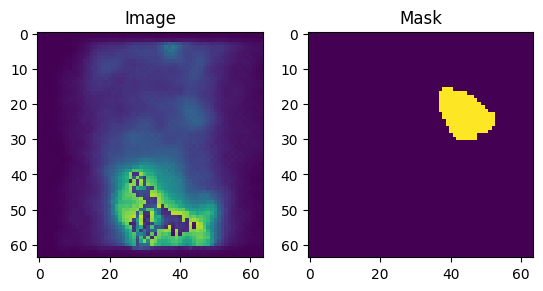

Image Size (64, 64)
Mask Size (64, 64)


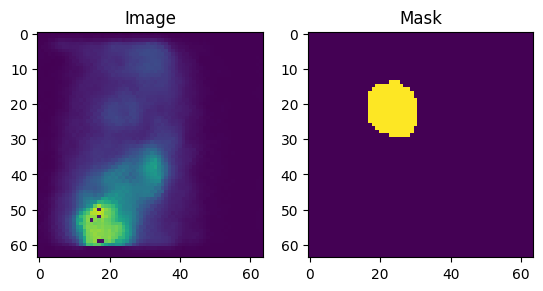

Image Size (64, 64)
Mask Size (64, 64)


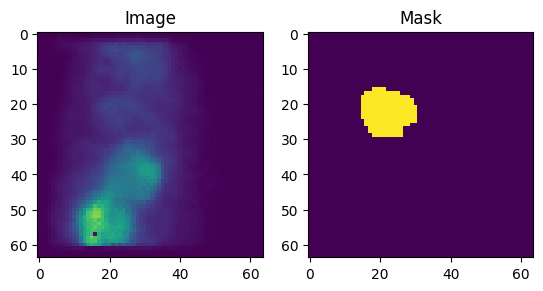

Image Size (64, 64)
Mask Size (64, 64)


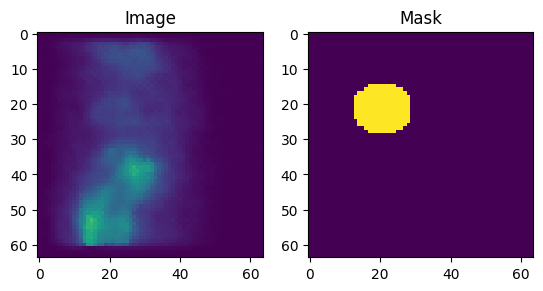

Image Size (64, 64)
Mask Size (64, 64)


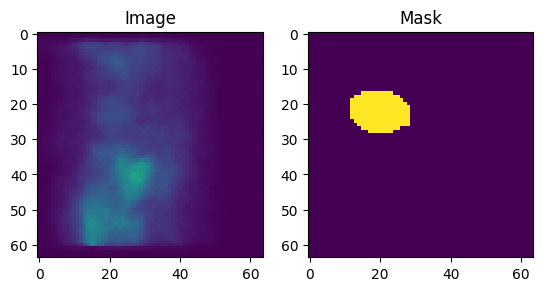

In [ ]:
for ind in range(5):
  img = Image.open(IMAGE_PATH + df['id'][ind] + '.TIFF')
  mask = Image.open(MASK_PATH + df_mask['id'][ind] + '.TIFF')
  print('Image Size', np.asarray(img).shape)
  print('Mask Size', np.asarray(mask).shape)

  img = plt.get_cmap('viridis')(img)
  mask= plt.get_cmap('viridis')(mask)
  fig, ax = plt.subplots(1, 2)
  # Display image
  ax[0].imshow(img)
  ax[0].set_title('Image')
  # Display mask
  ax[1].imshow(mask)
  ax[1].set_title('Mask')
  plt.show()

In [ ]:
class SpectDataset(Dataset):

    def __init__(self, img_path, mask_path, X, Xmask, mean, std, transform=None, patch=False):
        self.img_path = img_path
        self.mask_path = mask_path
        self.X = X
        self.Xmask=Xmask
        self.transform = transform
        self.patches = patch
        self.mean = mean
        self.std = std

    def __len__(self):
        return len(self.X)

    def __getitem__(self, idx):
        img = cv2.imread(self.img_path + self.X[idx] + '.TIFF')
        #img[45:64, :] = 0
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        mask = cv2.imread(self.mask_path + self.Xmask[idx] + '.TIFF', cv2.IMREAD_GRAYSCALE)
        mask = mask / 255
        if img is None or mask is None:
          print(f"Image or mask at index {idx} could not be read.")
          return None
        if self.transform is not None:
            aug = self.transform(image=img, mask=mask)
            img = Image.fromarray(aug['image'])
            mask = aug['mask']

        if self.transform is None:
            img = Image.fromarray(img)

        t = T.Compose([T.ToTensor(), T.Normalize(self.mean, self.std)])
        img = t(img)
        mask = torch.from_numpy(mask).long()

        if self.patches:
            img, mask = self.tiles(img, mask)

        return img, mask

    def tiles(self, img, mask):
          img_patches = img.unfold(1, 32, 32).unfold(2, 32, 32)
          img_patches  = img_patches.contiguous().view(3,-1, 32, 32)
          img_patches = img_patches.permute(1,0,2,3)

          mask_patches = mask.unfold(0, 32, 32).unfold(1, 32, 32)
          mask_patches = mask_patches.contiguous().view(-1, 32, 32)

          return img_patches, mask_patches

In [ ]:
mean=[0.485, 0.456, 0.406]
std=[0.229, 0.224, 0.225]

t_train = A.Compose([A.Resize(64, 64, interpolation=cv2.INTER_NEAREST), A.HorizontalFlip(), A.VerticalFlip(),
                     A.GridDistortion(p=0.2), A.RandomBrightnessContrast((0,0.5),(0,0.5)),
                     A.GaussNoise()])

t_val = A.Compose([A.Resize(64, 64, interpolation=cv2.INTER_NEAREST), A.HorizontalFlip(),
                   A.GridDistortion(p=0.2)])

#datasets
train_set = SpectDataset(IMAGE_PATH, MASK_PATH, X_train,X_train_mask, mean, std, t_train, patch=False)
print(len(train_set))
val_set = SpectDataset(IMAGE_PATH, MASK_PATH, X_val,X_val_mask, mean, std, t_val, patch=False)
print(len(val_set))

#dataloader
batch_size= 128
num_workers = 2

train_loader = DataLoader(train_set, batch_size=batch_size, shuffle=True, num_workers=num_workers)
print(len(train_loader))
val_loader = DataLoader(val_set, batch_size=batch_size, shuffle=False, num_workers=num_workers)
print(len(val_loader))

3488
616
28
5


In [ ]:
def double_conv(in_c, out_c):
    conv = nn.Sequential(
        nn.Conv2d(in_c, out_c, kernel_size=3,padding=1),
        nn.BatchNorm2d(out_c),
        nn.ReLU(inplace=True),
        nn.Conv2d(out_c, out_c, kernel_size=3, padding=1),
        nn.BatchNorm2d(out_c),
        nn.ReLU(inplace=True),
    )
    return conv

def crop_img(tensor, target_tensor):
    target_size = target_tensor.size()[2]
    tensor_size = tensor.size()[2]
    delta= tensor_size - target_size
    delta = delta//2
    return tensor[:, :, delta:tensor_size - delta, delta:tensor_size - delta]

class UNet(nn.Module):
    def __init__(self, num_channels, num_classes,retain_dim=True):
        super(UNet, self).__init__()

        self.max_pool_2x2 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.down_conv_1 = double_conv(num_channels, out_c=64)
        self.down_conv_2 = double_conv(in_c=64, out_c=128)
        self.down_conv_3 = double_conv(in_c=128, out_c=256)

        self.up_trans_1 = nn.ConvTranspose2d(in_channels=256, out_channels=128, kernel_size=2,stride=2)
        self.up_conv_1 = double_conv(256, 128)
        self.up_trans_2 = nn.ConvTranspose2d(in_channels=128, out_channels=64, kernel_size=2,stride=2)
        self.up_conv_2 = double_conv(128, 64)

        self.out = nn.Conv2d(
            in_channels=64,
            out_channels = num_classes, # Number of objects to segment
            kernel_size=1,
        )
        self.retain_dim = retain_dim

    def forward(self, image,out_size=(64, 64)):
        # encoder part
        x1 = self.down_conv_1(image)
        x2 = self.max_pool_2x2(x1)
        x3 = self.down_conv_2(x2)
        x4 = self.max_pool_2x2(x3)
        x5 = self.down_conv_3(x4)

        # decoder part
        x = self.up_trans_1(x5)
        y = crop_img(x3, x)
        x = self.up_conv_1(torch.cat([x, y], 1))

        x = self.up_trans_2(x)
        y = crop_img(x1, x)
        x = self.up_conv_2(torch.cat([x, y], 1))

        x = self.out(x)
        if self.retain_dim:
            x = F.interpolate(x, out_size)
        x = F.softmax(x, dim=1)
        return x


In [ ]:
model = UNet(num_channels=3, num_classes=2)

In [ ]:
!pip install torchviz graphviz
import torch
from torchviz import make_dot

In [ ]:
model = UNet(num_channels=3, num_classes=2)

# Create a random tensor that matches the input size of your model
# Assuming your model takes input of shape (batch_size, num_channels, height, width)
input_tensor = torch.rand(1, 3, 64, 64)

# Forward pass through the model
output_tensor = model(input_tensor)

# Create a graph of the model
graph = make_dot(output_tensor, params=dict(model.named_parameters()))

# Render the graph using matplotlib
graph.format = 'png'
graph.render('model_architecture')

'model_architecture.png'

In [ ]:
def pixel_accuracy(output, mask):
    with torch.no_grad():
        output = torch.argmax(F.softmax(output, dim=1), dim=1)
        correct = torch.eq(output, mask).int()
        accuracy = float(correct.sum()) / float(correct.numel())
    return accuracy
def mIoU(pred_mask, mask, smooth=1e-10, n_classes=7):
    with torch.no_grad():
        pred_mask = F.softmax(pred_mask, dim=1)
        pred_mask = torch.argmax(pred_mask, dim=1)
        pred_mask = pred_mask.contiguous().view(-1)
        mask = mask.contiguous().view(-1)

        iou_per_class = []
        for clas in range(0, n_classes): #loop per pixel class
            true_class = pred_mask == clas
            true_label = mask == clas

            if true_label.long().sum().item() == 0: #no exist label in this loop
                iou_per_class.append(np.nan)
            else:
                intersect = torch.logical_and(true_class, true_label).sum().float().item()
                union = torch.logical_or(true_class, true_label).sum().float().item()

                iou = (intersect + smooth) / (union +smooth)
                iou_per_class.append(iou)
        return np.nanmean(iou_per_class)

In [ ]:
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms as T
import torchvision
import torch.nn.functional as F
from torch.autograd import Variable

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [ ]:
def get_lr(optimizer):
    for param_group in optimizer.param_groups:
        return param_group['lr']
import torch.nn.functional as F
def segmentation_metrics(logits, targets, activation='0-1', eps=1e-7, reduction='mean'):
    ''' This method compute pixel_acc, iou, dice, precision, recall at the same time.
        If the task is mulit-class classification, i.e. logits.shape == [batch, classes, H, W],
        this method outputs the are averaged along the classes.
    '''
    # convert targets to one hot encoding
    if len(targets.shape) == len(logits.shape) - 1:
        if logits.shape[1] == 1:  # binary classification
            y_true = targets[:, None].to(logits.dtype)
        else:  # mulit-class classification
            y_true = F.one_hot(targets, num_classes=logits.shape[1])
            y_true = y_true.to(logits.dtype).to(logits.device)
            y_true = y_true[:, None].transpose(1, -1)[..., 0]
    else:
        y_true = targets.to(logits.dtype).to(logits.device)
    # logits to probability
    if activation == 'softmax':
        y_pred = torch.softmax(logits, dim=1)
    elif activation == 'sigmoid':
        y_pred = torch.sigmoid(logits)
    elif activation == '0-1':
        if logits.shape[1] == 1:  # binary classification
            y_pred = (logits > 0).to(logits.dtype).to(logits.device)
        else:  # mulit-class classification
            y_pred = torch.argmax(logits, axis=1)
            y_pred = F.one_hot(y_pred, num_classes=logits.shape[1])
            y_pred = y_pred.to(logits.dtype).to(logits.device)
            y_pred = y_pred[:, None].transpose(1, -1)[..., 0]

    axis = list(range(2, len(logits.shape)))  # height and width
    # compute true postive, false positive and false negative
    tp = torch.sum(y_true * y_pred, dim=axis)
    fp = torch.sum(y_pred, dim=axis) - tp
    fn = torch.sum(y_true, dim=axis) - tp

    if logits.shape[1] == 1:  # binary classification
        tn = torch.sum((1 - y_true) * (1 - y_pred), dim=axis)
        pixel_acc = (torch.sum(tp, dim=1) + torch.sum(tn, dim=1) + eps) / (torch.sum(tp, dim=1) + torch.sum(fp, dim=1) + torch.sum(fn, dim=1) + torch.sum(tn, dim=1) + eps)
    else:
        pixel_acc = (torch.sum(tp, dim=1) + eps) / (torch.sum(tp, dim=1) + torch.sum(fp, dim=1) + eps)
        tn = torch.sum((1 - y_true) * (1 - y_pred), dim=axis)
    iou = (tp + eps) / (fp + fn + tp + eps)
    dice = (2 * tp + eps) / (2 * tp + fp + fn + eps)
    precision = (tp + eps) / (tp + fp + eps)
    recall = (tp + eps) / (tp + fn + eps)
    if reduction == 'mean':
        pixel_acc, iou, dice, precision, recall, tp , fn, fp, tn = pixel_acc.mean(), iou.mean(), dice.mean(), precision.mean(), recall.mean(), tp.mean(dim=0), fn.mean(dim=0), fp.mean(dim=0), tn.mean(dim=0)
    return iou, dice, precision, recall,pixel_acc, tp, fp, fn, tn

def compute_confusion_matrix_elements1(pred_mask, mask, smooth=1e-10, n_classes=2):
    with torch.no_grad():
        pred_mask = F.softmax(pred_mask, dim=1)
        pred_mask = torch.argmax(pred_mask, dim=1)
        pred_mask = pred_mask.contiguous().view(-1)
        mask = mask.contiguous().view(-1)

        TP = 0; TN = 0; FP = 0; FN = 0
        for clas in range(0, n_classes): #loop per pixel class
            true_class = pred_mask == clas
            true_label = mask == clas

            if true_label.long().sum().item() == 0: #no exist label in this loop
                continue
            else:
                intersect = torch.logical_and(true_class, true_label).sum().float().item()
                sum_true_class = true_class.float().sum().item()
                sum_true_label = true_label.float().sum().item()

                TP += intersect
                FP += sum_true_class - intersect
                FN += sum_true_label - intersect
        TN = pred_mask.numel() - TP - FP - FN
        return TP, TN, FP, FN
def precision_score(pred_mask, mask, smooth=1e-10, n_classes=2):
    with torch.no_grad():
        pred_mask = F.softmax(pred_mask, dim=1)
        pred_mask = torch.argmax(pred_mask, dim=1)
        pred_mask = pred_mask.contiguous().view(-1)
        mask = mask.contiguous().view(-1)

        TP = []; TN = []; FP = []; FN = []; precision_per_class=[]
        for clas in range(0, n_classes): #loop per pixel class
            true_class = pred_mask == clas
            true_label = mask == clas

            TP.append(torch.logical_and(true_class, true_label).sum().item())
            TN.append(torch.logical_and(~true_class, ~true_label).sum().item())
            FP.append(torch.logical_and(true_class, ~true_label).sum().item())
            FN.append(torch.logical_and(~true_class, true_label).sum().item())
            precision_per_class.append(np.nanmean(TP)/(np.nanmean(TP)+np.nanmean(FP)))
        return np.nanmean(precision_per_class)

def precision_score1(pred_mask, mask, smooth=1e-10, n_classes=2):
    with torch.no_grad():
        pred_mask = F.softmax(pred_mask, dim=1)
        pred_mask = torch.argmax(pred_mask, dim=1)
        pred_mask = pred_mask.contiguous().view(-1)
        mask = mask.contiguous().view(-1)

        precision_per_class = []
        for clas in range(0, n_classes): #loop per pixel class
            true_class = pred_mask == clas
            true_label = mask == clas

            if true_label.long().sum().item() == 0: #no exist label in this loop
                precision_per_class.append(np.nan)
            else:
                intersect = torch.logical_and(true_class, true_label).sum().float().item()
                sum_true_class = true_class.float().sum().item()

                precision = (intersect + smooth) / (sum_true_class + smooth)  # Precision formula
                precision_per_class.append(precision)
        return np.nanmean(precision_per_class)

def recall_score(pred_mask, mask, smooth=1e-10, n_classes=2):
    with torch.no_grad():
        pred_mask = F.softmax(pred_mask, dim=1)
        pred_mask = torch.argmax(pred_mask, dim=1)
        pred_mask = pred_mask.contiguous().view(-1)
        mask = mask.contiguous().view(-1)

        recall_per_class = []
        for clas in range(0, n_classes): #loop per pixel class
            true_class = pred_mask == clas
            true_label = mask == clas

            if true_label.long().sum().item() == 0: #no exist label in this loop
                recall_per_class.append(np.nan)
            else:
                intersect = torch.logical_and(true_class, true_label).sum().float().item()
                sum_true_label = true_label.float().sum().item()

                recall = (intersect + smooth) / (sum_true_label + smooth)  # Recall formula
                recall_per_class.append(recall)
        return np.nanmean(recall_per_class)


def dice_score(pred_mask, mask, smooth=1e-10, n_classes=2):
    with torch.no_grad():
        pred_mask = F.softmax(pred_mask, dim=1)
        pred_mask = torch.argmax(pred_mask, dim=1)
        pred_mask = pred_mask.contiguous().view(-1)
        mask = mask.contiguous().view(-1)

        dice_per_class = []
        for clas in range(0, n_classes): #loop per pixel class
            true_class = pred_mask == clas
            true_label = mask == clas

            if true_label.long().sum().item() == 0: #no exist label in this loop
                dice_per_class.append(np.nan)
            else:
                intersect = torch.logical_and(true_class, true_label).sum().float().item()
                union = torch.logical_or(true_class, true_label).sum().float().item()
                summing = (true_class.float() + true_label.float()).sum().item()
                dice = (2. * intersect + smooth) / (summing + smooth)  # Corrected the formula
                dice_per_class.append(dice)
        return np.nanmean(dice_per_class)


import pandas as pd


def fit(epochs, model, train_loader, val_loader, criterion, optimizer, scheduler, patch=False):
    torch.cuda.empty_cache()
    train_losses = []
    test_losses = []
    val_iou = []; val_acc = []
    train_iou = []; train_acc = []
    lrs = []
    min_loss = np.inf
    decrease = 1 ; not_improve=0
    train_precision = []; val_precision = []
    train_recall = []; val_recall = []
    train_dice = []; val_dice = []  # Add Dice score
    train_TP=[]; val_TP=[];
    train_TN=[]; val_TN=[];
    train_FP=[]; val_FP=[];
    train_FN=[]; val_FN=[];
    model.to(device)
    fit_time = time.time()
    results = pd.DataFrame(columns=['Epoch', 'iou_score', 'accuracy', 'precision', 'recall', 'dice', 'val_iou_score', 'val_accuracy', 'vprecision', 'vrecall', 'vdice', 'TP', 'TN', 'FP', 'FN', 'TP2', 'TN2', 'FP2', 'FN2','val_TP', 'val_TN', 'val_FP', 'val_FN', 'val_TP2', 'val_TN2', 'val_FP2', 'val_FN2'])
    for e in range(epochs):
        # Initialize a DataFrame to store the results
        since = time.time()
        running_loss = 0
        iou_score = 0
        accuracy = 0
        jaccard = 0
        dice = 0
        precision = 0
        recall = 0
        TP=0; TN=0; FP=0; FN=0; TP2=0; TN2=0; FP2=0; FN2=0;
        #training loop
        model.train()
        for i, data in enumerate(tqdm(train_loader)):
            if data is None:
              continue
            #training phase
            image_tiles, mask_tiles = data
            if patch:
                bs, n_tiles, c, h, w = image_tiles.size()

                image_tiles = image_tiles.view(-1,c, h, w)
                mask_tiles = mask_tiles.view(-1, h, w)

            image = image_tiles.to(device); mask = mask_tiles.to(device);
            #forward
            output = model(image)
            loss = criterion(output, mask)
            #evaluation metrics
            #iou_score += mIoU(output, mask)
            #accuracy += pixel_accuracy(output, mask)
            #precision += precision_score(output, mask)  # No need to convert to numpy
            #recall += recall_score(output, mask)
            #dice += dice_score(output, mask)  # No need to convert to numpy
            # Inside your training loop
            A,B,C,D,E,F,G,H,I = segmentation_metrics(output,mask)
            iou_score += A
            accuracy += E
            precision += C
            recall += D
            dice += B
            #A,B,C,D = compute_confusion_matrix_elements(output, mask)
            TP += F[0]
            TN += I[0]
            FP += G[0]
            FN += H[0]
            TP2 += F[1]
            TN2 += I[1]
            FP2 += G[1]
            FN2 += H[1]

            #backward
            loss.backward()
            optimizer.step() #update weight
            optimizer.zero_grad() #reset gradient

            #step the learning rate
            lrs.append(get_lr(optimizer))
            scheduler.step()

            running_loss += loss.item()

        else:
            model.eval()
            test_loss = 0
            test_accuracy = 0
            val_iou_score = 0
            vjaccard = 0
            vdice = 0
            vprecision = 0
            vrecall = 0
            v_TP=0; v_TN=0; v_FP=0; v_FN=0; v_TP2=0; v_TN2=0; v_FP2=0; v_FN2=0;
            #validation loop
            with torch.no_grad():
                for i, data in enumerate(tqdm(val_loader)):
                    #reshape to 9 patches from single image, delete batch size
                    image_tiles, mask_tiles = data

                    if patch:
                        bs, n_tiles, c, h, w = image_tiles.size()

                        image_tiles = image_tiles.view(-1,c, h, w)
                        mask_tiles = mask_tiles.view(-1, h, w)

                    image = image_tiles.to(device); mask = mask_tiles.to(device);
                    output = model(image)
                    #evaluation metrics
                    #val_iou_score +=  mIoU(output, mask)
                    #test_accuracy += pixel_accuracy(output, mask)
                    #vprecision += precision_score(output, mask)
                    #vrecall += recall_score(output, mask)
                    #vdice += dice_score(output, mask)  # No need to convert to numpy
                    A,B,C,D,E,F,G,H,I = segmentation_metrics(output,mask)
                    val_iou_score +=  A
                    test_accuracy += E
                    vprecision += C
                    vrecall += D
                    vdice += B

                    #A,B,C,D = compute_confusion_matrix_elements(output, mask)
                    v_TP += F[0]
                    v_TN += I[0]
                    v_FP += G[0]
                    v_FN += H[0]
                    v_TP2 += F[1]
                    v_TN2 += I[1]
                    v_FP2 += G[1]
                    v_FN2 += H[1]
                    #loss
                    loss = criterion(output, mask)
                    test_loss += loss.item()

            #calculatio mean for each batch
            train_losses.append(running_loss/len(train_loader))
            test_losses.append(test_loss/len(val_loader))


            if min_loss > (test_loss/len(val_loader)):
                print('Loss Decreasing.. {:.3f} >> {:.3f} '.format(min_loss, (test_loss/len(val_loader))))
                min_loss = (test_loss/len(val_loader))
                decrease += 1
                if decrease % 5 == 0:
                    print('saving model...')
                    torch.save(model, 'Unet-Mobilenet_v2_mIoU-{:.3f}.pt'.format(val_iou_score/len(val_loader)))


            if (test_loss/len(val_loader)) > min_loss:
                not_improve += 1
                min_loss = (test_loss/len(val_loader))
                print(f'Loss Not Decrease for {not_improve} time')
                if not_improve == 250:
                    print('Loss not decrease for 200 times, Stop Training')
                    break

            #iou
            val_iou.append(val_iou_score/len(val_loader))
            train_iou.append(iou_score/len(train_loader))
            train_acc.append(accuracy/len(train_loader))
            val_acc.append(test_accuracy/ len(val_loader))
            train_precision.append(precision/len(train_loader))  # Add Jaccard score
            train_recall.append(recall/len(train_loader))
            train_dice.append(dice/len(train_loader))  # Add Dice score
            val_precision.append(vprecision/len(val_loader))  # Add Jaccard score
            val_recall.append(vrecall/len(val_loader))
            val_dice.append(vdice/len(val_loader))  # Add Dice score

            val_TP.append(v_TP/len(val_loader))
            val_TN.append(v_TN/len(val_loader))
            val_FP.append(v_FP/len(val_loader))
            val_FN.append(v_FN/len(val_loader))
            train_TP.append(TP/len(train_loader))
            train_TN.append(TN/len(train_loader))
            train_FP.append(FP/len(train_loader))
            train_FN.append(FN/len(train_loader))

            print("Epoch:{}/{}..".format(e+1, epochs),
                  "Train Loss: {:.3f}..".format(running_loss/len(train_loader)),
                  "Val Loss: {:.3f}..".format(test_loss/len(val_loader)),
                  "Train mIoU:{:.3f}..".format(iou_score/len(train_loader)),
                  "Val mIoU: {:.3f}..".format(val_iou_score/len(val_loader)),
                  "Train Dice:{:.3f}..".format(dice/len(train_loader)),
                  "Val Dice: {:.3f}..".format(vdice/len(val_loader)),
                  "Train Precision:{:.3f}..".format(precision/len(train_loader)),
                  "Val Precision: {:.3f}..".format(vprecision/len(val_loader)),
                  "Train Recall:{:.3f}..".format(recall/len(train_loader)),
                  "Val Recall: {:.3f}..".format(vrecall/len(val_loader)),

                  "Train TP:{:.3f}..".format(TP/len(train_loader)),
                  "Train TP2:{:.3f}..".format(TP2/len(train_loader)),
                  "Train TN:{:.3f}..".format(TN/len(train_loader)),
                  "Train TN2:{:.3f}..".format(TN2/len(train_loader)),
                  "Train FP:{:.3f}..".format(FP/len(train_loader)),
                  "Train FP2:{:.3f}..".format(FP2/len(train_loader)),
                  "Train FN:{:.3f}..".format(FN/len(train_loader)),
                  "Train FN2:{:.3f}..".format(FN2/len(train_loader)),


                  "Val TP: {:.3f}..".format(v_TP/len(val_loader)),
                  "Val TN: {:.3f}..".format(v_TN/len(val_loader)),
                  "Val FP: {:.3f}..".format(v_FP/len(val_loader)),
                  "Val FN: {:.3f}..".format(v_FN/len(val_loader)),


                  "Train Accuracy:{:.3f}..".format(accuracy/len(train_loader)),
                  "Val Accuracy:{:.3f}..".format(test_accuracy/len(val_loader)),
                  "Time: {:.2f}m".format((time.time()-since)/60))
            results = results._append({'Epoch': epoch,
                                    'iou_score': (iou_score.item())/len(train_loader),
                                    'accuracy': (accuracy.item())/len(train_loader),
                                    'precision': (precision.item())/len(train_loader),
                                    'recall': (recall.item())/len(train_loader),
                                    'dice': (dice.item())/len(train_loader),
                                    'val_iou_score': (val_iou_score.item())/len(val_loader),
                                    'val_accuracy': (test_accuracy.item())/len(val_loader),
                                    'vprecision': (vprecision.item())/len(val_loader),
                                    'vrecall': (vrecall.item())/len(val_loader),
                                    'vdice': (vdice.item())/len(val_loader),
                                    'TP': (TP.item())/len(train_loader),
                                    'TN': (TN.item())/len(train_loader),
                                    'FP': (FP.item())/len(train_loader),
                                    'FN': (FN.item())/len(train_loader),
                                    'TP2':(TP2.item())/len(train_loader),
                                    'TN2':(TN2.item())/len(train_loader),
                                    'FP2':(FP2.item())/len(train_loader),
                                    'FN2':(FN2.item())/len(train_loader),
                                    'val_TP': (v_TP.item())/len(val_loader),
                                    'val_TN': (v_TN.item())/len(val_loader),
                                    'val_FP': (v_FP.item())/len(val_loader),
                                    'val_FN': (v_FN.item())/len(val_loader),
                                    'val_TP2':(v_TP2.item())/len(val_loader),
                                    'val_TN2':(v_TN2.item())/len(val_loader),
                                    'val_FP2':(v_FP2.item())/len(val_loader),
                                    'val_FN2':(v_FN2.item())/len(val_loader)
                                }, ignore_index=True)

    # Save the results to an Excel file
    results.to_excel('training_results.xlsx', index=False)
    history = {'train_loss' : train_losses, 'val_loss': test_losses,
               'train_miou' :train_iou, 'val_miou':val_iou,
               'train_Precision' :train_precision, 'val_Precision':val_precision,
               'train_recall' :train_recall, 'val_recall':val_recall,
               'train_dice' :train_dice, 'val_dice':val_dice,
               'train_acc' :train_acc, 'val_acc':val_acc,
               'lrs': lrs}
    print('Total time: {:.2f} m' .format((time.time()- fit_time)/60))
    return history

In [ ]:
# channels first format, get height, width axis
def identify_axis(shape):
    return list(range(2, len(shape)))

# convert to one hot encoding
def convert_prob(y_pred, y_true, activation):
    # convert to [batch, classes, ...]
    if len(y_true.shape) == len(y_pred.shape) - 1:
        if y_pred.shape[1] == 1: # binary classification
            y_true = y_true[:, None].to(y_pred.dtype)
        else:                    # mulit-class classification
            y_true = F.one_hot(y_true, num_classes=y_pred.shape[1])
            y_true = y_true.to(y_pred.dtype).to(y_pred.device)
            y_true = y_true[:, None].transpose(1, -1)[..., 0]
    if activation == 'softmax':
        y_pred = torch.softmax(y_pred, dim=1)
    elif activation == 'sigmoid':
        y_pred = torch.sigmoid(y_pred)
    return y_pred, y_true

def apply_reduction(tensor, reduction):
    if reduction == 'mean':
        tensor = torch.mean(tensor)
    elif reduction == 'sum':
        tensor = torch.sum(tensor)
    elif reduction == 'none':
        pass
    else:
        raise ValueError(f'Invalid reduction: {reduction}.')
    return tensor
def dice_coefficient(logits, targets, smooth = 0.000001, activation='sigmoid', reduction='mean'):
    """The Dice similarity coefficient, also known as the Sørensen–Dice index or simply Dice coefficient, is a statistical tool which measures the similarity between two sets of data.
    Parameters
    ----------
    smooth : float, optional
        smoothing constant to prevent division by zero errors, by default 0.000001
    """
    y_pred, y_true = convert_prob(logits, targets, activation)
    axis = identify_axis(y_true.shape)

    intersection = (y_pred * y_true).sum(dim=axis)
    dice_class = (2.*intersection + smooth) / (y_pred.sum(dim=axis) + y_true.sum(dim=axis) + smooth)

    if reduction == 'none':
        return dice_class
    else: # Average class scores
        return apply_reduction(dice_class, reduction)
class DiceLoss(nn.Module):
    """Dice loss originates from Sørensen–Dice coefficient, which is a statistic developed in 1940s to gauge the similarity between two samples.

    Parameters
    ----------
    delta : float, optional
        controls weight given to false positive and false negatives, by default 0.5
    smooth : float, optional
        smoothing constant to prevent division by zero errors, by default 0.000001
    """
    def __init__(self, smooth = 0.000001, activation='sigmoid', reduction='mean'):
        super().__init__()
        assert activation in ['sigmoid', 'softmax']
        assert reduction in ['none', 'mean', 'sum']
        self.smooth = smooth
        self.activation = activation
        self.reduction = reduction

    def forward(self, logits, targets):
        return dice_loss(logits, targets, smooth=self.smooth,
                         activation=self.activation, reduction=self.reduction)

def dice_loss(logits, targets, smooth = 0.000001, activation='sigmoid', reduction='mean'):
    dice_class = dice_coefficient(logits, targets, smooth=smooth,
                                  activation=activation, reduction='none')
    dice_class = 1 - dice_class
    return apply_reduction(dice_class, reduction)

################################
#       Tversky index       #
################################
def tversky_index(logits, targets, delta = 0.7, smooth = 0.000001, activation='sigmoid', reduction='mean'):
    """Generalization of the Sørensen–Dice coefficient and the Jaccard index.
    Parameters
    ----------
    delta : float, optional
        controls weight given to false positive and false negatives, by default 0.7
    smooth : float, optional
        smoothing constant to prevent division by zero errors, by default 0.000001
    """
    y_pred, y_true = convert_prob(logits, targets, activation)
    axis = identify_axis(y_true.shape)
    # Calculate true positives (tp), false negatives (fn) and false positives (fp)
    tp = torch.sum(y_true * y_pred, dim=axis)
    fn = torch.sum(y_true * (1-y_pred), dim=axis)
    fp = torch.sum((1-y_true) * y_pred, dim=axis)
    tversky_class = (tp + smooth) / (tp + delta*fn + (1-delta)*fp + smooth)

    if reduction == 'none':
        return tversky_class
    else: # Average class scores
        return apply_reduction(tversky_class, reduction)
class TverskyLoss(nn.Module):
    """Tversky loss function for image segmentation using 3D fully convolutional deep networks
	Link: https://arxiv.org/abs/1706.05721
    Parameters
    ----------
    delta : float, optional
        controls weight given to false positive and false negatives, by default 0.7
    smooth : float, optional
        smoothing constant to prevent division by zero errors, by default 0.000001
    """
    def __init__(self, delta = 0.7, smooth = 0.000001, activation='sigmoid', reduction='mean'):
        super().__init__()
        assert activation in ['sigmoid', 'softmax']
        assert reduction in ['none', 'mean', 'sum']
        self.delta = delta
        self.smooth = smooth
        self.activation = activation
        self.reduction = reduction

    def forward(self, logits, targets):
        return tversky_loss(logits, targets, delta=self.delta, smooth=self.smooth,
                            activation=self.activation, reduction=self.reduction)

def tversky_loss(logits, targets, delta = 0.7, smooth = 0.000001, activation='sigmoid', reduction='mean'):
    tversky_class = tversky_index(logits, targets, delta=delta, smooth=smooth,
                                  activation=activation, reduction='none')
    tversky_class = 1 - tversky_class
    return apply_reduction(tversky_class, reduction)

In [ ]:
max_lr = 1e-4
epoch = 100
weight_decay = 1e-6

criterion = nn.CrossEntropyLoss()
#criterion = DiceLoss(activation='softmax')
optimizer = torch.optim.AdamW(model.parameters(), lr=max_lr, weight_decay=weight_decay)
sched = torch.optim.lr_scheduler.OneCycleLR(optimizer, max_lr, epochs=epoch,
                                            steps_per_epoch=len(train_loader))

history = fit(epoch, model, train_loader, val_loader, criterion, optimizer, sched)

  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. inf >> 0.703 
Epoch:1/100.. Train Loss: 0.712.. Val Loss: 0.703.. Train mIoU:0.215.. Val mIoU: 0.233.. Train Dice:0.319.. Val Dice: 0.344.. Train Precision:0.510.. Val Precision: 0.528.. Train Recall:0.559.. Val Recall: 0.656.. Train TP:1500.365.. Train TP2:131.091.. Train TN:131.091.. Train TN2:1500.365.. Train FP:48.646.. Train FP2:2415.898.. Train FN:2415.898.. Train FN2:48.646.. Val TP: 1570.144.. Val TN: 165.037.. Val FP: 16.908.. Val FN: 2343.911.. Train Accuracy:0.398.. Val Accuracy:0.424.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.703 >> 0.651 
Epoch:2/100.. Train Loss: 0.694.. Val Loss: 0.651.. Train mIoU:0.300.. Val mIoU: 0.405.. Train Dice:0.401.. Val Dice: 0.491.. Train Precision:0.522.. Val Precision: 0.526.. Train Recall:0.616.. Val Recall: 0.620.. Train TP:2131.424.. Train TP2:121.902.. Train TN:121.902.. Train TN2:2131.424.. Train FP:58.437.. Train FP2:1784.238.. Train FN:1784.238.. Train FN2:58.437.. Val TP: 2950.536.. Val TN: 84.807.. Val FP: 96.426.. Val FN: 964.231.. Train Accuracy:0.550.. Val Accuracy:0.741.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.651 >> 0.631 
Epoch:3/100.. Train Loss: 0.677.. Val Loss: 0.631.. Train mIoU:0.367.. Val mIoU: 0.436.. Train Dice:0.457.. Val Dice: 0.505.. Train Precision:0.525.. Val Precision: 0.521.. Train Recall:0.622.. Val Recall: 0.582.. Train TP:2661.374.. Train TP2:98.693.. Train TN:98.693.. Train TN2:2661.374.. Train FP:81.687.. Train FP2:1254.246.. Train FN:1254.246.. Train FN2:81.687.. Val TP: 3262.625.. Val TN: 56.250.. Val FP: 125.908.. Val FN: 651.217.. Train Accuracy:0.674.. Val Accuracy:0.810.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.631 >> 0.617 
saving model...
Epoch:4/100.. Train Loss: 0.656.. Val Loss: 0.617.. Train mIoU:0.418.. Val mIoU: 0.447.. Train Dice:0.491.. Val Dice: 0.500.. Train Precision:0.521.. Val Precision: 0.509.. Train Recall:0.601.. Val Recall: 0.541.. Train TP:3114.884.. Train TP2:69.166.. Train TN:69.166.. Train TN2:3114.884.. Train FP:110.364.. Train FP2:801.587.. Train FN:801.587.. Train FN2:110.364.. Val TP: 3449.288.. Val TN: 32.284.. Val FP: 148.865.. Val FN: 465.563.. Train Accuracy:0.777.. Val Accuracy:0.850.. Time: 0.17m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.617 >> 0.595 
Epoch:5/100.. Train Loss: 0.633.. Val Loss: 0.595.. Train mIoU:0.440.. Val mIoU: 0.447.. Train Dice:0.497.. Val Dice: 0.486.. Train Precision:0.513.. Val Precision: 0.493.. Train Recall:0.573.. Val Recall: 0.507.. Train TP:3360.355.. Train TP2:47.584.. Train TN:47.584.. Train TN2:3360.355.. Train FP:132.186.. Train FP2:555.875.. Train FN:555.875.. Train FN2:132.186.. Val TP: 3560.272.. Val TN: 14.737.. Val FP: 167.911.. Val FN: 353.079.. Train Accuracy:0.832.. Val Accuracy:0.873.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.595 >> 0.578 
Epoch:6/100.. Train Loss: 0.607.. Val Loss: 0.578.. Train mIoU:0.450.. Val mIoU: 0.449.. Train Dice:0.495.. Val Dice: 0.479.. Train Precision:0.503.. Val Precision: 0.484.. Train Recall:0.544.. Val Recall: 0.492.. Train TP:3515.240.. Train TP2:29.795.. Train TN:29.795.. Train TN2:3515.240.. Train FP:150.704.. Train FP2:400.261.. Train FN:400.261.. Train FN2:150.704.. Val TP: 3629.800.. Val TN: 6.087.. Val FP: 175.785.. Val FN: 284.328.. Train Accuracy:0.865.. Val Accuracy:0.888.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.578 >> 0.555 
Epoch:7/100.. Train Loss: 0.577.. Val Loss: 0.555.. Train mIoU:0.462.. Val mIoU: 0.453.. Train Dice:0.491.. Val Dice: 0.477.. Train Precision:0.504.. Val Precision: 0.498.. Train Recall:0.507.. Val Recall: 0.488.. Train TP:3701.502.. Train TP2:8.152.. Train TN:8.152.. Train TN2:3701.502.. Train FP:171.966.. Train FP2:214.381.. Train FN:214.381.. Train FN2:171.966.. Val TP: 3701.961.. Val TN: 1.525.. Val FP: 179.812.. Val FN: 212.702.. Train Accuracy:0.906.. Val Accuracy:0.904.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.555 >> 0.529 
Epoch:8/100.. Train Loss: 0.550.. Val Loss: 0.529.. Train mIoU:0.471.. Val mIoU: 0.473.. Train Dice:0.488.. Val Dice: 0.488.. Train Precision:0.558.. Val Precision: 0.544.. Train Recall:0.503.. Val Recall: 0.501.. Train TP:3826.425.. Train TP2:1.028.. Train TN:1.028.. Train TN2:3826.425.. Train FP:179.016.. Train FP2:89.531.. Train FN:89.531.. Train FN2:179.016.. Val TP: 3836.032.. Val TN: 0.041.. Val FP: 182.628.. Val FN: 77.300.. Train Accuracy:0.934.. Val Accuracy:0.937.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.529 >> 0.517 
saving model...
Epoch:9/100.. Train Loss: 0.532.. Val Loss: 0.517.. Train mIoU:0.481.. Val mIoU: 0.478.. Train Dice:0.494.. Val Dice: 0.492.. Train Precision:0.776.. Val Precision: 0.713.. Train Recall:0.506.. Val Recall: 0.504.. Train TP:3872.245.. Train TP2:0.098.. Train TN:0.098.. Train TN2:3872.245.. Train FP:180.183.. Train FP2:43.475.. Train FN:43.475.. Train FN2:180.183.. Val TP: 3858.430.. Val TN: 0.034.. Val FP: 181.958.. Val FN: 55.578.. Train Accuracy:0.945.. Val Accuracy:0.942.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.517 >> 0.505 
Epoch:10/100.. Train Loss: 0.521.. Val Loss: 0.505.. Train mIoU:0.483.. Val mIoU: 0.482.. Train Dice:0.496.. Val Dice: 0.494.. Train Precision:0.864.. Val Precision: 0.860.. Train Recall:0.508.. Val Recall: 0.507.. Train TP:3883.747.. Train TP2:0.247.. Train TN:0.247.. Train TN2:3883.747.. Train FP:180.030.. Train FP2:31.976.. Train FN:31.976.. Train FN2:180.030.. Val TP: 3887.062.. Val TN: 0.030.. Val FP: 181.869.. Val FN: 27.039.. Train Accuracy:0.948.. Val Accuracy:0.949.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.505 >> 0.501 
Epoch:11/100.. Train Loss: 0.514.. Val Loss: 0.501.. Train mIoU:0.490.. Val mIoU: 0.483.. Train Dice:0.507.. Val Dice: 0.497.. Train Precision:0.864.. Val Precision: 0.850.. Train Recall:0.516.. Val Recall: 0.509.. Train TP:3881.139.. Train TP2:3.455.. Train TN:3.455.. Train TN2:3881.139.. Train FP:176.729.. Train FP2:34.677.. Train FN:34.677.. Train FN2:176.729.. Val TP: 3883.355.. Val TN: 0.755.. Val FP: 181.138.. Val FN: 30.751.. Train Accuracy:0.948.. Val Accuracy:0.948.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.501 >> 0.489 
Epoch:12/100.. Train Loss: 0.504.. Val Loss: 0.489.. Train mIoU:0.532.. Val mIoU: 0.610.. Train Dice:0.569.. Val Dice: 0.679.. Train Precision:0.831.. Val Precision: 0.807.. Train Recall:0.567.. Val Recall: 0.659.. Train TP:3883.033.. Train TP2:21.732.. Train TN:21.732.. Train TN2:3883.033.. Train FP:157.526.. Train FP2:33.710.. Train FN:33.710.. Train FN2:157.526.. Val TP: 3861.223.. Val TN: 56.399.. Val FP: 125.399.. Val FN: 52.980.. Train Accuracy:0.953.. Val Accuracy:0.956.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.489 >> 0.483 
Epoch:13/100.. Train Loss: 0.497.. Val Loss: 0.483.. Train mIoU:0.586.. Val mIoU: 0.655.. Train Dice:0.641.. Val Dice: 0.727.. Train Precision:0.812.. Val Precision: 0.768.. Train Recall:0.633.. Val Recall: 0.743.. Train TP:3867.123.. Train TP2:46.228.. Train TN:46.228.. Train TN2:3867.123.. Train FP:134.259.. Train FP2:48.390.. Train FN:48.390.. Train FN2:134.259.. Val TP: 3834.469.. Val TN: 88.270.. Val FP: 93.615.. Val FN: 79.647.. Train Accuracy:0.955.. Val Accuracy:0.958.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.483 >> 0.480 
saving model...
Epoch:14/100.. Train Loss: 0.489.. Val Loss: 0.480.. Train mIoU:0.621.. Val mIoU: 0.619.. Train Dice:0.684.. Val Dice: 0.685.. Train Precision:0.812.. Val Precision: 0.800.. Train Recall:0.684.. Val Recall: 0.667.. Train TP:3854.132.. Train TP2:65.528.. Train TN:65.528.. Train TN2:3854.132.. Train FP:114.252.. Train FP2:62.089.. Train FN:62.089.. Train FN2:114.252.. Val TP: 3851.135.. Val TN: 59.526.. Val FP: 122.608.. Val FN: 62.731.. Train Accuracy:0.957.. Val Accuracy:0.955.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.480 >> 0.469 
Epoch:15/100.. Train Loss: 0.480.. Val Loss: 0.469.. Train mIoU:0.667.. Val mIoU: 0.710.. Train Dice:0.739.. Val Dice: 0.781.. Train Precision:0.807.. Val Precision: 0.831.. Train Recall:0.747.. Val Recall: 0.792.. Train TP:3845.484.. Train TP2:88.461.. Train TN:88.461.. Train TN2:3845.484.. Train FP:90.895.. Train FP2:71.160.. Train FN:71.160.. Train FN2:90.895.. Val TP: 3850.431.. Val TN: 105.424.. Val FP: 76.598.. Val FN: 63.547.. Train Accuracy:0.960.. Val Accuracy:0.966.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.469 >> 0.460 
Epoch:16/100.. Train Loss: 0.471.. Val Loss: 0.460.. Train mIoU:0.693.. Val mIoU: 0.741.. Train Dice:0.766.. Val Dice: 0.807.. Train Precision:0.824.. Val Precision: 0.879.. Train Recall:0.777.. Val Recall: 0.803.. Train TP:3847.633.. Train TP2:99.374.. Train TN:99.374.. Train TN2:3847.633.. Train FP:80.630.. Train FP2:68.364.. Train FN:68.364.. Train FN2:80.630.. Val TP: 3876.180.. Val TN: 108.903.. Val FP: 73.483.. Val FN: 37.434.. Train Accuracy:0.964.. Val Accuracy:0.973.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.460 >> 0.458 
Epoch:17/100.. Train Loss: 0.462.. Val Loss: 0.458.. Train mIoU:0.719.. Val mIoU: 0.751.. Train Dice:0.793.. Val Dice: 0.822.. Train Precision:0.835.. Val Precision: 0.839.. Train Recall:0.811.. Val Recall: 0.852.. Train TP:3847.596.. Train TP2:111.636.. Train TN:111.636.. Train TN2:3847.596.. Train FP:68.301.. Train FP2:68.467.. Train FN:68.467.. Train FN2:68.301.. Val TP: 3840.411.. Val TN: 127.801.. Val FP: 53.701.. Val FN: 74.088.. Train Accuracy:0.967.. Val Accuracy:0.969.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.458 >> 0.447 
Epoch:18/100.. Train Loss: 0.453.. Val Loss: 0.447.. Train mIoU:0.735.. Val mIoU: 0.738.. Train Dice:0.807.. Val Dice: 0.803.. Train Precision:0.847.. Val Precision: 0.850.. Train Recall:0.825.. Val Recall: 0.816.. Train TP:3852.757.. Train TP2:116.440.. Train TN:116.440.. Train TN2:3852.757.. Train FP:63.491.. Train FP2:63.312.. Train FN:63.312.. Train FN2:63.491.. Val TP: 3849.414.. Val TN: 114.699.. Val FP: 67.616.. Val FN: 64.271.. Train Accuracy:0.969.. Val Accuracy:0.968.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.447 >> 0.434 
saving model...
Epoch:19/100.. Train Loss: 0.444.. Val Loss: 0.434.. Train mIoU:0.750.. Val mIoU: 0.776.. Train Dice:0.819.. Val Dice: 0.840.. Train Precision:0.859.. Val Precision: 0.884.. Train Recall:0.838.. Val Recall: 0.848.. Train TP:3860.299.. Train TP2:120.715.. Train TN:120.715.. Train TN2:3860.299.. Train FP:59.396.. Train FP2:55.590.. Train FN:55.590.. Train FN2:59.396.. Val TP: 3870.827.. Val TN: 126.048.. Val FP: 55.982.. Val FN: 43.144.. Train Accuracy:0.972.. Val Accuracy:0.976.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.434 >> 0.425 
Epoch:20/100.. Train Loss: 0.437.. Val Loss: 0.425.. Train mIoU:0.771.. Val mIoU: 0.794.. Train Dice:0.839.. Val Dice: 0.860.. Train Precision:0.870.. Val Precision: 0.871.. Train Recall:0.860.. Val Recall: 0.885.. Train TP:3862.006.. Train TP2:129.423.. Train TN:129.423.. Train TN2:3862.006.. Train FP:51.162.. Train FP2:53.408.. Train FN:53.408.. Train FN2:51.162.. Val TP: 3858.623.. Val TN: 140.760.. Val FP: 42.542.. Val FN: 54.075.. Train Accuracy:0.974.. Val Accuracy:0.976.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.425 >> 0.417 
Epoch:21/100.. Train Loss: 0.429.. Val Loss: 0.417.. Train mIoU:0.783.. Val mIoU: 0.797.. Train Dice:0.849.. Val Dice: 0.857.. Train Precision:0.878.. Val Precision: 0.916.. Train Recall:0.869.. Val Recall: 0.852.. Train TP:3867.351.. Train TP2:131.816.. Train TN:131.816.. Train TN2:3867.351.. Train FP:47.825.. Train FP2:49.009.. Train FN:49.009.. Train FN2:47.825.. Val TP: 3887.098.. Val TN: 126.875.. Val FP: 55.106.. Val FN: 26.921.. Train Accuracy:0.976.. Val Accuracy:0.980.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Not Decrease for 1 time
Epoch:22/100.. Train Loss: 0.422.. Val Loss: 0.425.. Train mIoU:0.793.. Val mIoU: 0.789.. Train Dice:0.857.. Val Dice: 0.860.. Train Precision:0.885.. Val Precision: 0.838.. Train Recall:0.877.. Val Recall: 0.922.. Train TP:3871.335.. Train TP2:135.325.. Train TN:135.325.. Train TN2:3871.335.. Train FP:45.096.. Train FP2:44.244.. Train FN:44.244.. Train FN2:45.096.. Val TP: 3834.318.. Val TN: 154.391.. Val FP: 27.420.. Val FN: 79.871.. Train Accuracy:0.978.. Val Accuracy:0.974.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.425 >> 0.403 
Epoch:23/100.. Train Loss: 0.415.. Val Loss: 0.403.. Train mIoU:0.800.. Val mIoU: 0.807.. Train Dice:0.863.. Val Dice: 0.865.. Train Precision:0.894.. Val Precision: 0.931.. Train Recall:0.880.. Val Recall: 0.857.. Train TP:3875.559.. Train TP2:135.851.. Train TN:135.851.. Train TN2:3875.559.. Train FP:44.423.. Train FP2:40.167.. Train FN:40.167.. Train FN2:44.423.. Val TP: 3894.942.. Val TN: 127.962.. Val FP: 54.080.. Val FN: 19.016.. Train Accuracy:0.979.. Val Accuracy:0.982.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.403 >> 0.399 
Epoch:24/100.. Train Loss: 0.409.. Val Loss: 0.399.. Train mIoU:0.805.. Val mIoU: 0.823.. Train Dice:0.866.. Val Dice: 0.881.. Train Precision:0.895.. Val Precision: 0.931.. Train Recall:0.885.. Val Recall: 0.877.. Train TP:3875.390.. Train TP2:138.220.. Train TN:138.220.. Train TN2:3875.390.. Train FP:42.378.. Train FP2:40.012.. Train FN:40.012.. Train FN2:42.378.. Val TP: 3892.999.. Val TN: 134.717.. Val FP: 47.155.. Val FN: 21.129.. Train Accuracy:0.980.. Val Accuracy:0.983.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.399 >> 0.397 
saving model...
Epoch:25/100.. Train Loss: 0.403.. Val Loss: 0.397.. Train mIoU:0.812.. Val mIoU: 0.834.. Train Dice:0.873.. Val Dice: 0.893.. Train Precision:0.904.. Val Precision: 0.920.. Train Recall:0.887.. Val Recall: 0.899.. Train TP:3880.473.. Train TP2:138.582.. Train TN:138.582.. Train TN2:3880.473.. Train FP:41.780.. Train FP2:35.165.. Train FN:35.165.. Train FN2:41.780.. Val TP: 3885.125.. Val TN: 143.592.. Val FP: 38.804.. Val FN: 28.479.. Train Accuracy:0.981.. Val Accuracy:0.984.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.397 >> 0.395 
Epoch:26/100.. Train Loss: 0.398.. Val Loss: 0.395.. Train mIoU:0.820.. Val mIoU: 0.838.. Train Dice:0.880.. Val Dice: 0.895.. Train Precision:0.908.. Val Precision: 0.907.. Train Recall:0.893.. Val Recall: 0.913.. Train TP:3882.747.. Train TP2:140.201.. Train TN:140.201.. Train TN2:3882.747.. Train FP:39.470.. Train FP2:33.583.. Train FN:33.583.. Train FN2:39.470.. Val TP: 3880.868.. Val TN: 149.225.. Val FP: 32.433.. Val FN: 33.475.. Train Accuracy:0.982.. Val Accuracy:0.984.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.395 >> 0.386 
Epoch:27/100.. Train Loss: 0.393.. Val Loss: 0.386.. Train mIoU:0.826.. Val mIoU: 0.848.. Train Dice:0.885.. Val Dice: 0.903.. Train Precision:0.911.. Val Precision: 0.913.. Train Recall:0.897.. Val Recall: 0.920.. Train TP:3882.951.. Train TP2:141.720.. Train TN:141.720.. Train TN2:3882.951.. Train FP:38.410.. Train FP2:32.919.. Train FN:32.919.. Train FN2:38.410.. Val TP: 3882.637.. Val TN: 151.326.. Val FP: 29.899.. Val FN: 32.138.. Train Accuracy:0.983.. Val Accuracy:0.985.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.386 >> 0.384 
Epoch:28/100.. Train Loss: 0.388.. Val Loss: 0.384.. Train mIoU:0.831.. Val mIoU: 0.844.. Train Dice:0.888.. Val Dice: 0.900.. Train Precision:0.911.. Val Precision: 0.900.. Train Recall:0.902.. Val Recall: 0.928.. Train TP:3884.669.. Train TP2:142.821.. Train TN:142.821.. Train TN2:3884.669.. Train FP:36.508.. Train FP2:32.002.. Train FN:32.002.. Train FN2:36.508.. Val TP: 3876.573.. Val TN: 154.456.. Val FP: 26.327.. Val FN: 38.644.. Train Accuracy:0.983.. Val Accuracy:0.984.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.384 >> 0.379 
Epoch:29/100.. Train Loss: 0.384.. Val Loss: 0.379.. Train mIoU:0.835.. Val mIoU: 0.850.. Train Dice:0.892.. Val Dice: 0.906.. Train Precision:0.914.. Val Precision: 0.930.. Train Recall:0.904.. Val Recall: 0.906.. Train TP:3885.310.. Train TP2:144.016.. Train TN:144.016.. Train TN2:3885.310.. Train FP:35.838.. Train FP2:30.836.. Train FN:30.836.. Train FN2:35.838.. Val TP: 3889.757.. Val TN: 146.503.. Val FP: 36.050.. Val FN: 23.690.. Train Accuracy:0.984.. Val Accuracy:0.985.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.379 >> 0.375 
saving model...
Epoch:30/100.. Train Loss: 0.381.. Val Loss: 0.375.. Train mIoU:0.837.. Val mIoU: 0.854.. Train Dice:0.893.. Val Dice: 0.909.. Train Precision:0.917.. Val Precision: 0.924.. Train Recall:0.905.. Val Recall: 0.914.. Train TP:3886.587.. Train TP2:144.278.. Train TN:144.278.. Train TN2:3886.587.. Train FP:35.265.. Train FP2:29.870.. Train FN:29.870.. Train FN2:35.265.. Val TP: 3888.742.. Val TN: 148.042.. Val FP: 33.688.. Val FN: 25.527.. Train Accuracy:0.984.. Val Accuracy:0.986.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.375 >> 0.374 
Epoch:31/100.. Train Loss: 0.377.. Val Loss: 0.374.. Train mIoU:0.839.. Val mIoU: 0.851.. Train Dice:0.895.. Val Dice: 0.906.. Train Precision:0.915.. Val Precision: 0.903.. Train Recall:0.908.. Val Recall: 0.935.. Train TP:3885.453.. Train TP2:145.897.. Train TN:145.897.. Train TN2:3885.453.. Train FP:34.206.. Train FP2:30.444.. Train FN:30.444.. Train FN2:34.206.. Val TP: 3877.852.. Val TN: 157.185.. Val FP: 24.473.. Val FN: 36.490.. Train Accuracy:0.984.. Val Accuracy:0.985.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.374 >> 0.372 
Epoch:32/100.. Train Loss: 0.374.. Val Loss: 0.372.. Train mIoU:0.842.. Val mIoU: 0.834.. Train Dice:0.898.. Val Dice: 0.888.. Train Precision:0.919.. Val Precision: 0.933.. Train Recall:0.908.. Val Recall: 0.889.. Train TP:3887.710.. Train TP2:145.573.. Train TN:145.573.. Train TN2:3887.710.. Train FP:34.513.. Train FP2:28.204.. Train FN:28.204.. Train FN2:34.513.. Val TP: 3890.998.. Val TN: 140.863.. Val FP: 41.795.. Val FN: 22.344.. Train Accuracy:0.985.. Val Accuracy:0.984.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.372 >> 0.370 
Epoch:33/100.. Train Loss: 0.372.. Val Loss: 0.370.. Train mIoU:0.843.. Val mIoU: 0.848.. Train Dice:0.898.. Val Dice: 0.902.. Train Precision:0.920.. Val Precision: 0.947.. Train Recall:0.910.. Val Recall: 0.890.. Train TP:3887.291.. Train TP2:146.326.. Train TN:146.326.. Train TN2:3887.291.. Train FP:33.924.. Train FP2:28.459.. Train FN:28.459.. Train FN2:33.924.. Val TP: 3897.635.. Val TN: 139.980.. Val FP: 41.884.. Val FN: 16.500.. Train Accuracy:0.985.. Val Accuracy:0.986.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.370 >> 0.369 
Epoch:34/100.. Train Loss: 0.369.. Val Loss: 0.369.. Train mIoU:0.845.. Val mIoU: 0.856.. Train Dice:0.899.. Val Dice: 0.911.. Train Precision:0.920.. Val Precision: 0.908.. Train Recall:0.912.. Val Recall: 0.937.. Train TP:3888.102.. Train TP2:146.538.. Train TN:146.538.. Train TN2:3888.102.. Train FP:32.800.. Train FP2:28.560.. Train FN:28.560.. Train FN2:32.800.. Val TP: 3878.386.. Val TN: 158.220.. Val FP: 23.809.. Val FN: 35.585.. Train Accuracy:0.985.. Val Accuracy:0.985.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.369 >> 0.364 
saving model...
Epoch:35/100.. Train Loss: 0.366.. Val Loss: 0.364.. Train mIoU:0.845.. Val mIoU: 0.848.. Train Dice:0.900.. Val Dice: 0.901.. Train Precision:0.921.. Val Precision: 0.943.. Train Recall:0.911.. Val Recall: 0.896.. Train TP:3889.425.. Train TP2:146.186.. Train TN:146.186.. Train TN2:3889.425.. Train FP:33.062.. Train FP2:27.327.. Train FN:27.327.. Train FN2:33.062.. Val TP: 3895.798.. Val TN: 141.487.. Val FP: 39.905.. Val FN: 18.810.. Train Accuracy:0.985.. Val Accuracy:0.986.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.364 >> 0.362 
Epoch:36/100.. Train Loss: 0.364.. Val Loss: 0.362.. Train mIoU:0.847.. Val mIoU: 0.862.. Train Dice:0.901.. Val Dice: 0.914.. Train Precision:0.922.. Val Precision: 0.915.. Train Recall:0.911.. Val Recall: 0.933.. Train TP:3888.986.. Train TP2:146.798.. Train TN:146.798.. Train TN2:3888.986.. Train FP:33.306.. Train FP2:26.910.. Train FN:26.910.. Train FN2:33.306.. Val TP: 3885.432.. Val TN: 155.729.. Val FP: 25.314.. Val FN: 29.525.. Train Accuracy:0.985.. Val Accuracy:0.987.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.362 >> 0.361 
Epoch:37/100.. Train Loss: 0.362.. Val Loss: 0.361.. Train mIoU:0.850.. Val mIoU: 0.852.. Train Dice:0.903.. Val Dice: 0.906.. Train Precision:0.924.. Val Precision: 0.897.. Train Recall:0.913.. Val Recall: 0.942.. Train TP:3889.812.. Train TP2:147.372.. Train TN:147.372.. Train TN2:3889.812.. Train FP:32.624.. Train FP2:26.192.. Train FN:26.192.. Train FN2:32.624.. Val TP: 3874.010.. Val TN: 160.523.. Val FP: 21.342.. Val FN: 40.125.. Train Accuracy:0.986.. Val Accuracy:0.985.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.361 >> 0.357 
Epoch:38/100.. Train Loss: 0.360.. Val Loss: 0.357.. Train mIoU:0.849.. Val mIoU: 0.864.. Train Dice:0.903.. Val Dice: 0.915.. Train Precision:0.922.. Val Precision: 0.946.. Train Recall:0.914.. Val Recall: 0.909.. Train TP:3889.526.. Train TP2:147.743.. Train TN:147.743.. Train TN2:3889.526.. Train FP:31.936.. Train FP2:26.795.. Train FN:26.795.. Train FN2:31.936.. Val TP: 3897.146.. Val TN: 147.229.. Val FP: 34.687.. Val FN: 16.938.. Train Accuracy:0.986.. Val Accuracy:0.987.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.357 >> 0.357 
Epoch:39/100.. Train Loss: 0.358.. Val Loss: 0.357.. Train mIoU:0.852.. Val mIoU: 0.865.. Train Dice:0.905.. Val Dice: 0.916.. Train Precision:0.924.. Val Precision: 0.947.. Train Recall:0.916.. Val Recall: 0.909.. Train TP:3890.778.. Train TP2:147.933.. Train TN:147.933.. Train TN2:3890.778.. Train FP:31.536.. Train FP2:25.754.. Train FN:25.754.. Train FN2:31.536.. Val TP: 3898.210.. Val TN: 146.182.. Val FP: 35.436.. Val FN: 16.172.. Train Accuracy:0.986.. Val Accuracy:0.987.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.357 >> 0.354 
saving model...
Epoch:40/100.. Train Loss: 0.356.. Val Loss: 0.354.. Train mIoU:0.856.. Val mIoU: 0.868.. Train Dice:0.909.. Val Dice: 0.918.. Train Precision:0.926.. Val Precision: 0.926.. Train Recall:0.918.. Val Recall: 0.931.. Train TP:3891.507.. Train TP2:148.618.. Train TN:148.618.. Train TN2:3891.507.. Train FP:30.831.. Train FP2:25.044.. Train FN:25.044.. Train FN2:30.831.. Val TP: 3891.321.. Val TN: 154.167.. Val FP: 26.232.. Val FN: 24.279.. Train Accuracy:0.986.. Val Accuracy:0.988.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.354 >> 0.354 
Epoch:41/100.. Train Loss: 0.355.. Val Loss: 0.354.. Train mIoU:0.856.. Val mIoU: 0.859.. Train Dice:0.909.. Val Dice: 0.911.. Train Precision:0.927.. Val Precision: 0.909.. Train Recall:0.918.. Val Recall: 0.939.. Train TP:3890.909.. Train TP2:149.222.. Train TN:149.222.. Train TN2:3890.909.. Train FP:31.059.. Train FP2:24.811.. Train FN:24.811.. Train FN2:31.059.. Val TP: 3881.293.. Val TN: 159.065.. Val FP: 23.185.. Val FN: 32.457.. Train Accuracy:0.986.. Val Accuracy:0.986.. Time: 0.17m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.354 >> 0.351 
Epoch:42/100.. Train Loss: 0.354.. Val Loss: 0.351.. Train mIoU:0.857.. Val mIoU: 0.866.. Train Dice:0.909.. Val Dice: 0.917.. Train Precision:0.927.. Val Precision: 0.932.. Train Recall:0.919.. Val Recall: 0.923.. Train TP:3891.459.. Train TP2:149.399.. Train TN:149.399.. Train TN2:3891.459.. Train FP:30.222.. Train FP2:24.920.. Train FN:24.920.. Train FN2:30.222.. Val TP: 3889.062.. Val TN: 153.296.. Val FP: 29.593.. Val FN: 24.048.. Train Accuracy:0.987.. Val Accuracy:0.987.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.351 >> 0.350 
Epoch:43/100.. Train Loss: 0.352.. Val Loss: 0.350.. Train mIoU:0.859.. Val mIoU: 0.864.. Train Dice:0.911.. Val Dice: 0.916.. Train Precision:0.929.. Val Precision: 0.915.. Train Recall:0.919.. Val Recall: 0.940.. Train TP:3891.738.. Train TP2:149.718.. Train TN:149.718.. Train TN2:3891.738.. Train FP:30.333.. Train FP2:24.212.. Train FN:24.212.. Train FN2:30.333.. Val TP: 3883.695.. Val TN: 158.913.. Val FP: 23.074.. Val FN: 30.319.. Train Accuracy:0.987.. Val Accuracy:0.987.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.350 >> 0.348 
Epoch:44/100.. Train Loss: 0.351.. Val Loss: 0.348.. Train mIoU:0.860.. Val mIoU: 0.869.. Train Dice:0.911.. Val Dice: 0.920.. Train Precision:0.928.. Val Precision: 0.919.. Train Recall:0.920.. Val Recall: 0.942.. Train TP:3891.530.. Train TP2:149.973.. Train TN:149.973.. Train TN2:3891.530.. Train FP:30.557.. Train FP2:23.940.. Train FN:23.940.. Train FN2:30.557.. Val TP: 3884.023.. Val TN: 160.272.. Val FP: 22.484.. Val FN: 29.220.. Train Accuracy:0.987.. Val Accuracy:0.987.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Not Decrease for 2 time
Epoch:45/100.. Train Loss: 0.350.. Val Loss: 0.348.. Train mIoU:0.862.. Val mIoU: 0.868.. Train Dice:0.914.. Val Dice: 0.919.. Train Precision:0.928.. Val Precision: 0.949.. Train Recall:0.924.. Val Recall: 0.909.. Train TP:3891.202.. Train TP2:151.359.. Train TN:151.359.. Train TN2:3891.202.. Train FP:28.824.. Train FP2:24.615.. Train FN:24.615.. Train FN2:28.824.. Val TP: 3900.508.. Val TN: 145.502.. Val FP: 34.804.. Val FN: 15.185.. Train Accuracy:0.987.. Val Accuracy:0.988.. Time: 0.17m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.348 >> 0.346 
saving model...
Epoch:46/100.. Train Loss: 0.349.. Val Loss: 0.346.. Train mIoU:0.860.. Val mIoU: 0.868.. Train Dice:0.911.. Val Dice: 0.919.. Train Precision:0.929.. Val Precision: 0.947.. Train Recall:0.920.. Val Recall: 0.913.. Train TP:3892.180.. Train TP2:149.866.. Train TN:149.866.. Train TN2:3892.180.. Train FP:30.294.. Train FP2:23.660.. Train FN:23.660.. Train FN2:30.294.. Val TP: 3898.652.. Val TN: 147.374.. Val FP: 33.829.. Val FN: 16.145.. Train Accuracy:0.987.. Val Accuracy:0.988.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Not Decrease for 3 time
Epoch:47/100.. Train Loss: 0.348.. Val Loss: 0.348.. Train mIoU:0.862.. Val mIoU: 0.861.. Train Dice:0.913.. Val Dice: 0.912.. Train Precision:0.929.. Val Precision: 0.936.. Train Recall:0.922.. Val Recall: 0.915.. Train TP:3892.048.. Train TP2:150.802.. Train TN:150.802.. Train TN2:3892.048.. Train FP:29.563.. Train FP2:23.587.. Train FN:23.587.. Train FN2:29.563.. Val TP: 3892.834.. Val TN: 149.767.. Val FP: 32.561.. Val FN: 20.839.. Train Accuracy:0.987.. Val Accuracy:0.987.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.348 >> 0.346 
Epoch:48/100.. Train Loss: 0.347.. Val Loss: 0.346.. Train mIoU:0.861.. Val mIoU: 0.868.. Train Dice:0.913.. Val Dice: 0.919.. Train Precision:0.930.. Val Precision: 0.923.. Train Recall:0.921.. Val Recall: 0.936.. Train TP:3892.061.. Train TP2:150.414.. Train TN:150.414.. Train TN2:3892.061.. Train FP:29.789.. Train FP2:23.737.. Train FN:23.737.. Train FN2:29.789.. Val TP: 3887.607.. Val TN: 156.403.. Val FP: 24.247.. Val FN: 27.744.. Train Accuracy:0.987.. Val Accuracy:0.987.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.346 >> 0.344 
Epoch:49/100.. Train Loss: 0.346.. Val Loss: 0.344.. Train mIoU:0.864.. Val mIoU: 0.870.. Train Dice:0.914.. Val Dice: 0.920.. Train Precision:0.931.. Val Precision: 0.918.. Train Recall:0.922.. Val Recall: 0.942.. Train TP:3892.718.. Train TP2:150.718.. Train TN:150.718.. Train TN2:3892.718.. Train FP:29.499.. Train FP2:23.065.. Train FN:23.065.. Train FN2:29.499.. Val TP: 3885.815.. Val TN: 159.170.. Val FP: 22.141.. Val FN: 28.874.. Train Accuracy:0.987.. Val Accuracy:0.988.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.344 >> 0.344 
Epoch:50/100.. Train Loss: 0.345.. Val Loss: 0.344.. Train mIoU:0.864.. Val mIoU: 0.874.. Train Dice:0.915.. Val Dice: 0.924.. Train Precision:0.929.. Val Precision: 0.934.. Train Recall:0.924.. Val Recall: 0.931.. Train TP:3892.004.. Train TP2:151.470.. Train TN:151.470.. Train TN2:3892.004.. Train FP:28.623.. Train FP2:23.902.. Train FN:23.902.. Train FN2:28.623.. Val TP: 3891.327.. Val TN: 155.859.. Val FP: 26.686.. Val FN: 22.128.. Train Accuracy:0.987.. Val Accuracy:0.988.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.344 >> 0.342 
Epoch:51/100.. Train Loss: 0.344.. Val Loss: 0.342.. Train mIoU:0.867.. Val mIoU: 0.875.. Train Dice:0.917.. Val Dice: 0.924.. Train Precision:0.931.. Val Precision: 0.931.. Train Recall:0.926.. Val Recall: 0.934.. Train TP:3892.894.. Train TP2:151.933.. Train TN:151.933.. Train TN2:3892.894.. Train FP:28.232.. Train FP2:22.941.. Train FN:22.941.. Train FN2:28.232.. Val TP: 3891.778.. Val TN: 155.445.. Val FP: 25.214.. Val FN: 23.564.. Train Accuracy:0.988.. Val Accuracy:0.988.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.342 >> 0.342 
saving model...
Epoch:52/100.. Train Loss: 0.343.. Val Loss: 0.342.. Train mIoU:0.865.. Val mIoU: 0.869.. Train Dice:0.916.. Val Dice: 0.920.. Train Precision:0.931.. Val Precision: 0.945.. Train Recall:0.924.. Val Recall: 0.916.. Train TP:3893.037.. Train TP2:151.374.. Train TN:151.374.. Train TN2:3893.037.. Train FP:28.677.. Train FP2:22.912.. Train FN:22.912.. Train FN2:28.677.. Val TP: 3897.979.. Val TN: 148.897.. Val FP: 32.323.. Val FN: 16.801.. Train Accuracy:0.987.. Val Accuracy:0.988.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.342 >> 0.342 
Epoch:53/100.. Train Loss: 0.343.. Val Loss: 0.342.. Train mIoU:0.868.. Val mIoU: 0.873.. Train Dice:0.918.. Val Dice: 0.924.. Train Precision:0.931.. Val Precision: 0.948.. Train Recall:0.927.. Val Recall: 0.917.. Train TP:3893.137.. Train TP2:152.156.. Train TN:152.156.. Train TN2:3893.137.. Train FP:27.856.. Train FP2:22.851.. Train FN:22.851.. Train FN2:27.856.. Val TP: 3897.891.. Val TN: 149.886.. Val FP: 32.295.. Val FN: 15.928.. Train Accuracy:0.988.. Val Accuracy:0.988.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Not Decrease for 4 time
Epoch:54/100.. Train Loss: 0.342.. Val Loss: 0.342.. Train mIoU:0.869.. Val mIoU: 0.876.. Train Dice:0.919.. Val Dice: 0.925.. Train Precision:0.931.. Val Precision: 0.944.. Train Recall:0.928.. Val Recall: 0.924.. Train TP:3892.590.. Train TP2:152.950.. Train TN:152.950.. Train TN2:3892.590.. Train FP:27.296.. Train FP2:23.164.. Train FN:23.164.. Train FN2:27.296.. Val TP: 3895.654.. Val TN: 152.729.. Val FP: 30.019.. Val FN: 17.598.. Train Accuracy:0.988.. Val Accuracy:0.988.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.342 >> 0.340 
Epoch:55/100.. Train Loss: 0.342.. Val Loss: 0.340.. Train mIoU:0.867.. Val mIoU: 0.871.. Train Dice:0.917.. Val Dice: 0.921.. Train Precision:0.932.. Val Precision: 0.942.. Train Recall:0.924.. Val Recall: 0.921.. Train TP:3893.886.. Train TP2:151.367.. Train TN:151.367.. Train TN2:3893.886.. Train FP:28.539.. Train FP2:22.208.. Train FN:22.208.. Train FN2:28.539.. Val TP: 3895.436.. Val TN: 151.319.. Val FP: 30.390.. Val FN: 18.855.. Train Accuracy:0.988.. Val Accuracy:0.988.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.340 >> 0.339 
Epoch:56/100.. Train Loss: 0.341.. Val Loss: 0.339.. Train mIoU:0.868.. Val mIoU: 0.879.. Train Dice:0.918.. Val Dice: 0.928.. Train Precision:0.931.. Val Precision: 0.941.. Train Recall:0.927.. Val Recall: 0.930.. Train TP:3892.666.. Train TP2:152.691.. Train TN:152.691.. Train TN2:3892.666.. Train FP:27.700.. Train FP2:22.944.. Train FN:22.944.. Train FN2:27.700.. Val TP: 3894.979.. Val TN: 154.690.. Val FP: 27.061.. Val FN: 19.270.. Train Accuracy:0.988.. Val Accuracy:0.989.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Not Decrease for 5 time
Epoch:57/100.. Train Loss: 0.340.. Val Loss: 0.340.. Train mIoU:0.870.. Val mIoU: 0.873.. Train Dice:0.920.. Val Dice: 0.922.. Train Precision:0.933.. Val Precision: 0.924.. Train Recall:0.927.. Val Recall: 0.940.. Train TP:3893.979.. Train TP2:152.239.. Train TN:152.239.. Train TN2:3893.979.. Train FP:27.646.. Train FP2:22.136.. Train FN:22.136.. Train FN2:27.646.. Val TP: 3889.270.. Val TN: 157.977.. Val FP: 22.928.. Val FN: 25.825.. Train Accuracy:0.988.. Val Accuracy:0.988.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.340 >> 0.339 
Epoch:58/100.. Train Loss: 0.340.. Val Loss: 0.339.. Train mIoU:0.869.. Val mIoU: 0.879.. Train Dice:0.919.. Val Dice: 0.928.. Train Precision:0.932.. Val Precision: 0.941.. Train Recall:0.928.. Val Recall: 0.930.. Train TP:3893.492.. Train TP2:152.407.. Train TN:152.407.. Train TN2:3893.492.. Train FP:27.423.. Train FP2:22.678.. Train FN:22.678.. Train FN2:27.423.. Val TP: 3895.096.. Val TN: 154.108.. Val FP: 27.023.. Val FN: 19.772.. Train Accuracy:0.988.. Val Accuracy:0.989.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.339 >> 0.339 
saving model...
Epoch:59/100.. Train Loss: 0.339.. Val Loss: 0.339.. Train mIoU:0.871.. Val mIoU: 0.877.. Train Dice:0.921.. Val Dice: 0.926.. Train Precision:0.934.. Val Precision: 0.947.. Train Recall:0.928.. Val Recall: 0.922.. Train TP:3894.125.. Train TP2:152.692.. Train TN:152.692.. Train TN2:3894.125.. Train FP:27.330.. Train FP2:21.853.. Train FN:21.853.. Train FN2:27.330.. Val TP: 3896.693.. Val TN: 152.347.. Val FP: 30.835.. Val FN: 16.125.. Train Accuracy:0.988.. Val Accuracy:0.989.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.339 >> 0.338 
Epoch:60/100.. Train Loss: 0.339.. Val Loss: 0.338.. Train mIoU:0.870.. Val mIoU: 0.880.. Train Dice:0.919.. Val Dice: 0.928.. Train Precision:0.933.. Val Precision: 0.937.. Train Recall:0.927.. Val Recall: 0.935.. Train TP:3893.981.. Train TP2:152.379.. Train TN:152.379.. Train TN2:3893.981.. Train FP:27.616.. Train FP2:22.024.. Train FN:22.024.. Train FN2:27.616.. Val TP: 3893.828.. Val TN: 156.349.. Val FP: 24.854.. Val FN: 20.969.. Train Accuracy:0.988.. Val Accuracy:0.989.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.338 >> 0.338 
Epoch:61/100.. Train Loss: 0.339.. Val Loss: 0.338.. Train mIoU:0.870.. Val mIoU: 0.875.. Train Dice:0.919.. Val Dice: 0.924.. Train Precision:0.931.. Val Precision: 0.942.. Train Recall:0.928.. Val Recall: 0.926.. Train TP:3893.162.. Train TP2:153.085.. Train TN:153.085.. Train TN2:3893.162.. Train FP:27.259.. Train FP2:22.494.. Train FN:22.494.. Train FN2:27.259.. Val TP: 3894.552.. Val TN: 153.523.. Val FP: 29.487.. Val FN: 18.438.. Train Accuracy:0.988.. Val Accuracy:0.988.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.338 >> 0.337 
Epoch:62/100.. Train Loss: 0.338.. Val Loss: 0.337.. Train mIoU:0.871.. Val mIoU: 0.879.. Train Dice:0.920.. Val Dice: 0.927.. Train Precision:0.934.. Val Precision: 0.935.. Train Recall:0.927.. Val Recall: 0.937.. Train TP:3894.145.. Train TP2:152.392.. Train TN:152.392.. Train TN2:3894.145.. Train FP:27.374.. Train FP2:22.088.. Train FN:22.088.. Train FN2:27.374.. Val TP: 3893.660.. Val TN: 156.828.. Val FP: 24.272.. Val FN: 21.240.. Train Accuracy:0.988.. Val Accuracy:0.989.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.337 >> 0.337 
Epoch:63/100.. Train Loss: 0.338.. Val Loss: 0.337.. Train mIoU:0.874.. Val mIoU: 0.880.. Train Dice:0.923.. Val Dice: 0.929.. Train Precision:0.934.. Val Precision: 0.941.. Train Recall:0.931.. Val Recall: 0.932.. Train TP:3894.336.. Train TP2:153.539.. Train TN:153.539.. Train TN2:3894.336.. Train FP:26.333.. Train FP2:21.792.. Train FN:21.792.. Train FN2:26.333.. Val TP: 3895.774.. Val TN: 154.832.. Val FP: 26.304.. Val FN: 19.090.. Train Accuracy:0.988.. Val Accuracy:0.989.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.337 >> 0.336 
saving model...
Epoch:64/100.. Train Loss: 0.337.. Val Loss: 0.336.. Train mIoU:0.873.. Val mIoU: 0.879.. Train Dice:0.922.. Val Dice: 0.927.. Train Precision:0.935.. Val Precision: 0.939.. Train Recall:0.929.. Val Recall: 0.932.. Train TP:3894.409.. Train TP2:153.385.. Train TN:153.385.. Train TN2:3894.409.. Train FP:26.978.. Train FP2:21.228.. Train FN:21.228.. Train FN2:26.978.. Val TP: 3894.876.. Val TN: 155.378.. Val FP: 26.421.. Val FN: 19.326.. Train Accuracy:0.988.. Val Accuracy:0.989.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.336 >> 0.336 
Epoch:65/100.. Train Loss: 0.337.. Val Loss: 0.336.. Train mIoU:0.872.. Val mIoU: 0.878.. Train Dice:0.921.. Val Dice: 0.927.. Train Precision:0.933.. Val Precision: 0.934.. Train Recall:0.930.. Val Recall: 0.936.. Train TP:3894.288.. Train TP2:153.253.. Train TN:153.253.. Train TN2:3894.288.. Train FP:26.594.. Train FP2:21.865.. Train FN:21.865.. Train FN2:26.594.. Val TP: 3892.133.. Val TN: 157.619.. Val FP: 24.893.. Val FN: 21.355.. Train Accuracy:0.988.. Val Accuracy:0.989.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Not Decrease for 6 time
Epoch:66/100.. Train Loss: 0.337.. Val Loss: 0.336.. Train mIoU:0.874.. Val mIoU: 0.883.. Train Dice:0.923.. Val Dice: 0.930.. Train Precision:0.933.. Val Precision: 0.943.. Train Recall:0.931.. Val Recall: 0.930.. Train TP:3894.919.. Train TP2:153.325.. Train TN:153.325.. Train TN2:3894.919.. Train FP:25.886.. Train FP2:21.869.. Train FN:21.869.. Train FN2:25.886.. Val TP: 3894.504.. Val TN: 155.954.. Val FP: 26.904.. Val FN: 18.639.. Train Accuracy:0.988.. Val Accuracy:0.989.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.336 >> 0.336 
Epoch:67/100.. Train Loss: 0.337.. Val Loss: 0.336.. Train mIoU:0.874.. Val mIoU: 0.882.. Train Dice:0.922.. Val Dice: 0.930.. Train Precision:0.934.. Val Precision: 0.941.. Train Recall:0.930.. Val Recall: 0.933.. Train TP:3895.434.. Train TP2:152.850.. Train TN:152.850.. Train TN2:3895.434.. Train FP:26.359.. Train FP2:21.357.. Train FN:21.357.. Train FN2:26.359.. Val TP: 3895.406.. Val TN: 155.256.. Val FP: 25.768.. Val FN: 19.569.. Train Accuracy:0.988.. Val Accuracy:0.989.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.336 >> 0.335 
Epoch:68/100.. Train Loss: 0.336.. Val Loss: 0.335.. Train mIoU:0.875.. Val mIoU: 0.883.. Train Dice:0.923.. Val Dice: 0.931.. Train Precision:0.934.. Val Precision: 0.948.. Train Recall:0.932.. Val Recall: 0.927.. Train TP:3894.133.. Train TP2:154.479.. Train TN:154.479.. Train TN2:3894.133.. Train FP:25.533.. Train FP2:21.855.. Train FN:21.855.. Train FN2:25.533.. Val TP: 3898.816.. Val TN: 152.803.. Val FP: 28.239.. Val FN: 16.142.. Train Accuracy:0.988.. Val Accuracy:0.989.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.335 >> 0.335 
Epoch:69/100.. Train Loss: 0.336.. Val Loss: 0.335.. Train mIoU:0.874.. Val mIoU: 0.881.. Train Dice:0.923.. Val Dice: 0.929.. Train Precision:0.935.. Val Precision: 0.948.. Train Recall:0.930.. Val Recall: 0.926.. Train TP:3894.437.. Train TP2:153.614.. Train TN:153.614.. Train TN2:3894.437.. Train FP:26.874.. Train FP2:21.075.. Train FN:21.075.. Train FN2:26.874.. Val TP: 3896.937.. Val TN: 153.254.. Val FP: 28.641.. Val FN: 17.168.. Train Accuracy:0.988.. Val Accuracy:0.989.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.335 >> 0.335 
saving model...
Epoch:70/100.. Train Loss: 0.336.. Val Loss: 0.335.. Train mIoU:0.875.. Val mIoU: 0.883.. Train Dice:0.924.. Val Dice: 0.931.. Train Precision:0.935.. Val Precision: 0.948.. Train Recall:0.932.. Val Recall: 0.928.. Train TP:3894.606.. Train TP2:154.167.. Train TN:154.167.. Train TN2:3894.606.. Train FP:25.772.. Train FP2:21.455.. Train FN:21.455.. Train FN2:25.772.. Val TP: 3897.677.. Val TN: 153.860.. Val FP: 28.047.. Val FN: 16.416.. Train Accuracy:0.988.. Val Accuracy:0.989.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.335 >> 0.335 
Epoch:71/100.. Train Loss: 0.336.. Val Loss: 0.335.. Train mIoU:0.877.. Val mIoU: 0.884.. Train Dice:0.925.. Val Dice: 0.931.. Train Precision:0.936.. Val Precision: 0.940.. Train Recall:0.931.. Val Recall: 0.936.. Train TP:3895.069.. Train TP2:154.124.. Train TN:154.124.. Train TN2:3895.069.. Train FP:25.975.. Train FP2:20.832.. Train FN:20.832.. Train FN2:25.975.. Val TP: 3892.972.. Val TN: 157.478.. Val FP: 25.174.. Val FN: 20.376.. Train Accuracy:0.989.. Val Accuracy:0.989.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.335 >> 0.335 
Epoch:72/100.. Train Loss: 0.335.. Val Loss: 0.335.. Train mIoU:0.876.. Val mIoU: 0.881.. Train Dice:0.925.. Val Dice: 0.929.. Train Precision:0.935.. Val Precision: 0.940.. Train Recall:0.932.. Val Recall: 0.933.. Train TP:3894.684.. Train TP2:154.073.. Train TN:154.073.. Train TN2:3894.684.. Train FP:25.856.. Train FP2:21.387.. Train FN:21.387.. Train FN2:25.856.. Val TP: 3895.514.. Val TN: 155.081.. Val FP: 26.040.. Val FN: 19.364.. Train Accuracy:0.988.. Val Accuracy:0.989.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Not Decrease for 7 time
Epoch:73/100.. Train Loss: 0.335.. Val Loss: 0.335.. Train mIoU:0.876.. Val mIoU: 0.882.. Train Dice:0.924.. Val Dice: 0.930.. Train Precision:0.936.. Val Precision: 0.940.. Train Recall:0.931.. Val Recall: 0.934.. Train TP:3894.360.. Train TP2:154.476.. Train TN:154.476.. Train TN2:3894.360.. Train FP:26.185.. Train FP2:20.979.. Train FN:20.979.. Train FN2:26.185.. Val TP: 3895.456.. Val TN: 155.311.. Val FP: 25.586.. Val FN: 19.647.. Train Accuracy:0.988.. Val Accuracy:0.989.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.335 >> 0.334 
Epoch:74/100.. Train Loss: 0.335.. Val Loss: 0.334.. Train mIoU:0.877.. Val mIoU: 0.885.. Train Dice:0.925.. Val Dice: 0.932.. Train Precision:0.936.. Val Precision: 0.947.. Train Recall:0.933.. Val Recall: 0.931.. Train TP:3894.735.. Train TP2:154.570.. Train TN:154.570.. Train TN2:3894.735.. Train FP:25.421.. Train FP2:21.275.. Train FN:21.275.. Train FN2:25.421.. Val TP: 3896.628.. Val TN: 154.903.. Val FP: 27.108.. Val FN: 17.361.. Train Accuracy:0.989.. Val Accuracy:0.989.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.334 >> 0.334 
Epoch:75/100.. Train Loss: 0.335.. Val Loss: 0.334.. Train mIoU:0.876.. Val mIoU: 0.886.. Train Dice:0.924.. Val Dice: 0.933.. Train Precision:0.936.. Val Precision: 0.938.. Train Recall:0.932.. Val Recall: 0.941.. Train TP:3895.112.. Train TP2:154.211.. Train TN:154.211.. Train TN2:3895.112.. Train FP:25.817.. Train FP2:20.861.. Train FN:20.861.. Train FN2:25.817.. Val TP: 3893.196.. Val TN: 158.697.. Val FP: 22.564.. Val FN: 21.544.. Train Accuracy:0.989.. Val Accuracy:0.989.. Time: 0.17m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Not Decrease for 8 time
Epoch:76/100.. Train Loss: 0.335.. Val Loss: 0.334.. Train mIoU:0.877.. Val mIoU: 0.884.. Train Dice:0.925.. Val Dice: 0.932.. Train Precision:0.937.. Val Precision: 0.941.. Train Recall:0.932.. Val Recall: 0.936.. Train TP:3894.953.. Train TP2:154.316.. Train TN:154.316.. Train TN2:3894.953.. Train FP:26.138.. Train FP2:20.593.. Train FN:20.593.. Train FN2:26.138.. Val TP: 3894.423.. Val TN: 157.034.. Val FP: 25.184.. Val FN: 19.359.. Train Accuracy:0.989.. Val Accuracy:0.989.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.334 >> 0.334 
saving model...
Epoch:77/100.. Train Loss: 0.335.. Val Loss: 0.334.. Train mIoU:0.876.. Val mIoU: 0.883.. Train Dice:0.925.. Val Dice: 0.930.. Train Precision:0.934.. Val Precision: 0.934.. Train Recall:0.934.. Val Recall: 0.940.. Train TP:3894.554.. Train TP2:154.481.. Train TN:154.481.. Train TN2:3894.554.. Train FP:25.069.. Train FP2:21.896.. Train FN:21.896.. Train FN2:25.069.. Val TP: 3892.446.. Val TN: 158.710.. Val FP: 22.722.. Val FN: 22.122.. Train Accuracy:0.989.. Val Accuracy:0.989.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.334 >> 0.334 
Epoch:78/100.. Train Loss: 0.335.. Val Loss: 0.334.. Train mIoU:0.877.. Val mIoU: 0.883.. Train Dice:0.925.. Val Dice: 0.930.. Train Precision:0.936.. Val Precision: 0.939.. Train Recall:0.932.. Val Recall: 0.937.. Train TP:3894.958.. Train TP2:154.210.. Train TN:154.210.. Train TN2:3894.958.. Train FP:25.756.. Train FP2:21.077.. Train FN:21.077.. Train FN2:25.756.. Val TP: 3895.116.. Val TN: 156.419.. Val FP: 24.382.. Val FN: 20.082.. Train Accuracy:0.989.. Val Accuracy:0.989.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.334 >> 0.334 
Epoch:79/100.. Train Loss: 0.334.. Val Loss: 0.334.. Train mIoU:0.878.. Val mIoU: 0.883.. Train Dice:0.926.. Val Dice: 0.930.. Train Precision:0.936.. Val Precision: 0.939.. Train Recall:0.933.. Val Recall: 0.936.. Train TP:3894.850.. Train TP2:154.801.. Train TN:154.801.. Train TN2:3894.850.. Train FP:25.662.. Train FP2:20.688.. Train FN:20.688.. Train FN2:25.662.. Val TP: 3894.586.. Val TN: 156.366.. Val FP: 25.378.. Val FN: 19.670.. Train Accuracy:0.989.. Val Accuracy:0.989.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.334 >> 0.333 
Epoch:80/100.. Train Loss: 0.334.. Val Loss: 0.333.. Train mIoU:0.878.. Val mIoU: 0.882.. Train Dice:0.926.. Val Dice: 0.929.. Train Precision:0.936.. Val Precision: 0.941.. Train Recall:0.933.. Val Recall: 0.934.. Train TP:3894.753.. Train TP2:154.904.. Train TN:154.904.. Train TN2:3894.753.. Train FP:25.609.. Train FP2:20.734.. Train FN:20.734.. Train FN2:25.609.. Val TP: 3895.936.. Val TN: 155.993.. Val FP: 25.688.. Val FN: 18.383.. Train Accuracy:0.989.. Val Accuracy:0.989.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Not Decrease for 9 time
Epoch:81/100.. Train Loss: 0.334.. Val Loss: 0.333.. Train mIoU:0.877.. Val mIoU: 0.885.. Train Dice:0.925.. Val Dice: 0.932.. Train Precision:0.935.. Val Precision: 0.942.. Train Recall:0.934.. Val Recall: 0.936.. Train TP:3894.942.. Train TP2:154.457.. Train TN:154.457.. Train TN2:3894.942.. Train FP:25.186.. Train FP2:21.415.. Train FN:21.415.. Train FN2:25.186.. Val TP: 3893.946.. Val TN: 157.759.. Val FP: 25.188.. Val FN: 19.108.. Train Accuracy:0.989.. Val Accuracy:0.989.. Time: 0.17m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.333 >> 0.333 
Epoch:82/100.. Train Loss: 0.334.. Val Loss: 0.333.. Train mIoU:0.880.. Val mIoU: 0.886.. Train Dice:0.927.. Val Dice: 0.933.. Train Precision:0.937.. Val Precision: 0.941.. Train Recall:0.934.. Val Recall: 0.938.. Train TP:3895.364.. Train TP2:155.141.. Train TN:155.141.. Train TN2:3895.364.. Train FP:25.211.. Train FP2:20.285.. Train FN:20.285.. Train FN2:25.211.. Val TP: 3893.935.. Val TN: 158.219.. Val FP: 24.327.. Val FN: 19.519.. Train Accuracy:0.989.. Val Accuracy:0.989.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.333 >> 0.333 
saving model...
Epoch:83/100.. Train Loss: 0.334.. Val Loss: 0.333.. Train mIoU:0.878.. Val mIoU: 0.886.. Train Dice:0.926.. Val Dice: 0.933.. Train Precision:0.936.. Val Precision: 0.943.. Train Recall:0.933.. Val Recall: 0.936.. Train TP:3895.495.. Train TP2:154.587.. Train TN:154.587.. Train TN2:3895.495.. Train FP:25.183.. Train FP2:20.735.. Train FN:20.735.. Train FN2:25.183.. Val TP: 3895.581.. Val TN: 156.941.. Val FP: 24.938.. Val FN: 18.541.. Train Accuracy:0.989.. Val Accuracy:0.989.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Not Decrease for 10 time
Epoch:84/100.. Train Loss: 0.334.. Val Loss: 0.333.. Train mIoU:0.881.. Val mIoU: 0.884.. Train Dice:0.928.. Val Dice: 0.931.. Train Precision:0.937.. Val Precision: 0.943.. Train Recall:0.935.. Val Recall: 0.934.. Train TP:3895.198.. Train TP2:155.596.. Train TN:155.596.. Train TN2:3895.198.. Train FP:24.715.. Train FP2:20.491.. Train FN:20.491.. Train FN2:24.715.. Val TP: 3895.193.. Val TN: 156.600.. Val FP: 26.087.. Val FN: 18.121.. Train Accuracy:0.989.. Val Accuracy:0.989.. Time: 0.17m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.333 >> 0.333 
Epoch:85/100.. Train Loss: 0.334.. Val Loss: 0.333.. Train mIoU:0.880.. Val mIoU: 0.886.. Train Dice:0.928.. Val Dice: 0.933.. Train Precision:0.938.. Val Precision: 0.942.. Train Recall:0.933.. Val Recall: 0.937.. Train TP:3895.671.. Train TP2:154.746.. Train TN:154.746.. Train TN2:3895.671.. Train FP:25.352.. Train FP2:20.231.. Train FN:20.231.. Train FN2:25.352.. Val TP: 3895.877.. Val TN: 157.101.. Val FP: 24.283.. Val FN: 18.739.. Train Accuracy:0.989.. Val Accuracy:0.989.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Not Decrease for 11 time
Epoch:86/100.. Train Loss: 0.334.. Val Loss: 0.333.. Train mIoU:0.881.. Val mIoU: 0.884.. Train Dice:0.929.. Val Dice: 0.931.. Train Precision:0.938.. Val Precision: 0.942.. Train Recall:0.935.. Val Recall: 0.934.. Train TP:3895.055.. Train TP2:155.825.. Train TN:155.825.. Train TN2:3895.055.. Train FP:24.694.. Train FP2:20.426.. Train FN:20.426.. Train FN2:24.694.. Val TP: 3895.818.. Val TN: 156.278.. Val FP: 25.499.. Val FN: 18.405.. Train Accuracy:0.989.. Val Accuracy:0.989.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.333 >> 0.333 
Epoch:87/100.. Train Loss: 0.334.. Val Loss: 0.333.. Train mIoU:0.880.. Val mIoU: 0.883.. Train Dice:0.927.. Val Dice: 0.930.. Train Precision:0.935.. Val Precision: 0.939.. Train Recall:0.936.. Val Recall: 0.936.. Train TP:3894.593.. Train TP2:155.821.. Train TN:155.821.. Train TN2:3894.593.. Train FP:24.426.. Train FP2:21.160.. Train FN:21.160.. Train FN2:24.426.. Val TP: 3894.875.. Val TN: 157.026.. Val FP: 24.822.. Val FN: 19.278.. Train Accuracy:0.989.. Val Accuracy:0.989.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Not Decrease for 12 time
Epoch:88/100.. Train Loss: 0.334.. Val Loss: 0.333.. Train mIoU:0.879.. Val mIoU: 0.882.. Train Dice:0.926.. Val Dice: 0.929.. Train Precision:0.937.. Val Precision: 0.944.. Train Recall:0.934.. Val Recall: 0.931.. Train TP:3895.361.. Train TP2:155.010.. Train TN:155.010.. Train TN2:3895.361.. Train FP:25.051.. Train FP2:20.578.. Train FN:20.578.. Train FN2:25.051.. Val TP: 3896.670.. Val TN: 155.191.. Val FP: 27.145.. Val FN: 16.994.. Train Accuracy:0.989.. Val Accuracy:0.989.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.333 >> 0.333 
Epoch:89/100.. Train Loss: 0.333.. Val Loss: 0.333.. Train mIoU:0.881.. Val mIoU: 0.886.. Train Dice:0.928.. Val Dice: 0.933.. Train Precision:0.938.. Val Precision: 0.941.. Train Recall:0.935.. Val Recall: 0.937.. Train TP:3896.287.. Train TP2:155.021.. Train TN:155.021.. Train TN2:3896.287.. Train FP:24.740.. Train FP2:19.952.. Train FN:19.952.. Train FN2:24.740.. Val TP: 3895.377.. Val TN: 157.106.. Val FP: 24.398.. Val FN: 19.120.. Train Accuracy:0.989.. Val Accuracy:0.989.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Not Decrease for 13 time
Epoch:90/100.. Train Loss: 0.333.. Val Loss: 0.333.. Train mIoU:0.881.. Val mIoU: 0.887.. Train Dice:0.929.. Val Dice: 0.934.. Train Precision:0.938.. Val Precision: 0.944.. Train Recall:0.935.. Val Recall: 0.935.. Train TP:3895.587.. Train TP2:155.555.. Train TN:155.555.. Train TN2:3895.587.. Train FP:24.653.. Train FP2:20.206.. Train FN:20.206.. Train FN2:24.653.. Val TP: 3895.698.. Val TN: 156.681.. Val FP: 25.340.. Val FN: 18.281.. Train Accuracy:0.989.. Val Accuracy:0.989.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Not Decrease for 14 time
Epoch:91/100.. Train Loss: 0.333.. Val Loss: 0.333.. Train mIoU:0.881.. Val mIoU: 0.884.. Train Dice:0.928.. Val Dice: 0.931.. Train Precision:0.937.. Val Precision: 0.943.. Train Recall:0.935.. Val Recall: 0.934.. Train TP:3895.487.. Train TP2:155.251.. Train TN:155.251.. Train TN2:3895.487.. Train FP:24.606.. Train FP2:20.656.. Train FN:20.656.. Train FN2:24.606.. Val TP: 3895.707.. Val TN: 156.239.. Val FP: 25.868.. Val FN: 18.186.. Train Accuracy:0.989.. Val Accuracy:0.989.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.333 >> 0.333 
Epoch:92/100.. Train Loss: 0.333.. Val Loss: 0.333.. Train mIoU:0.880.. Val mIoU: 0.883.. Train Dice:0.928.. Val Dice: 0.930.. Train Precision:0.938.. Val Precision: 0.940.. Train Recall:0.934.. Val Recall: 0.936.. Train TP:3895.311.. Train TP2:155.566.. Train TN:155.566.. Train TN2:3895.311.. Train FP:25.040.. Train FP2:20.083.. Train FN:20.083.. Train FN2:25.040.. Val TP: 3896.841.. Val TN: 156.077.. Val FP: 24.255.. Val FN: 18.827.. Train Accuracy:0.989.. Val Accuracy:0.989.. Time: 0.17m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Not Decrease for 15 time
Epoch:93/100.. Train Loss: 0.333.. Val Loss: 0.333.. Train mIoU:0.881.. Val mIoU: 0.887.. Train Dice:0.928.. Val Dice: 0.933.. Train Precision:0.937.. Val Precision: 0.940.. Train Recall:0.936.. Val Recall: 0.940.. Train TP:3895.010.. Train TP2:155.918.. Train TN:155.918.. Train TN2:3895.010.. Train FP:24.385.. Train FP2:20.687.. Train FN:20.687.. Train FN2:24.385.. Val TP: 3894.752.. Val TN: 158.707.. Val FP: 23.538.. Val FN: 19.003.. Train Accuracy:0.989.. Val Accuracy:0.990.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Not Decrease for 16 time
Epoch:94/100.. Train Loss: 0.333.. Val Loss: 0.333.. Train mIoU:0.881.. Val mIoU: 0.887.. Train Dice:0.928.. Val Dice: 0.934.. Train Precision:0.937.. Val Precision: 0.944.. Train Recall:0.935.. Val Recall: 0.935.. Train TP:3895.714.. Train TP2:155.576.. Train TN:155.576.. Train TN2:3895.714.. Train FP:24.521.. Train FP2:20.190.. Train FN:20.190.. Train FN2:24.521.. Val TP: 3895.760.. Val TN: 156.694.. Val FP: 25.256.. Val FN: 18.291.. Train Accuracy:0.989.. Val Accuracy:0.989.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


# CrossEntropyLoss loss function

In [ ]:
max_lr = 1e-4
epoch = 100
weight_decay = 1e-6

criterion = nn.CrossEntropyLoss()
#criterion = DiceLoss(activation='softmax')
optimizer = torch.optim.AdamW(model.parameters(), lr=max_lr, weight_decay=weight_decay)
sched = torch.optim.lr_scheduler.OneCycleLR(optimizer, max_lr, epochs=epoch,
                                            steps_per_epoch=len(train_loader))

history = fit(epoch, model, train_loader, val_loader, criterion, optimizer, sched)

  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. inf >> 0.669 
Epoch:1/100.. Train Loss: 0.708.. Val Loss: 0.669.. Train mIoU:0.299.. Val mIoU: 0.442.. Train Dice:0.394.. Val Dice: 0.485.. Train Precision:0.511.. Val Precision: 0.494.. Train Recall:0.562.. Val Recall: 0.508.. Train TP:2189.609.. Train TP2:99.739.. Train TN:99.739.. Train TN2:2189.609.. Train FP:80.872.. Train FP2:1725.781.. Train FN:1725.781.. Train FN2:80.872.. Val TP: 3507.531.. Val TN: 17.644.. Val FP: 163.956.. Val FN: 406.869.. Train Accuracy:0.559.. Val Accuracy:0.861.. Time: 0.17m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.669 >> 0.644 
Epoch:2/100.. Train Loss: 0.682.. Val Loss: 0.644.. Train mIoU:0.377.. Val mIoU: 0.421.. Train Dice:0.455.. Val Dice: 0.475.. Train Precision:0.514.. Val Precision: 0.495.. Train Recall:0.586.. Val Recall: 0.510.. Train TP:2813.855.. Train TP2:78.832.. Train TN:78.832.. Train TN2:2813.855.. Train FP:101.104.. Train FP2:1102.209.. Train FN:1102.209.. Train FN2:101.104.. Val TP: 3304.916.. Val TN: 27.718.. Val FP: 154.294.. Val FN: 609.073.. Train Accuracy:0.706.. Val Accuracy:0.814.. Time: 0.17m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.644 >> 0.624 
Epoch:3/100.. Train Loss: 0.656.. Val Loss: 0.624.. Train mIoU:0.411.. Val mIoU: 0.427.. Train Dice:0.477.. Val Dice: 0.474.. Train Precision:0.510.. Val Precision: 0.490.. Train Recall:0.575.. Val Recall: 0.500.. Train TP:3132.228.. Train TP2:59.485.. Train TN:59.485.. Train TN2:3132.228.. Train FP:120.840.. Train FP2:783.447.. Train FN:783.447.. Train FN2:120.840.. Val TP: 3394.426.. Val TN: 19.764.. Val FP: 161.241.. Val FN: 520.569.. Train Accuracy:0.779.. Val Accuracy:0.834.. Time: 0.17m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.624 >> 0.601 
saving model...
Epoch:4/100.. Train Loss: 0.629.. Val Loss: 0.601.. Train mIoU:0.431.. Val mIoU: 0.434.. Train Dice:0.487.. Val Dice: 0.475.. Train Precision:0.506.. Val Precision: 0.487.. Train Recall:0.560.. Val Recall: 0.495.. Train TP:3322.677.. Train TP2:44.965.. Train TN:44.965.. Train TN2:3322.677.. Train FP:135.347.. Train FP2:593.011.. Train FN:593.011.. Train FN2:135.347.. Val TP: 3476.301.. Val TN: 14.509.. Val FP: 167.957.. Val FN: 437.234.. Train Accuracy:0.822.. Val Accuracy:0.852.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.601 >> 0.581 
Epoch:5/100.. Train Loss: 0.601.. Val Loss: 0.581.. Train mIoU:0.442.. Val mIoU: 0.438.. Train Dice:0.487.. Val Dice: 0.474.. Train Precision:0.497.. Val Precision: 0.484.. Train Recall:0.526.. Val Recall: 0.487.. Train TP:3475.399.. Train TP2:25.354.. Train TN:25.354.. Train TN2:3475.399.. Train FP:155.107.. Train FP2:440.140.. Train FN:440.140.. Train FN2:155.107.. Val TP: 3539.426.. Val TN: 8.627.. Val FP: 172.611.. Val FN: 375.336.. Train Accuracy:0.855.. Val Accuracy:0.866.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.581 >> 0.558 
Epoch:6/100.. Train Loss: 0.572.. Val Loss: 0.558.. Train mIoU:0.451.. Val mIoU: 0.447.. Train Dice:0.484.. Val Dice: 0.475.. Train Precision:0.495.. Val Precision: 0.491.. Train Recall:0.500.. Val Recall: 0.485.. Train TP:3621.443.. Train TP2:9.275.. Train TN:9.275.. Train TN2:3621.443.. Train FP:170.737.. Train FP2:294.546.. Train FN:294.546.. Train FN2:170.737.. Val TP: 3624.384.. Val TN: 4.014.. Val FP: 177.556.. Val FN: 290.047.. Train Accuracy:0.886.. Val Accuracy:0.886.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.558 >> 0.530 
Epoch:7/100.. Train Loss: 0.544.. Val Loss: 0.530.. Train mIoU:0.461.. Val mIoU: 0.459.. Train Dice:0.484.. Val Dice: 0.482.. Train Precision:0.504.. Val Precision: 0.510.. Train Recall:0.496.. Val Recall: 0.489.. Train TP:3731.737.. Train TP2:2.528.. Train TN:2.528.. Train TN2:3731.737.. Train FP:177.266.. Train FP2:184.469.. Train FN:184.469.. Train FN2:177.266.. Val TP: 3715.637.. Val TN: 1.172.. Val FP: 181.358.. Val FN: 197.833.. Train Accuracy:0.912.. Val Accuracy:0.907.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.530 >> 0.503 
Epoch:8/100.. Train Loss: 0.518.. Val Loss: 0.503.. Train mIoU:0.472.. Val mIoU: 0.468.. Train Dice:0.489.. Val Dice: 0.486.. Train Precision:0.559.. Val Precision: 0.614.. Train Recall:0.500.. Val Recall: 0.496.. Train TP:3819.713.. Train TP2:0.504.. Train TN:0.504.. Train TN2:3819.713.. Train FP:179.163.. Train FP2:96.620.. Train FN:96.620.. Train FN2:179.163.. Val TP: 3796.298.. Val TN: 0.062.. Val FP: 181.624.. Val FN: 118.016.. Train Accuracy:0.933.. Val Accuracy:0.927.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.503 >> 0.496 
saving model...
Epoch:9/100.. Train Loss: 0.501.. Val Loss: 0.496.. Train mIoU:0.483.. Val mIoU: 0.509.. Train Dice:0.500.. Val Dice: 0.549.. Train Precision:0.764.. Val Precision: 0.723.. Train Recall:0.509.. Val Recall: 0.545.. Train TP:3855.991.. Train TP2:2.229.. Train TN:2.229.. Train TN2:3855.991.. Train FP:178.139.. Train FP2:59.641.. Train FN:59.641.. Train FN2:178.139.. Val TP: 3804.760.. Val TN: 17.214.. Val FP: 164.976.. Val FN: 109.049.. Train Accuracy:0.942.. Val Accuracy:0.933.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.496 >> 0.479 
Epoch:10/100.. Train Loss: 0.488.. Val Loss: 0.479.. Train mIoU:0.531.. Val mIoU: 0.585.. Train Dice:0.569.. Val Dice: 0.643.. Train Precision:0.811.. Val Precision: 0.789.. Train Recall:0.571.. Val Recall: 0.633.. Train TP:3863.622.. Train TP2:23.965.. Train TN:23.965.. Train TN2:3863.622.. Train FP:155.538.. Train FP2:52.875.. Train FN:52.875.. Train FN2:155.538.. Val TP: 3845.366.. Val TN: 47.638.. Val FP: 132.357.. Val FN: 70.639.. Train Accuracy:0.949.. Val Accuracy:0.950.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.479 >> 0.476 
Epoch:11/100.. Train Loss: 0.477.. Val Loss: 0.476.. Train mIoU:0.596.. Val mIoU: 0.630.. Train Dice:0.651.. Val Dice: 0.697.. Train Precision:0.812.. Val Precision: 0.792.. Train Recall:0.651.. Val Recall: 0.690.. Train TP:3855.499.. Train TP2:53.613.. Train TN:53.613.. Train TN2:3855.499.. Train FP:126.518.. Train FP2:60.370.. Train FN:60.370.. Train FN2:126.518.. Val TP: 3815.439.. Val TN: 69.716.. Val FP: 112.110.. Val FN: 98.735.. Train Accuracy:0.954.. Val Accuracy:0.949.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.476 >> 0.459 
Epoch:12/100.. Train Loss: 0.469.. Val Loss: 0.459.. Train mIoU:0.624.. Val mIoU: 0.673.. Train Dice:0.686.. Val Dice: 0.738.. Train Precision:0.828.. Val Precision: 0.828.. Train Recall:0.686.. Val Recall: 0.728.. Train TP:3852.225.. Train TP2:66.476.. Train TN:66.476.. Train TN2:3852.225.. Train FP:114.088.. Train FP2:63.211.. Train FN:63.211.. Train FN2:114.088.. Val TP: 3860.755.. Val TN: 81.303.. Val FP: 99.800.. Val FN: 54.142.. Train Accuracy:0.957.. Val Accuracy:0.962.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.459 >> 0.451 
Epoch:13/100.. Train Loss: 0.460.. Val Loss: 0.451.. Train mIoU:0.658.. Val mIoU: 0.716.. Train Dice:0.727.. Val Dice: 0.786.. Train Precision:0.823.. Val Precision: 0.835.. Train Recall:0.731.. Val Recall: 0.800.. Train TP:3846.634.. Train TP2:82.653.. Train TN:82.653.. Train TN2:3846.634.. Train FP:96.896.. Train FP2:69.817.. Train FN:69.817.. Train FN2:96.896.. Val TP: 3850.648.. Val TN: 108.462.. Val FP: 73.828.. Val FN: 63.062.. Train Accuracy:0.959.. Val Accuracy:0.967.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Not Decrease for 1 time
Epoch:14/100.. Train Loss: 0.451.. Val Loss: 0.452.. Train mIoU:0.699.. Val mIoU: 0.708.. Train Dice:0.773.. Val Dice: 0.780.. Train Precision:0.829.. Val Precision: 0.808.. Train Recall:0.784.. Val Recall: 0.812.. Train TP:3845.833.. Train TP2:102.257.. Train TN:102.257.. Train TN2:3845.833.. Train FP:78.026.. Train FP2:69.884.. Train FN:69.884.. Train FN2:78.026.. Val TP: 3807.592.. Val TN: 114.135.. Val FP: 67.381.. Val FN: 106.892.. Train Accuracy:0.964.. Val Accuracy:0.957.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.452 >> 0.437 
saving model...
Epoch:15/100.. Train Loss: 0.445.. Val Loss: 0.437.. Train mIoU:0.706.. Val mIoU: 0.737.. Train Dice:0.779.. Val Dice: 0.804.. Train Precision:0.834.. Val Precision: 0.848.. Train Recall:0.792.. Val Recall: 0.814.. Train TP:3845.825.. Train TP2:104.789.. Train TN:104.789.. Train TN2:3845.825.. Train FP:75.016.. Train FP2:70.371.. Train FN:70.371.. Train FN2:75.016.. Val TP: 3852.712.. Val TN: 114.197.. Val FP: 69.038.. Val FN: 60.053.. Train Accuracy:0.965.. Val Accuracy:0.968.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Not Decrease for 2 time
Epoch:16/100.. Train Loss: 0.437.. Val Loss: 0.439.. Train mIoU:0.729.. Val mIoU: 0.748.. Train Dice:0.801.. Val Dice: 0.819.. Train Precision:0.844.. Val Precision: 0.826.. Train Recall:0.816.. Val Recall: 0.855.. Train TP:3850.476.. Train TP2:113.354.. Train TN:113.354.. Train TN2:3850.476.. Train FP:66.588.. Train FP2:65.582.. Train FN:65.582.. Train FN2:66.588.. Val TP: 3826.197.. Val TN: 129.865.. Val FP: 51.300.. Val FN: 88.638.. Train Accuracy:0.968.. Val Accuracy:0.966.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.439 >> 0.423 
Epoch:17/100.. Train Loss: 0.430.. Val Loss: 0.423.. Train mIoU:0.746.. Val mIoU: 0.776.. Train Dice:0.817.. Val Dice: 0.841.. Train Precision:0.856.. Val Precision: 0.872.. Train Recall:0.835.. Val Recall: 0.862.. Train TP:3856.651.. Train TP2:119.995.. Train TN:119.995.. Train TN2:3856.651.. Train FP:60.149.. Train FP2:59.205.. Train FN:59.205.. Train FN2:60.149.. Val TP: 3861.904.. Val TN: 131.408.. Val FP: 50.891.. Val FN: 51.797.. Train Accuracy:0.971.. Val Accuracy:0.975.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.423 >> 0.412 
Epoch:18/100.. Train Loss: 0.422.. Val Loss: 0.412.. Train mIoU:0.767.. Val mIoU: 0.782.. Train Dice:0.835.. Val Dice: 0.843.. Train Precision:0.868.. Val Precision: 0.898.. Train Recall:0.855.. Val Recall: 0.843.. Train TP:3861.312.. Train TP2:127.220.. Train TN:127.220.. Train TN2:3861.312.. Train FP:53.230.. Train FP2:54.239.. Train FN:54.239.. Train FN2:53.230.. Val TP: 3884.497.. Val TN: 121.387.. Val FP: 58.961.. Val FN: 31.154.. Train Accuracy:0.974.. Val Accuracy:0.978.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.412 >> 0.412 
Epoch:19/100.. Train Loss: 0.414.. Val Loss: 0.412.. Train mIoU:0.784.. Val mIoU: 0.794.. Train Dice:0.850.. Val Dice: 0.861.. Train Precision:0.877.. Val Precision: 0.870.. Train Recall:0.869.. Val Recall: 0.896.. Train TP:3869.088.. Train TP2:132.257.. Train TN:132.257.. Train TN2:3869.088.. Train FP:47.905.. Train FP2:46.750.. Train FN:46.750.. Train FN2:47.905.. Val TP: 3855.323.. Val TN: 144.934.. Val FP: 37.406.. Val FN: 58.337.. Train Accuracy:0.977.. Val Accuracy:0.977.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.412 >> 0.402 
Epoch:20/100.. Train Loss: 0.408.. Val Loss: 0.402.. Train mIoU:0.794.. Val mIoU: 0.819.. Train Dice:0.858.. Val Dice: 0.880.. Train Precision:0.891.. Val Precision: 0.906.. Train Recall:0.872.. Val Recall: 0.889.. Train TP:3875.972.. Train TP2:132.663.. Train TN:132.663.. Train TN2:3875.972.. Train FP:47.273.. Train FP2:40.093.. Train FN:40.093.. Train FN2:47.273.. Val TP: 3879.740.. Val TN: 139.743.. Val FP: 42.173.. Val FN: 34.345.. Train Accuracy:0.979.. Val Accuracy:0.981.. Time: 0.17m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.402 >> 0.401 
saving model...
Epoch:21/100.. Train Loss: 0.402.. Val Loss: 0.401.. Train mIoU:0.799.. Val mIoU: 0.808.. Train Dice:0.861.. Val Dice: 0.869.. Train Precision:0.899.. Val Precision: 0.889.. Train Recall:0.872.. Val Recall: 0.887.. Train TP:3879.840.. Train TP2:132.717.. Train TN:132.717.. Train TN2:3879.840.. Train FP:47.424.. Train FP2:36.020.. Train FN:36.020.. Train FN2:47.424.. Val TP: 3873.990.. Val TN: 140.458.. Val FP: 42.933.. Val FN: 38.619.. Train Accuracy:0.980.. Val Accuracy:0.980.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.401 >> 0.396 
Epoch:22/100.. Train Loss: 0.397.. Val Loss: 0.396.. Train mIoU:0.803.. Val mIoU: 0.806.. Train Dice:0.865.. Val Dice: 0.867.. Train Precision:0.900.. Val Precision: 0.915.. Train Recall:0.877.. Val Recall: 0.872.. Train TP:3879.445.. Train TP2:134.629.. Train TN:134.629.. Train TN2:3879.445.. Train FP:45.684.. Train FP2:36.242.. Train FN:36.242.. Train FN2:45.684.. Val TP: 3880.528.. Val TN: 133.877.. Val FP: 47.673.. Val FN: 33.922.. Train Accuracy:0.980.. Val Accuracy:0.980.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.396 >> 0.386 
Epoch:23/100.. Train Loss: 0.392.. Val Loss: 0.386.. Train mIoU:0.811.. Val mIoU: 0.833.. Train Dice:0.872.. Val Dice: 0.892.. Train Precision:0.906.. Val Precision: 0.898.. Train Recall:0.883.. Val Recall: 0.915.. Train TP:3882.640.. Train TP2:136.506.. Train TN:136.506.. Train TN2:3882.640.. Train FP:43.553.. Train FP2:33.302.. Train FN:33.302.. Train FN2:43.553.. Val TP: 3875.729.. Val TN: 149.606.. Val FP: 32.006.. Val FN: 38.659.. Train Accuracy:0.981.. Val Accuracy:0.983.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.386 >> 0.383 
Epoch:24/100.. Train Loss: 0.387.. Val Loss: 0.383.. Train mIoU:0.820.. Val mIoU: 0.821.. Train Dice:0.879.. Val Dice: 0.879.. Train Precision:0.910.. Val Precision: 0.936.. Train Recall:0.890.. Val Recall: 0.869.. Train TP:3884.103.. Train TP2:138.444.. Train TN:138.444.. Train TN2:3884.103.. Train FP:41.113.. Train FP2:32.340.. Train FN:32.340.. Train FN2:41.113.. Val TP: 3897.266.. Val TN: 131.104.. Val FP: 49.813.. Val FN: 17.817.. Train Accuracy:0.982.. Val Accuracy:0.983.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.383 >> 0.378 
Epoch:25/100.. Train Loss: 0.384.. Val Loss: 0.378.. Train mIoU:0.816.. Val mIoU: 0.831.. Train Dice:0.876.. Val Dice: 0.888.. Train Precision:0.910.. Val Precision: 0.929.. Train Recall:0.886.. Val Recall: 0.888.. Train TP:3883.447.. Train TP2:137.993.. Train TN:137.993.. Train TN2:3883.447.. Train FP:42.658.. Train FP2:31.902.. Train FN:31.902.. Train FN2:42.658.. Val TP: 3890.466.. Val TN: 139.890.. Val FP: 42.605.. Val FN: 23.040.. Train Accuracy:0.982.. Val Accuracy:0.984.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.378 >> 0.374 
saving model...
Epoch:26/100.. Train Loss: 0.380.. Val Loss: 0.374.. Train mIoU:0.824.. Val mIoU: 0.835.. Train Dice:0.882.. Val Dice: 0.891.. Train Precision:0.915.. Val Precision: 0.922.. Train Recall:0.891.. Val Recall: 0.897.. Train TP:3886.248.. Train TP2:139.287.. Train TN:139.287.. Train TN2:3886.248.. Train FP:40.561.. Train FP2:29.904.. Train FN:29.904.. Train FN2:40.561.. Val TP: 3889.508.. Val TN: 142.318.. Val FP: 38.785.. Val FN: 25.389.. Train Accuracy:0.983.. Val Accuracy:0.984.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.374 >> 0.372 
Epoch:27/100.. Train Loss: 0.376.. Val Loss: 0.372.. Train mIoU:0.831.. Val mIoU: 0.843.. Train Dice:0.888.. Val Dice: 0.899.. Train Precision:0.917.. Val Precision: 0.933.. Train Recall:0.897.. Val Recall: 0.895.. Train TP:3887.222.. Train TP2:141.655.. Train TN:141.655.. Train TN2:3887.222.. Train FP:38.614.. Train FP2:28.509.. Train FN:28.509.. Train FN2:38.614.. Val TP: 3892.254.. Val TN: 141.890.. Val FP: 39.768.. Val FN: 22.089.. Train Accuracy:0.984.. Val Accuracy:0.985.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.372 >> 0.369 
Epoch:28/100.. Train Loss: 0.373.. Val Loss: 0.369.. Train mIoU:0.834.. Val mIoU: 0.844.. Train Dice:0.891.. Val Dice: 0.900.. Train Precision:0.918.. Val Precision: 0.912.. Train Recall:0.900.. Val Recall: 0.916.. Train TP:3887.920.. Train TP2:142.161.. Train TN:142.161.. Train TN2:3887.920.. Train FP:37.477.. Train FP2:28.442.. Train FN:28.442.. Train FN2:37.477.. Val TP: 3882.564.. Val TN: 150.060.. Val FP: 31.485.. Val FN: 31.891.. Train Accuracy:0.984.. Val Accuracy:0.985.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Not Decrease for 3 time
Epoch:29/100.. Train Loss: 0.369.. Val Loss: 0.373.. Train mIoU:0.836.. Val mIoU: 0.828.. Train Dice:0.893.. Val Dice: 0.891.. Train Precision:0.919.. Val Precision: 0.862.. Train Recall:0.902.. Val Recall: 0.950.. Train TP:3888.382.. Train TP2:143.043.. Train TN:143.043.. Train TN2:3888.382.. Train FP:36.523.. Train FP2:28.053.. Train FN:28.053.. Train FN2:36.523.. Val TP: 3849.927.. Val TN: 164.563.. Val FP: 16.847.. Val FN: 64.663.. Train Accuracy:0.984.. Val Accuracy:0.980.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.373 >> 0.363 
Epoch:30/100.. Train Loss: 0.367.. Val Loss: 0.363.. Train mIoU:0.840.. Val mIoU: 0.853.. Train Dice:0.896.. Val Dice: 0.908.. Train Precision:0.922.. Val Precision: 0.918.. Train Recall:0.904.. Val Recall: 0.920.. Train TP:3888.525.. Train TP2:144.011.. Train TN:144.011.. Train TN2:3888.525.. Train FP:36.170.. Train FP2:27.294.. Train FN:27.294.. Train FN2:36.170.. Val TP: 3885.836.. Val TN: 150.789.. Val FP: 30.819.. Val FN: 28.556.. Train Accuracy:0.985.. Val Accuracy:0.986.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.363 >> 0.363 
Epoch:31/100.. Train Loss: 0.364.. Val Loss: 0.363.. Train mIoU:0.842.. Val mIoU: 0.849.. Train Dice:0.897.. Val Dice: 0.903.. Train Precision:0.922.. Val Precision: 0.924.. Train Recall:0.906.. Val Recall: 0.912.. Train TP:3888.960.. Train TP2:144.604.. Train TN:144.604.. Train TN2:3888.960.. Train FP:35.107.. Train FP2:27.330.. Train FN:27.330.. Train FN2:35.107.. Val TP: 3890.700.. Val TN: 147.237.. Val FP: 33.307.. Val FN: 24.756.. Train Accuracy:0.985.. Val Accuracy:0.986.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.363 >> 0.359 
saving model...
Epoch:32/100.. Train Loss: 0.362.. Val Loss: 0.359.. Train mIoU:0.842.. Val mIoU: 0.854.. Train Dice:0.897.. Val Dice: 0.908.. Train Precision:0.921.. Val Precision: 0.918.. Train Recall:0.906.. Val Recall: 0.923.. Train TP:3889.322.. Train TP2:144.652.. Train TN:144.652.. Train TN2:3889.322.. Train FP:34.995.. Train FP2:27.032.. Train FN:27.032.. Train FN2:34.995.. Val TP: 3885.079.. Val TN: 152.643.. Val FP: 28.713.. Val FN: 29.565.. Train Accuracy:0.985.. Val Accuracy:0.986.. Time: 0.17m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.359 >> 0.357 
Epoch:33/100.. Train Loss: 0.359.. Val Loss: 0.357.. Train mIoU:0.846.. Val mIoU: 0.855.. Train Dice:0.901.. Val Dice: 0.908.. Train Precision:0.925.. Val Precision: 0.921.. Train Recall:0.908.. Val Recall: 0.922.. Train TP:3891.160.. Train TP2:144.956.. Train TN:144.956.. Train TN2:3891.160.. Train FP:34.422.. Train FP2:25.463.. Train FN:25.463.. Train FN2:34.422.. Val TP: 3886.315.. Val TN: 152.178.. Val FP: 29.652.. Val FN: 27.856.. Train Accuracy:0.985.. Val Accuracy:0.986.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.357 >> 0.355 
Epoch:34/100.. Train Loss: 0.357.. Val Loss: 0.355.. Train mIoU:0.850.. Val mIoU: 0.856.. Train Dice:0.904.. Val Dice: 0.910.. Train Precision:0.926.. Val Precision: 0.948.. Train Recall:0.911.. Val Recall: 0.899.. Train TP:3890.888.. Train TP2:146.387.. Train TN:146.387.. Train TN2:3890.888.. Train FP:33.635.. Train FP2:25.090.. Train FN:25.090.. Train FN2:33.635.. Val TP: 3897.637.. Val TN: 143.026.. Val FP: 39.000.. Val FN: 16.337.. Train Accuracy:0.986.. Val Accuracy:0.986.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.355 >> 0.353 
Epoch:35/100.. Train Loss: 0.355.. Val Loss: 0.353.. Train mIoU:0.852.. Val mIoU: 0.853.. Train Dice:0.905.. Val Dice: 0.906.. Train Precision:0.927.. Val Precision: 0.950.. Train Recall:0.912.. Val Recall: 0.894.. Train TP:3891.334.. Train TP2:146.737.. Train TN:146.737.. Train TN2:3891.334.. Train FP:33.210.. Train FP2:24.719.. Train FN:24.719.. Train FN2:33.210.. Val TP: 3899.941.. Val TN: 140.860.. Val FP: 41.237.. Val FN: 13.961.. Train Accuracy:0.986.. Val Accuracy:0.987.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.353 >> 0.351 
Epoch:36/100.. Train Loss: 0.354.. Val Loss: 0.351.. Train mIoU:0.852.. Val mIoU: 0.856.. Train Dice:0.905.. Val Dice: 0.909.. Train Precision:0.926.. Val Precision: 0.930.. Train Recall:0.913.. Val Recall: 0.914.. Train TP:3891.037.. Train TP2:146.952.. Train TN:146.952.. Train TN2:3891.037.. Train FP:32.919.. Train FP2:25.093.. Train FN:25.093.. Train FN2:32.919.. Val TP: 3891.477.. Val TN: 148.784.. Val FP: 33.111.. Val FN: 22.628.. Train Accuracy:0.986.. Val Accuracy:0.986.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.351 >> 0.351 
saving model...
Epoch:37/100.. Train Loss: 0.352.. Val Loss: 0.351.. Train mIoU:0.854.. Val mIoU: 0.852.. Train Dice:0.907.. Val Dice: 0.905.. Train Precision:0.928.. Val Precision: 0.948.. Train Recall:0.914.. Val Recall: 0.896.. Train TP:3891.902.. Train TP2:147.508.. Train TN:147.508.. Train TN2:3891.902.. Train FP:32.475.. Train FP2:24.116.. Train FN:24.116.. Train FN2:32.475.. Val TP: 3899.350.. Val TN: 141.381.. Val FP: 40.129.. Val FN: 15.140.. Train Accuracy:0.986.. Val Accuracy:0.987.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.351 >> 0.351 
Epoch:38/100.. Train Loss: 0.351.. Val Loss: 0.351.. Train mIoU:0.855.. Val mIoU: 0.862.. Train Dice:0.907.. Val Dice: 0.914.. Train Precision:0.927.. Val Precision: 0.921.. Train Recall:0.915.. Val Recall: 0.930.. Train TP:3891.615.. Train TP2:147.920.. Train TN:147.920.. Train TN2:3891.615.. Train FP:32.207.. Train FP2:24.258.. Train FN:24.258.. Train FN2:32.207.. Val TP: 3884.662.. Val TN: 155.675.. Val FP: 27.017.. Val FN: 28.646.. Train Accuracy:0.986.. Val Accuracy:0.986.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.351 >> 0.347 
Epoch:39/100.. Train Loss: 0.349.. Val Loss: 0.347.. Train mIoU:0.857.. Val mIoU: 0.870.. Train Dice:0.909.. Val Dice: 0.921.. Train Precision:0.930.. Val Precision: 0.940.. Train Recall:0.916.. Val Recall: 0.921.. Train TP:3892.033.. Train TP2:148.443.. Train TN:148.443.. Train TN2:3892.033.. Train FP:31.697.. Train FP2:23.827.. Train FN:23.827.. Train FN2:31.697.. Val TP: 3894.166.. Val TN: 151.245.. Val FP: 30.952.. Val FN: 19.637.. Train Accuracy:0.986.. Val Accuracy:0.988.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Not Decrease for 4 time
Epoch:40/100.. Train Loss: 0.348.. Val Loss: 0.348.. Train mIoU:0.856.. Val mIoU: 0.864.. Train Dice:0.909.. Val Dice: 0.917.. Train Precision:0.929.. Val Precision: 0.913.. Train Recall:0.916.. Val Recall: 0.938.. Train TP:3892.221.. Train TP2:148.151.. Train TN:148.151.. Train TN2:3892.221.. Train FP:31.754.. Train FP2:23.874.. Train FN:23.874.. Train FN2:31.754.. Val TP: 3883.277.. Val TN: 157.607.. Val FP: 23.498.. Val FN: 31.618.. Train Accuracy:0.986.. Val Accuracy:0.987.. Time: 0.17m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.348 >> 0.347 
Epoch:41/100.. Train Loss: 0.347.. Val Loss: 0.347.. Train mIoU:0.857.. Val mIoU: 0.868.. Train Dice:0.909.. Val Dice: 0.920.. Train Precision:0.931.. Val Precision: 0.923.. Train Recall:0.916.. Val Recall: 0.936.. Train TP:3892.419.. Train TP2:148.297.. Train TN:148.297.. Train TN2:3892.419.. Train FP:32.012.. Train FP2:23.271.. Train FN:23.271.. Train FN2:32.012.. Val TP: 3884.703.. Val TN: 157.721.. Val FP: 24.805.. Val FN: 28.771.. Train Accuracy:0.987.. Val Accuracy:0.987.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.347 >> 0.345 
Epoch:42/100.. Train Loss: 0.346.. Val Loss: 0.345.. Train mIoU:0.858.. Val mIoU: 0.862.. Train Dice:0.910.. Val Dice: 0.914.. Train Precision:0.930.. Val Precision: 0.925.. Train Recall:0.918.. Val Recall: 0.927.. Train TP:3891.957.. Train TP2:149.195.. Train TN:149.195.. Train TN2:3891.957.. Train FP:31.005.. Train FP2:23.843.. Train FN:23.843.. Train FN2:31.005.. Val TP: 3888.802.. Val TN: 153.650.. Val FP: 28.391.. Val FN: 25.157.. Train Accuracy:0.987.. Val Accuracy:0.987.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.345 >> 0.345 
saving model...
Epoch:43/100.. Train Loss: 0.345.. Val Loss: 0.345.. Train mIoU:0.857.. Val mIoU: 0.870.. Train Dice:0.909.. Val Dice: 0.922.. Train Precision:0.930.. Val Precision: 0.926.. Train Recall:0.915.. Val Recall: 0.935.. Train TP:3892.760.. Train TP2:148.082.. Train TN:148.082.. Train TN2:3892.760.. Train FP:32.056.. Train FP2:23.102.. Train FN:23.102.. Train FN2:32.056.. Val TP: 3888.486.. Val TN: 156.063.. Val FP: 24.837.. Val FN: 26.613.. Train Accuracy:0.987.. Val Accuracy:0.987.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Not Decrease for 5 time
Epoch:44/100.. Train Loss: 0.344.. Val Loss: 0.345.. Train mIoU:0.859.. Val mIoU: 0.839.. Train Dice:0.910.. Val Dice: 0.893.. Train Precision:0.929.. Val Precision: 0.962.. Train Recall:0.918.. Val Recall: 0.870.. Train TP:3892.372.. Train TP2:149.203.. Train TN:149.203.. Train TN2:3892.372.. Train FP:30.724.. Train FP2:23.701.. Train FN:23.701.. Train FN2:30.724.. Val TP: 3904.456.. Val TN: 132.224.. Val FP: 50.010.. Val FN: 9.310.. Train Accuracy:0.987.. Val Accuracy:0.986.. Time: 0.17m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.345 >> 0.342 
Epoch:45/100.. Train Loss: 0.344.. Val Loss: 0.342.. Train mIoU:0.860.. Val mIoU: 0.873.. Train Dice:0.912.. Val Dice: 0.924.. Train Precision:0.931.. Val Precision: 0.943.. Train Recall:0.918.. Val Recall: 0.922.. Train TP:3893.005.. Train TP2:149.038.. Train TN:149.038.. Train TN2:3893.005.. Train FP:31.069.. Train FP2:22.887.. Train FN:22.887.. Train FN2:31.069.. Val TP: 3896.501.. Val TN: 150.732.. Val FP: 30.050.. Val FN: 18.717.. Train Accuracy:0.987.. Val Accuracy:0.988.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.342 >> 0.341 
Epoch:46/100.. Train Loss: 0.343.. Val Loss: 0.341.. Train mIoU:0.860.. Val mIoU: 0.870.. Train Dice:0.912.. Val Dice: 0.921.. Train Precision:0.930.. Val Precision: 0.946.. Train Recall:0.919.. Val Recall: 0.916.. Train TP:3892.957.. Train TP2:149.414.. Train TN:149.414.. Train TN2:3892.957.. Train FP:30.606.. Train FP2:23.023.. Train FN:23.023.. Train FN2:30.606.. Val TP: 3896.457.. Val TN: 149.658.. Val FP: 32.538.. Val FN: 17.347.. Train Accuracy:0.987.. Val Accuracy:0.988.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Not Decrease for 6 time
Epoch:47/100.. Train Loss: 0.342.. Val Loss: 0.341.. Train mIoU:0.863.. Val mIoU: 0.871.. Train Dice:0.914.. Val Dice: 0.921.. Train Precision:0.931.. Val Precision: 0.935.. Train Recall:0.922.. Val Recall: 0.928.. Train TP:3893.472.. Train TP2:150.228.. Train TN:150.228.. Train TN2:3893.472.. Train FP:29.715.. Train FP2:22.585.. Train FN:22.585.. Train FN2:29.715.. Val TP: 3891.948.. Val TN: 154.892.. Val FP: 28.316.. Val FN: 20.844.. Train Accuracy:0.987.. Val Accuracy:0.988.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.341 >> 0.340 
Epoch:48/100.. Train Loss: 0.341.. Val Loss: 0.340.. Train mIoU:0.863.. Val mIoU: 0.874.. Train Dice:0.914.. Val Dice: 0.924.. Train Precision:0.932.. Val Precision: 0.930.. Train Recall:0.921.. Val Recall: 0.934.. Train TP:3893.976.. Train TP2:149.831.. Train TN:149.831.. Train TN2:3893.976.. Train FP:29.960.. Train FP2:22.233.. Train FN:22.233.. Train FN2:29.960.. Val TP: 3891.139.. Val TN: 155.180.. Val FP: 25.540.. Val FN: 24.142.. Train Accuracy:0.987.. Val Accuracy:0.988.. Time: 0.17m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.340 >> 0.339 
Epoch:49/100.. Train Loss: 0.341.. Val Loss: 0.339.. Train mIoU:0.864.. Val mIoU: 0.872.. Train Dice:0.915.. Val Dice: 0.923.. Train Precision:0.933.. Val Precision: 0.949.. Train Recall:0.921.. Val Recall: 0.915.. Train TP:3893.723.. Train TP2:150.266.. Train TN:150.266.. Train TN2:3893.723.. Train FP:29.739.. Train FP2:22.273.. Train FN:22.273.. Train FN2:29.739.. Val TP: 3898.808.. Val TN: 148.646.. Val FP: 32.813.. Val FN: 15.732.. Train Accuracy:0.987.. Val Accuracy:0.988.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.339 >> 0.338 
saving model...
Epoch:50/100.. Train Loss: 0.340.. Val Loss: 0.338.. Train mIoU:0.864.. Val mIoU: 0.872.. Train Dice:0.915.. Val Dice: 0.922.. Train Precision:0.931.. Val Precision: 0.951.. Train Recall:0.923.. Val Recall: 0.912.. Train TP:3892.846.. Train TP2:150.557.. Train TN:150.557.. Train TN2:3892.846.. Train FP:29.412.. Train FP2:23.185.. Train FN:23.185.. Train FN2:29.412.. Val TP: 3898.677.. Val TN: 148.122.. Val FP: 34.235.. Val FN: 14.966.. Train Accuracy:0.987.. Val Accuracy:0.988.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Not Decrease for 7 time
Epoch:51/100.. Train Loss: 0.339.. Val Loss: 0.339.. Train mIoU:0.866.. Val mIoU: 0.871.. Train Dice:0.916.. Val Dice: 0.921.. Train Precision:0.932.. Val Precision: 0.949.. Train Recall:0.924.. Val Recall: 0.913.. Train TP:3893.916.. Train TP2:150.964.. Train TN:150.964.. Train TN2:3893.916.. Train FP:28.805.. Train FP2:22.315.. Train FN:22.315.. Train FN2:28.805.. Val TP: 3898.641.. Val TN: 148.287.. Val FP: 33.861.. Val FN: 15.211.. Train Accuracy:0.988.. Val Accuracy:0.988.. Time: 0.17m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.339 >> 0.338 
Epoch:52/100.. Train Loss: 0.339.. Val Loss: 0.338.. Train mIoU:0.866.. Val mIoU: 0.878.. Train Dice:0.916.. Val Dice: 0.928.. Train Precision:0.933.. Val Precision: 0.941.. Train Recall:0.923.. Val Recall: 0.928.. Train TP:3894.490.. Train TP2:150.468.. Train TN:150.468.. Train TN2:3894.490.. Train FP:28.999.. Train FP2:22.043.. Train FN:22.043.. Train FN2:28.999.. Val TP: 3894.959.. Val TN: 153.570.. Val FP: 27.736.. Val FN: 19.735.. Train Accuracy:0.988.. Val Accuracy:0.988.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.338 >> 0.336 
Epoch:53/100.. Train Loss: 0.338.. Val Loss: 0.336.. Train mIoU:0.866.. Val mIoU: 0.876.. Train Dice:0.916.. Val Dice: 0.926.. Train Precision:0.934.. Val Precision: 0.947.. Train Recall:0.923.. Val Recall: 0.921.. Train TP:3893.912.. Train TP2:151.077.. Train TN:151.077.. Train TN2:3893.912.. Train FP:29.230.. Train FP2:21.781.. Train FN:21.781.. Train FN2:29.230.. Val TP: 3898.797.. Val TN: 150.309.. Val FP: 30.363.. Val FN: 16.531.. Train Accuracy:0.988.. Val Accuracy:0.989.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.336 >> 0.336 
Epoch:54/100.. Train Loss: 0.338.. Val Loss: 0.336.. Train mIoU:0.868.. Val mIoU: 0.876.. Train Dice:0.918.. Val Dice: 0.925.. Train Precision:0.934.. Val Precision: 0.938.. Train Recall:0.924.. Val Recall: 0.930.. Train TP:3894.548.. Train TP2:151.241.. Train TN:151.241.. Train TN2:3894.548.. Train FP:28.765.. Train FP2:21.446.. Train FN:21.446.. Train FN2:28.765.. Val TP: 3893.196.. Val TN: 155.061.. Val FP: 27.099.. Val FN: 20.644.. Train Accuracy:0.988.. Val Accuracy:0.988.. Time: 0.17m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.336 >> 0.336 
Epoch:55/100.. Train Loss: 0.337.. Val Loss: 0.336.. Train mIoU:0.869.. Val mIoU: 0.878.. Train Dice:0.919.. Val Dice: 0.927.. Train Precision:0.934.. Val Precision: 0.938.. Train Recall:0.925.. Val Recall: 0.932.. Train TP:3894.390.. Train TP2:151.497.. Train TN:151.497.. Train TN2:3894.390.. Train FP:28.175.. Train FP2:21.938.. Train FN:21.938.. Train FN2:28.175.. Val TP: 3893.850.. Val TN: 155.294.. Val FP: 26.741.. Val FN: 20.115.. Train Accuracy:0.988.. Val Accuracy:0.989.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.336 >> 0.336 
saving model...
Epoch:56/100.. Train Loss: 0.337.. Val Loss: 0.336.. Train mIoU:0.869.. Val mIoU: 0.880.. Train Dice:0.919.. Val Dice: 0.929.. Train Precision:0.935.. Val Precision: 0.942.. Train Recall:0.925.. Val Recall: 0.930.. Train TP:3894.477.. Train TP2:151.708.. Train TN:151.708.. Train TN2:3894.477.. Train FP:28.311.. Train FP2:21.504.. Train FN:21.504.. Train FN2:28.311.. Val TP: 3894.755.. Val TN: 154.788.. Val FP: 26.835.. Val FN: 19.623.. Train Accuracy:0.988.. Val Accuracy:0.989.. Time: 0.17m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Not Decrease for 8 time
Epoch:57/100.. Train Loss: 0.337.. Val Loss: 0.336.. Train mIoU:0.869.. Val mIoU: 0.879.. Train Dice:0.919.. Val Dice: 0.928.. Train Precision:0.934.. Val Precision: 0.947.. Train Recall:0.926.. Val Recall: 0.925.. Train TP:3894.174.. Train TP2:151.883.. Train TN:151.883.. Train TN2:3894.174.. Train FP:28.040.. Train FP2:21.903.. Train FN:21.903.. Train FN2:28.040.. Val TP: 3895.848.. Val TN: 152.964.. Val FP: 29.578.. Val FN: 17.609.. Train Accuracy:0.988.. Val Accuracy:0.988.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.336 >> 0.335 
Epoch:58/100.. Train Loss: 0.336.. Val Loss: 0.335.. Train mIoU:0.869.. Val mIoU: 0.882.. Train Dice:0.919.. Val Dice: 0.931.. Train Precision:0.934.. Val Precision: 0.938.. Train Recall:0.926.. Val Recall: 0.936.. Train TP:3894.221.. Train TP2:151.976.. Train TN:151.976.. Train TN2:3894.221.. Train FP:28.172.. Train FP2:21.631.. Train FN:21.631.. Train FN2:28.172.. Val TP: 3893.223.. Val TN: 156.746.. Val FP: 24.835.. Val FN: 21.195.. Train Accuracy:0.988.. Val Accuracy:0.989.. Time: 0.17m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.335 >> 0.335 
Epoch:59/100.. Train Loss: 0.336.. Val Loss: 0.335.. Train mIoU:0.871.. Val mIoU: 0.881.. Train Dice:0.921.. Val Dice: 0.930.. Train Precision:0.934.. Val Precision: 0.942.. Train Recall:0.928.. Val Recall: 0.931.. Train TP:3893.901.. Train TP2:152.741.. Train TN:152.741.. Train TN2:3893.901.. Train FP:27.546.. Train FP2:21.813.. Train FN:21.813.. Train FN2:27.546.. Val TP: 3895.197.. Val TN: 154.606.. Val FP: 26.498.. Val FN: 19.699.. Train Accuracy:0.988.. Val Accuracy:0.989.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.335 >> 0.334 
Epoch:60/100.. Train Loss: 0.336.. Val Loss: 0.334.. Train mIoU:0.872.. Val mIoU: 0.881.. Train Dice:0.921.. Val Dice: 0.929.. Train Precision:0.935.. Val Precision: 0.945.. Train Recall:0.927.. Val Recall: 0.927.. Train TP:3894.895.. Train TP2:152.075.. Train TN:152.075.. Train TN2:3894.895.. Train FP:27.878.. Train FP2:21.153.. Train FN:21.153.. Train FN2:27.878.. Val TP: 3895.961.. Val TN: 153.738.. Val FP: 28.046.. Val FN: 18.256.. Train Accuracy:0.988.. Val Accuracy:0.989.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.334 >> 0.334 
Epoch:61/100.. Train Loss: 0.335.. Val Loss: 0.334.. Train mIoU:0.871.. Val mIoU: 0.881.. Train Dice:0.921.. Val Dice: 0.929.. Train Precision:0.935.. Val Precision: 0.946.. Train Recall:0.927.. Val Recall: 0.927.. Train TP:3894.781.. Train TP2:151.993.. Train TN:151.993.. Train TN2:3894.781.. Train FP:27.725.. Train FP2:21.501.. Train FN:21.501.. Train FN2:27.725.. Val TP: 3897.403.. Val TN: 152.914.. Val FP: 28.244.. Val FN: 17.439.. Train Accuracy:0.988.. Val Accuracy:0.989.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Not Decrease for 9 time
Epoch:62/100.. Train Loss: 0.335.. Val Loss: 0.334.. Train mIoU:0.872.. Val mIoU: 0.879.. Train Dice:0.921.. Val Dice: 0.928.. Train Precision:0.934.. Val Precision: 0.929.. Train Recall:0.928.. Val Recall: 0.941.. Train TP:3894.482.. Train TP2:152.761.. Train TN:152.761.. Train TN2:3894.482.. Train FP:27.280.. Train FP2:21.477.. Train FN:21.477.. Train FN2:27.280.. Val TP: 3889.566.. Val TN: 159.115.. Val FP: 22.493.. Val FN: 24.825.. Train Accuracy:0.988.. Val Accuracy:0.988.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.334 >> 0.334 
saving model...
Epoch:63/100.. Train Loss: 0.335.. Val Loss: 0.334.. Train mIoU:0.872.. Val mIoU: 0.878.. Train Dice:0.921.. Val Dice: 0.928.. Train Precision:0.934.. Val Precision: 0.947.. Train Recall:0.929.. Val Recall: 0.923.. Train TP:3895.149.. Train TP2:152.281.. Train TN:152.281.. Train TN2:3895.149.. Train FP:27.091.. Train FP2:21.479.. Train FN:21.479.. Train FN2:27.091.. Val TP: 3898.930.. Val TN: 150.758.. Val FP: 29.783.. Val FN: 16.528.. Train Accuracy:0.988.. Val Accuracy:0.989.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.334 >> 0.334 
Epoch:64/100.. Train Loss: 0.334.. Val Loss: 0.334.. Train mIoU:0.872.. Val mIoU: 0.884.. Train Dice:0.921.. Val Dice: 0.932.. Train Precision:0.936.. Val Precision: 0.939.. Train Recall:0.926.. Val Recall: 0.937.. Train TP:3895.561.. Train TP2:152.366.. Train TN:152.366.. Train TN2:3895.561.. Train FP:27.630.. Train FP2:20.444.. Train FN:20.444.. Train FN2:27.630.. Val TP: 3895.184.. Val TN: 156.066.. Val FP: 23.945.. Val FN: 20.806.. Train Accuracy:0.988.. Val Accuracy:0.989.. Time: 0.17m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.334 >> 0.334 
Epoch:65/100.. Train Loss: 0.334.. Val Loss: 0.334.. Train mIoU:0.874.. Val mIoU: 0.879.. Train Dice:0.923.. Val Dice: 0.928.. Train Precision:0.935.. Val Precision: 0.947.. Train Recall:0.929.. Val Recall: 0.925.. Train TP:3894.517.. Train TP2:153.313.. Train TN:153.313.. Train TN2:3894.517.. Train FP:26.894.. Train FP2:21.277.. Train FN:21.277.. Train FN2:26.894.. Val TP: 3896.397.. Val TN: 153.098.. Val FP: 29.561.. Val FN: 16.945.. Train Accuracy:0.988.. Val Accuracy:0.989.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.334 >> 0.333 
Epoch:66/100.. Train Loss: 0.334.. Val Loss: 0.333.. Train mIoU:0.875.. Val mIoU: 0.883.. Train Dice:0.923.. Val Dice: 0.930.. Train Precision:0.937.. Val Precision: 0.945.. Train Recall:0.929.. Val Recall: 0.931.. Train TP:3895.142.. Train TP2:153.304.. Train TN:153.304.. Train TN2:3895.142.. Train FP:27.024.. Train FP2:20.530.. Train FN:20.530.. Train FN2:27.024.. Val TP: 3896.292.. Val TN: 155.156.. Val FP: 26.597.. Val FN: 17.955.. Train Accuracy:0.988.. Val Accuracy:0.989.. Time: 0.17m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Not Decrease for 10 time
Epoch:67/100.. Train Loss: 0.334.. Val Loss: 0.333.. Train mIoU:0.875.. Val mIoU: 0.880.. Train Dice:0.923.. Val Dice: 0.928.. Train Precision:0.936.. Val Precision: 0.936.. Train Recall:0.930.. Val Recall: 0.936.. Train TP:3895.152.. Train TP2:153.350.. Train TN:153.350.. Train TN2:3895.152.. Train FP:26.494.. Train FP2:21.004.. Train FN:21.004.. Train FN2:26.494.. Val TP: 3892.767.. Val TN: 157.272.. Val FP: 24.876.. Val FN: 21.084.. Train Accuracy:0.988.. Val Accuracy:0.989.. Time: 0.18m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.333 >> 0.333 
Epoch:68/100.. Train Loss: 0.333.. Val Loss: 0.333.. Train mIoU:0.876.. Val mIoU: 0.885.. Train Dice:0.924.. Val Dice: 0.933.. Train Precision:0.937.. Val Precision: 0.949.. Train Recall:0.929.. Val Recall: 0.929.. Train TP:3895.580.. Train TP2:153.001.. Train TN:153.001.. Train TN2:3895.580.. Train FP:26.787.. Train FP2:20.631.. Train FN:20.631.. Train FN2:26.787.. Val TP: 3897.771.. Val TN: 154.073.. Val FP: 27.417.. Val FN: 16.738.. Train Accuracy:0.988.. Val Accuracy:0.989.. Time: 0.18m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.333 >> 0.332 
saving model...
Epoch:69/100.. Train Loss: 0.333.. Val Loss: 0.332.. Train mIoU:0.874.. Val mIoU: 0.883.. Train Dice:0.923.. Val Dice: 0.931.. Train Precision:0.937.. Val Precision: 0.942.. Train Recall:0.929.. Val Recall: 0.933.. Train TP:3894.509.. Train TP2:153.544.. Train TN:153.544.. Train TN2:3894.509.. Train FP:27.316.. Train FP2:20.631.. Train FN:20.631.. Train FN2:27.316.. Val TP: 3894.419.. Val TN: 156.388.. Val FP: 25.630.. Val FN: 19.562.. Train Accuracy:0.988.. Val Accuracy:0.989.. Time: 0.17m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Not Decrease for 11 time
Epoch:70/100.. Train Loss: 0.333.. Val Loss: 0.332.. Train mIoU:0.876.. Val mIoU: 0.885.. Train Dice:0.924.. Val Dice: 0.933.. Train Precision:0.935.. Val Precision: 0.941.. Train Recall:0.932.. Val Recall: 0.936.. Train TP:3895.180.. Train TP2:153.988.. Train TN:153.988.. Train TN2:3895.180.. Train FP:25.894.. Train FP2:20.939.. Train FN:20.939.. Train FN2:25.894.. Val TP: 3893.772.. Val TN: 157.592.. Val FP: 24.576.. Val FN: 20.060.. Train Accuracy:0.989.. Val Accuracy:0.989.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.332 >> 0.332 
Epoch:71/100.. Train Loss: 0.333.. Val Loss: 0.332.. Train mIoU:0.877.. Val mIoU: 0.885.. Train Dice:0.925.. Val Dice: 0.933.. Train Precision:0.936.. Val Precision: 0.950.. Train Recall:0.931.. Val Recall: 0.927.. Train TP:3895.240.. Train TP2:154.167.. Train TN:154.167.. Train TN2:3895.240.. Train FP:26.069.. Train FP2:20.524.. Train FN:20.524.. Train FN2:26.069.. Val TP: 3896.969.. Val TN: 154.603.. Val FP: 28.472.. Val FN: 15.956.. Train Accuracy:0.989.. Val Accuracy:0.989.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.332 >> 0.332 
Epoch:72/100.. Train Loss: 0.333.. Val Loss: 0.332.. Train mIoU:0.877.. Val mIoU: 0.883.. Train Dice:0.925.. Val Dice: 0.931.. Train Precision:0.936.. Val Precision: 0.947.. Train Recall:0.932.. Val Recall: 0.928.. Train TP:3895.453.. Train TP2:154.007.. Train TN:154.007.. Train TN2:3895.453.. Train FP:25.569.. Train FP2:20.970.. Train FN:20.970.. Train FN2:25.569.. Val TP: 3896.869.. Val TN: 154.064.. Val FP: 28.405.. Val FN: 16.663.. Train Accuracy:0.989.. Val Accuracy:0.989.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.332 >> 0.332 
Epoch:73/100.. Train Loss: 0.333.. Val Loss: 0.332.. Train mIoU:0.877.. Val mIoU: 0.885.. Train Dice:0.926.. Val Dice: 0.932.. Train Precision:0.938.. Val Precision: 0.943.. Train Recall:0.931.. Val Recall: 0.934.. Train TP:3895.932.. Train TP2:153.619.. Train TN:153.619.. Train TN2:3895.932.. Train FP:26.396.. Train FP2:20.053.. Train FN:20.053.. Train FN2:26.396.. Val TP: 3894.384.. Val TN: 156.911.. Val FP: 25.301.. Val FN: 19.403.. Train Accuracy:0.989.. Val Accuracy:0.989.. Time: 0.17m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.332 >> 0.332 
Epoch:74/100.. Train Loss: 0.332.. Val Loss: 0.332.. Train mIoU:0.878.. Val mIoU: 0.883.. Train Dice:0.926.. Val Dice: 0.931.. Train Precision:0.938.. Val Precision: 0.946.. Train Recall:0.932.. Val Recall: 0.929.. Train TP:3895.633.. Train TP2:154.190.. Train TN:154.190.. Train TN2:3895.633.. Train FP:25.992.. Train FP2:20.185.. Train FN:20.185.. Train FN2:25.992.. Val TP: 3896.186.. Val TN: 154.775.. Val FP: 27.243.. Val FN: 17.797.. Train Accuracy:0.989.. Val Accuracy:0.989.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.332 >> 0.332 
saving model...
Epoch:75/100.. Train Loss: 0.332.. Val Loss: 0.332.. Train mIoU:0.876.. Val mIoU: 0.882.. Train Dice:0.924.. Val Dice: 0.931.. Train Precision:0.935.. Val Precision: 0.952.. Train Recall:0.931.. Val Recall: 0.923.. Train TP:3895.459.. Train TP2:153.665.. Train TN:153.665.. Train TN2:3895.459.. Train FP:25.912.. Train FP2:20.963.. Train FN:20.963.. Train FN2:25.912.. Val TP: 3898.827.. Val TN: 152.091.. Val FP: 29.801.. Val FN: 15.281.. Train Accuracy:0.989.. Val Accuracy:0.989.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.332 >> 0.332 
Epoch:76/100.. Train Loss: 0.332.. Val Loss: 0.332.. Train mIoU:0.878.. Val mIoU: 0.886.. Train Dice:0.925.. Val Dice: 0.933.. Train Precision:0.938.. Val Precision: 0.948.. Train Recall:0.931.. Val Recall: 0.931.. Train TP:3895.675.. Train TP2:153.803.. Train TN:153.803.. Train TN2:3895.675.. Train FP:26.369.. Train FP2:20.154.. Train FN:20.154.. Train FN2:26.369.. Val TP: 3896.824.. Val TN: 155.130.. Val FP: 27.129.. Val FN: 16.916.. Train Accuracy:0.989.. Val Accuracy:0.989.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.332 >> 0.331 
Epoch:77/100.. Train Loss: 0.332.. Val Loss: 0.331.. Train mIoU:0.879.. Val mIoU: 0.887.. Train Dice:0.926.. Val Dice: 0.933.. Train Precision:0.937.. Val Precision: 0.941.. Train Recall:0.933.. Val Recall: 0.938.. Train TP:3895.673.. Train TP2:154.691.. Train TN:154.691.. Train TN2:3895.673.. Train FP:25.327.. Train FP2:20.309.. Train FN:20.309.. Train FN2:25.327.. Val TP: 3895.678.. Val TN: 157.101.. Val FP: 23.565.. Val FN: 19.656.. Train Accuracy:0.989.. Val Accuracy:0.989.. Time: 0.17m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Not Decrease for 12 time
Epoch:78/100.. Train Loss: 0.332.. Val Loss: 0.332.. Train mIoU:0.877.. Val mIoU: 0.883.. Train Dice:0.925.. Val Dice: 0.930.. Train Precision:0.937.. Val Precision: 0.945.. Train Recall:0.932.. Val Recall: 0.931.. Train TP:3896.112.. Train TP2:153.735.. Train TN:153.735.. Train TN2:3896.112.. Train FP:25.569.. Train FP2:20.584.. Train FN:20.584.. Train FN2:25.569.. Val TP: 3896.851.. Val TN: 154.622.. Val FP: 26.744.. Val FN: 17.784.. Train Accuracy:0.989.. Val Accuracy:0.989.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.332 >> 0.331 
Epoch:79/100.. Train Loss: 0.332.. Val Loss: 0.331.. Train mIoU:0.877.. Val mIoU: 0.885.. Train Dice:0.925.. Val Dice: 0.932.. Train Precision:0.937.. Val Precision: 0.945.. Train Recall:0.932.. Val Recall: 0.932.. Train TP:3895.350.. Train TP2:154.017.. Train TN:154.017.. Train TN2:3895.350.. Train FP:25.926.. Train FP2:20.707.. Train FN:20.707.. Train FN2:25.926.. Val TP: 3897.596.. Val TN: 154.760.. Val FP: 25.876.. Val FN: 17.768.. Train Accuracy:0.989.. Val Accuracy:0.989.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Not Decrease for 13 time
Epoch:80/100.. Train Loss: 0.332.. Val Loss: 0.332.. Train mIoU:0.878.. Val mIoU: 0.886.. Train Dice:0.926.. Val Dice: 0.933.. Train Precision:0.938.. Val Precision: 0.937.. Train Recall:0.932.. Val Recall: 0.941.. Train TP:3895.473.. Train TP2:154.418.. Train TN:154.418.. Train TN2:3895.473.. Train FP:25.933.. Train FP2:20.177.. Train FN:20.177.. Train FN2:25.933.. Val TP: 3891.588.. Val TN: 159.636.. Val FP: 22.984.. Val FN: 21.793.. Train Accuracy:0.989.. Val Accuracy:0.989.. Time: 0.17m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.332 >> 0.331 
Epoch:81/100.. Train Loss: 0.332.. Val Loss: 0.331.. Train mIoU:0.879.. Val mIoU: 0.887.. Train Dice:0.927.. Val Dice: 0.934.. Train Precision:0.938.. Val Precision: 0.942.. Train Recall:0.933.. Val Recall: 0.936.. Train TP:3895.762.. Train TP2:154.411.. Train TN:154.411.. Train TN2:3895.762.. Train FP:25.600.. Train FP2:20.227.. Train FN:20.227.. Train FN2:25.600.. Val TP: 3894.437.. Val TN: 157.696.. Val FP: 24.407.. Val FN: 19.460.. Train Accuracy:0.989.. Val Accuracy:0.989.. Time: 0.17m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.331 >> 0.331 
saving model...
Epoch:82/100.. Train Loss: 0.332.. Val Loss: 0.331.. Train mIoU:0.880.. Val mIoU: 0.886.. Train Dice:0.927.. Val Dice: 0.932.. Train Precision:0.938.. Val Precision: 0.946.. Train Recall:0.934.. Val Recall: 0.932.. Train TP:3895.880.. Train TP2:154.698.. Train TN:154.698.. Train TN2:3895.880.. Train FP:25.233.. Train FP2:20.189.. Train FN:20.189.. Train FN2:25.233.. Val TP: 3896.258.. Val TN: 155.553.. Val FP: 26.593.. Val FN: 17.597.. Train Accuracy:0.989.. Val Accuracy:0.989.. Time: 0.17m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Not Decrease for 14 time
Epoch:83/100.. Train Loss: 0.332.. Val Loss: 0.331.. Train mIoU:0.880.. Val mIoU: 0.885.. Train Dice:0.928.. Val Dice: 0.933.. Train Precision:0.939.. Val Precision: 0.945.. Train Recall:0.933.. Val Recall: 0.932.. Train TP:3896.126.. Train TP2:154.633.. Train TN:154.633.. Train TN2:3896.126.. Train FP:25.484.. Train FP2:19.757.. Train FN:19.757.. Train FN2:25.484.. Val TP: 3895.417.. Val TN: 155.891.. Val FP: 26.807.. Val FN: 17.884.. Train Accuracy:0.989.. Val Accuracy:0.989.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.331 >> 0.331 
Epoch:84/100.. Train Loss: 0.332.. Val Loss: 0.331.. Train mIoU:0.880.. Val mIoU: 0.884.. Train Dice:0.927.. Val Dice: 0.931.. Train Precision:0.938.. Val Precision: 0.945.. Train Recall:0.933.. Val Recall: 0.931.. Train TP:3895.625.. Train TP2:154.981.. Train TN:154.981.. Train TN2:3895.625.. Train FP:25.643.. Train FP2:19.751.. Train FN:19.751.. Train FN2:25.643.. Val TP: 3898.898.. Val TN: 153.498.. Val FP: 26.394.. Val FN: 17.210.. Train Accuracy:0.989.. Val Accuracy:0.989.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.331 >> 0.331 
Epoch:85/100.. Train Loss: 0.332.. Val Loss: 0.331.. Train mIoU:0.880.. Val mIoU: 0.886.. Train Dice:0.927.. Val Dice: 0.933.. Train Precision:0.937.. Val Precision: 0.947.. Train Recall:0.933.. Val Recall: 0.932.. Train TP:3895.724.. Train TP2:154.630.. Train TN:154.630.. Train TN2:3895.724.. Train FP:25.232.. Train FP2:20.415.. Train FN:20.415.. Train FN2:25.232.. Val TP: 3896.761.. Val TN: 155.654.. Val FP: 26.452.. Val FN: 17.132.. Train Accuracy:0.989.. Val Accuracy:0.989.. Time: 0.17m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Not Decrease for 15 time
Epoch:86/100.. Train Loss: 0.331.. Val Loss: 0.331.. Train mIoU:0.881.. Val mIoU: 0.887.. Train Dice:0.928.. Val Dice: 0.933.. Train Precision:0.938.. Val Precision: 0.943.. Train Recall:0.935.. Val Recall: 0.935.. Train TP:3895.677.. Train TP2:155.408.. Train TN:155.408.. Train TN2:3895.677.. Train FP:24.819.. Train FP2:20.095.. Train FN:20.095.. Train FN2:24.819.. Val TP: 3895.830.. Val TN: 156.795.. Val FP: 25.017.. Val FN: 18.358.. Train Accuracy:0.989.. Val Accuracy:0.989.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.331 >> 0.331 
Epoch:87/100.. Train Loss: 0.331.. Val Loss: 0.331.. Train mIoU:0.882.. Val mIoU: 0.885.. Train Dice:0.929.. Val Dice: 0.932.. Train Precision:0.940.. Val Precision: 0.942.. Train Recall:0.933.. Val Recall: 0.935.. Train TP:3896.278.. Train TP2:155.009.. Train TN:155.009.. Train TN2:3896.278.. Train FP:25.438.. Train FP2:19.275.. Train FN:19.275.. Train FN2:25.438.. Val TP: 3894.819.. Val TN: 157.012.. Val FP: 24.988.. Val FN: 19.180.. Train Accuracy:0.989.. Val Accuracy:0.989.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.331 >> 0.331 
Epoch:88/100.. Train Loss: 0.331.. Val Loss: 0.331.. Train mIoU:0.882.. Val mIoU: 0.888.. Train Dice:0.928.. Val Dice: 0.935.. Train Precision:0.938.. Val Precision: 0.945.. Train Recall:0.935.. Val Recall: 0.936.. Train TP:3895.905.. Train TP2:155.321.. Train TN:155.321.. Train TN2:3895.905.. Train FP:24.593.. Train FP2:20.181.. Train FN:20.181.. Train FN2:24.593.. Val TP: 3897.031.. Val TN: 156.763.. Val FP: 24.818.. Val FN: 17.388.. Train Accuracy:0.989.. Val Accuracy:0.990.. Time: 0.17m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Not Decrease for 16 time
Epoch:89/100.. Train Loss: 0.331.. Val Loss: 0.331.. Train mIoU:0.882.. Val mIoU: 0.889.. Train Dice:0.929.. Val Dice: 0.935.. Train Precision:0.939.. Val Precision: 0.946.. Train Recall:0.935.. Val Recall: 0.935.. Train TP:3896.678.. Train TP2:154.895.. Train TN:154.895.. Train TN2:3896.678.. Train FP:24.765.. Train FP2:19.663.. Train FN:19.663.. Train FN2:24.765.. Val TP: 3896.762.. Val TN: 156.413.. Val FP: 24.970.. Val FN: 17.855.. Train Accuracy:0.989.. Val Accuracy:0.990.. Time: 0.17m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.331 >> 0.331 
saving model...
Epoch:90/100.. Train Loss: 0.331.. Val Loss: 0.331.. Train mIoU:0.881.. Val mIoU: 0.888.. Train Dice:0.928.. Val Dice: 0.934.. Train Precision:0.937.. Val Precision: 0.947.. Train Recall:0.935.. Val Recall: 0.934.. Train TP:3896.168.. Train TP2:154.864.. Train TN:154.864.. Train TN2:3896.168.. Train FP:24.668.. Train FP2:20.300.. Train FN:20.300.. Train FN2:24.668.. Val TP: 3897.291.. Val TN: 155.873.. Val FP: 25.536.. Val FN: 17.300.. Train Accuracy:0.989.. Val Accuracy:0.990.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.331 >> 0.330 
Epoch:91/100.. Train Loss: 0.331.. Val Loss: 0.330.. Train mIoU:0.881.. Val mIoU: 0.888.. Train Dice:0.928.. Val Dice: 0.934.. Train Precision:0.940.. Val Precision: 0.946.. Train Recall:0.933.. Val Recall: 0.935.. Train TP:3896.249.. Train TP2:155.013.. Train TN:155.013.. Train TN2:3896.249.. Train FP:25.375.. Train FP2:19.363.. Train FN:19.363.. Train FN2:25.375.. Val TP: 3897.027.. Val TN: 156.309.. Val FP: 25.129.. Val FN: 17.535.. Train Accuracy:0.989.. Val Accuracy:0.990.. Time: 0.17m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Not Decrease for 17 time
Epoch:92/100.. Train Loss: 0.331.. Val Loss: 0.331.. Train mIoU:0.881.. Val mIoU: 0.888.. Train Dice:0.928.. Val Dice: 0.935.. Train Precision:0.939.. Val Precision: 0.942.. Train Recall:0.934.. Val Recall: 0.937.. Train TP:3896.114.. Train TP2:155.300.. Train TN:155.300.. Train TN2:3896.114.. Train FP:24.842.. Train FP2:19.745.. Train FN:19.745.. Train FN2:24.842.. Val TP: 3895.543.. Val TN: 157.305.. Val FP: 23.965.. Val FN: 19.186.. Train Accuracy:0.989.. Val Accuracy:0.989.. Time: 0.17m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Not Decrease for 18 time
Epoch:93/100.. Train Loss: 0.331.. Val Loss: 0.331.. Train mIoU:0.881.. Val mIoU: 0.884.. Train Dice:0.928.. Val Dice: 0.931.. Train Precision:0.939.. Val Precision: 0.945.. Train Recall:0.934.. Val Recall: 0.932.. Train TP:3895.692.. Train TP2:155.370.. Train TN:155.370.. Train TN2:3895.692.. Train FP:24.929.. Train FP2:20.010.. Train FN:20.010.. Train FN2:24.929.. Val TP: 3897.209.. Val TN: 154.692.. Val FP: 26.687.. Val FN: 17.413.. Train Accuracy:0.989.. Val Accuracy:0.989.. Time: 0.17m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.331 >> 0.331 
Epoch:94/100.. Train Loss: 0.331.. Val Loss: 0.331.. Train mIoU:0.881.. Val mIoU: 0.885.. Train Dice:0.928.. Val Dice: 0.932.. Train Precision:0.939.. Val Precision: 0.941.. Train Recall:0.934.. Val Recall: 0.936.. Train TP:3895.865.. Train TP2:155.480.. Train TN:155.480.. Train TN2:3895.865.. Train FP:24.959.. Train FP2:19.696.. Train FN:19.696.. Train FN2:24.959.. Val TP: 3895.888.. Val TN: 156.512.. Val FP: 24.905.. Val FN: 18.695.. Train Accuracy:0.989.. Val Accuracy:0.989.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.331 >> 0.331 
Epoch:95/100.. Train Loss: 0.331.. Val Loss: 0.331.. Train mIoU:0.880.. Val mIoU: 0.889.. Train Dice:0.927.. Val Dice: 0.935.. Train Precision:0.937.. Val Precision: 0.944.. Train Recall:0.935.. Val Recall: 0.938.. Train TP:3896.047.. Train TP2:155.019.. Train TN:155.019.. Train TN2:3896.047.. Train FP:24.879.. Train FP2:20.055.. Train FN:20.055.. Train FN2:24.879.. Val TP: 3895.394.. Val TN: 157.686.. Val FP: 23.821.. Val FN: 19.099.. Train Accuracy:0.989.. Val Accuracy:0.990.. Time: 0.17m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Not Decrease for 19 time
Epoch:96/100.. Train Loss: 0.331.. Val Loss: 0.331.. Train mIoU:0.884.. Val mIoU: 0.885.. Train Dice:0.930.. Val Dice: 0.933.. Train Precision:0.940.. Val Precision: 0.943.. Train Recall:0.936.. Val Recall: 0.934.. Train TP:3896.654.. Train TP2:155.408.. Train TN:155.408.. Train TN2:3896.654.. Train FP:24.408.. Train FP2:19.530.. Train FN:19.530.. Train FN2:24.408.. Val TP: 3896.863.. Val TN: 155.457.. Val FP: 25.444.. Val FN: 18.236.. Train Accuracy:0.989.. Val Accuracy:0.989.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Not Decrease for 20 time
Epoch:97/100.. Train Loss: 0.331.. Val Loss: 0.331.. Train mIoU:0.882.. Val mIoU: 0.886.. Train Dice:0.929.. Val Dice: 0.933.. Train Precision:0.939.. Val Precision: 0.946.. Train Recall:0.935.. Val Recall: 0.933.. Train TP:3896.175.. Train TP2:155.421.. Train TN:155.421.. Train TN2:3896.175.. Train FP:24.751.. Train FP2:19.653.. Train FN:19.653.. Train FN2:24.751.. Val TP: 3897.030.. Val TN: 155.865.. Val FP: 25.778.. Val FN: 17.327.. Train Accuracy:0.989.. Val Accuracy:0.989.. Time: 0.17m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Not Decrease for 21 time
Epoch:98/100.. Train Loss: 0.331.. Val Loss: 0.331.. Train mIoU:0.881.. Val mIoU: 0.885.. Train Dice:0.928.. Val Dice: 0.932.. Train Precision:0.939.. Val Precision: 0.945.. Train Recall:0.934.. Val Recall: 0.931.. Train TP:3896.276.. Train TP2:155.067.. Train TN:155.067.. Train TN2:3896.276.. Train FP:25.083.. Train FP2:19.574.. Train FN:19.574.. Train FN2:25.083.. Val TP: 3897.093.. Val TN: 154.601.. Val FP: 26.582.. Val FN: 17.724.. Train Accuracy:0.989.. Val Accuracy:0.989.. Time: 0.16m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Not Decrease for 22 time
Epoch:99/100.. Train Loss: 0.331.. Val Loss: 0.331.. Train mIoU:0.882.. Val mIoU: 0.885.. Train Dice:0.929.. Val Dice: 0.932.. Train Precision:0.939.. Val Precision: 0.946.. Train Recall:0.935.. Val Recall: 0.932.. Train TP:3896.176.. Train TP2:155.299.. Train TN:155.299.. Train TN2:3896.176.. Train FP:24.677.. Train FP2:19.848.. Train FN:19.848.. Train FN2:24.677.. Val TP: 3895.648.. Val TN: 156.027.. Val FP: 27.106.. Val FN: 17.219.. Train Accuracy:0.989.. Val Accuracy:0.989.. Time: 0.17m


  0%|          | 0/28 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/5 [00:00<?, ?it/s]

Loss Decreasing.. 0.331 >> 0.331 
Epoch:100/100.. Train Loss: 0.331.. Val Loss: 0.331.. Train mIoU:0.882.. Val mIoU: 0.888.. Train Dice:0.929.. Val Dice: 0.934.. Train Precision:0.939.. Val Precision: 0.947.. Train Recall:0.935.. Val Recall: 0.934.. Train TP:3895.822.. Train TP2:155.681.. Train TN:155.681.. Train TN2:3895.822.. Train FP:24.937.. Train FP2:19.561.. Train FN:19.561.. Train FN2:24.937.. Val TP: 3896.438.. Val TN: 156.537.. Val FP: 25.890.. Val FN: 17.135.. Train Accuracy:0.989.. Val Accuracy:0.989.. Time: 0.16m
Total time: 16.38 m


In [ ]:
def get_lr(optimizer):
    for param_group in optimizer.param_groups:
        return param_group['lr']
def precision_score(pred_mask, mask, smooth=1e-10, n_classes=2):
    with torch.no_grad():
        pred_mask = F.softmax(pred_mask, dim=1)
        pred_mask = torch.argmax(pred_mask, dim=1)
        pred_mask = pred_mask.contiguous().view(-1)
        mask = mask.contiguous().view(-1)

        precision_per_class = []
        for clas in range(0, n_classes): #loop per pixel class
            true_class = pred_mask == clas
            true_label = mask == clas

            if true_label.long().sum().item() == 0: #no exist label in this loop
                precision_per_class.append(np.nan)
            else:
                intersect = torch.logical_and(true_class, true_label).sum().float().item()
                sum_true_class = true_class.float().sum().item()

                precision = (intersect + smooth) / (sum_true_class + smooth)  # Precision formula
                precision_per_class.append(precision)
        return np.nanmean(precision_per_class)

def recall_score(pred_mask, mask, smooth=1e-10, n_classes=2):
    with torch.no_grad():
        pred_mask = F.softmax(pred_mask, dim=1)
        pred_mask = torch.argmax(pred_mask, dim=1)
        pred_mask = pred_mask.contiguous().view(-1)
        mask = mask.contiguous().view(-1)

        recall_per_class = []
        for clas in range(0, n_classes): #loop per pixel class
            true_class = pred_mask == clas
            true_label = mask == clas

            if true_label.long().sum().item() == 0: #no exist label in this loop
                recall_per_class.append(np.nan)
            else:
                intersect = torch.logical_and(true_class, true_label).sum().float().item()
                sum_true_label = true_label.float().sum().item()

                recall = (intersect + smooth) / (sum_true_label + smooth)  # Recall formula
                recall_per_class.append(recall)
        return np.nanmean(recall_per_class)


def dice_score(pred_mask, mask, smooth=1e-10, n_classes=2):
    with torch.no_grad():
        pred_mask = F.softmax(pred_mask, dim=1)
        pred_mask = torch.argmax(pred_mask, dim=1)
        pred_mask = pred_mask.contiguous().view(-1)
        mask = mask.contiguous().view(-1)

        dice_per_class = []
        for clas in range(0, n_classes): #loop per pixel class
            true_class = pred_mask == clas
            true_label = mask == clas

            if true_label.long().sum().item() == 0: #no exist label in this loop
                dice_per_class.append(np.nan)
            else:
                intersect = torch.logical_and(true_class, true_label).sum().float().item()
                union = torch.logical_or(true_class, true_label).sum().float().item()
                summing = (true_class.float() + true_label.float()).sum().item()
                dice = (2. * intersect + smooth) / (summing + smooth)  # Corrected the formula
                dice_per_class.append(dice)
        return np.nanmean(dice_per_class)




def fit(epochs, model, train_loader, val_loader, criterion, optimizer, scheduler, patch=False):
    torch.cuda.empty_cache()
    train_losses = []
    test_losses = []
    val_iou = []; val_acc = []
    train_iou = []; train_acc = []
    lrs = []
    min_loss = np.inf
    decrease = 1 ; not_improve=0
    train_precision = []; val_precision = []
    train_recall = []; val_recall = []
    train_dice = []; val_dice = []  # Add Dice score

    model.to(device)
    fit_time = time.time()
    for e in range(epochs):
        since = time.time()
        running_loss = 0
        iou_score = 0
        accuracy = 0
        jaccard = 0
        dice = 0
        precision = 0
        recall = 0
        #training loop
        model.train()
        for i, data in enumerate(tqdm(train_loader)):
            if data is None:
              continue
            #training phase
            image_tiles, mask_tiles = data
            if patch:
                bs, n_tiles, c, h, w = image_tiles.size()

                image_tiles = image_tiles.view(-1,c, h, w)
                mask_tiles = mask_tiles.view(-1, h, w)

            image = image_tiles.to(device); mask = mask_tiles.to(device);
            #forward
            output = model(image)
            loss = criterion(output, mask)
            #evaluation metrics
            iou_score += mIoU(output, mask)
            accuracy += pixel_accuracy(output, mask)
            precision += precision_score(output, mask)  # No need to convert to numpy
            recall += recall_score(output, mask)
            dice += dice_score(output, mask)  # No need to convert to numpy

            #backward
            loss.backward()
            optimizer.step() #update weight
            optimizer.zero_grad() #reset gradient

            #step the learning rate
            lrs.append(get_lr(optimizer))
            scheduler.step()

            running_loss += loss.item()

        else:
            model.eval()
            test_loss = 0
            test_accuracy = 0
            val_iou_score = 0
            vjaccard = 0
            vdice = 0
            vprecision = 0
            vrecall = 0
            #validation loop
            with torch.no_grad():
                for i, data in enumerate(tqdm(val_loader)):
                    #reshape to 9 patches from single image, delete batch size
                    image_tiles, mask_tiles = data

                    if patch:
                        bs, n_tiles, c, h, w = image_tiles.size()

                        image_tiles = image_tiles.view(-1,c, h, w)
                        mask_tiles = mask_tiles.view(-1, h, w)

                    image = image_tiles.to(device); mask = mask_tiles.to(device);
                    output = model(image)
                    #evaluation metrics
                    val_iou_score +=  mIoU(output, mask)
                    test_accuracy += pixel_accuracy(output, mask)
                    vprecision += precision_score(output, mask)
                    vrecall += recall_score(output, mask)
                    vdice += dice_score(output, mask)  # No need to convert to numpy

                    #loss
                    loss = criterion(output, mask)
                    test_loss += loss.item()

            #calculatio mean for each batch
            train_losses.append(running_loss/len(train_loader))
            test_losses.append(test_loss/len(val_loader))


            if min_loss > (test_loss/len(val_loader)):
                print('Loss Decreasing.. {:.3f} >> {:.3f} '.format(min_loss, (test_loss/len(val_loader))))
                min_loss = (test_loss/len(val_loader))
                decrease += 1
                if decrease % 5 == 0:
                    print('saving model...')
                    torch.save(model, 'Unet-Mobilenet_v2_mIoU-{:.3f}.pt'.format(val_iou_score/len(val_loader)))


            if (test_loss/len(val_loader)) > min_loss:
                not_improve += 1
                min_loss = (test_loss/len(val_loader))
                print(f'Loss Not Decrease for {not_improve} time')
                if not_improve == 250:
                    print('Loss not decrease for 200 times, Stop Training')
                    break

            #iou
            val_iou.append(val_iou_score/len(val_loader))
            train_iou.append(iou_score/len(train_loader))
            train_acc.append(accuracy/len(train_loader))
            val_acc.append(test_accuracy/ len(val_loader))
            train_precision.append(precision/len(train_loader))  # Add Jaccard score
            train_recall.append(recall/len(train_loader))
            train_dice.append(dice/len(train_loader))  # Add Dice score
            val_precision.append(vprecision/len(val_loader))  # Add Jaccard score
            val_recall.append(vrecall/len(val_loader))
            val_dice.append(vdice/len(val_loader))  # Add Dice score

            print("Epoch:{}/{}..".format(e+1, epochs),
                  "Train Loss: {:.3f}..".format(running_loss/len(train_loader)),
                  "Val Loss: {:.3f}..".format(test_loss/len(val_loader)),
                  "Train mIoU:{:.3f}..".format(iou_score/len(train_loader)),
                  "Val mIoU: {:.3f}..".format(val_iou_score/len(val_loader)),
                  "Train Dice:{:.3f}..".format(dice/len(train_loader)),
                  "Val Dice: {:.3f}..".format(vdice/len(val_loader)),
                  "Train Precision:{:.3f}..".format(precision/len(train_loader)),
                  "Val Precision: {:.3f}..".format(vprecision/len(val_loader)),
                  "Train Recall:{:.3f}..".format(recall/len(train_loader)),
                  "Val Recall: {:.3f}..".format(vrecall/len(val_loader)),
                  "Train Accuracy:{:.3f}..".format(accuracy/len(train_loader)),
                  "Val Accuracy:{:.3f}..".format(test_accuracy/len(val_loader)),
                  "Time: {:.2f}m".format((time.time()-since)/60))

    history = {'train_loss' : train_losses, 'val_loss': test_losses,
               'train_miou' :train_iou, 'val_miou':val_iou,
               'train_Precision' :train_precision, 'val_Precision':val_precision,
               'train_recall' :train_recall, 'val_recall':val_recall,
               'train_dice' :train_dice, 'val_dice':val_dice,
               'train_acc' :train_acc, 'val_acc':val_acc,
               'lrs': lrs}
    print('Total time: {:.2f} m' .format((time.time()- fit_time)/60))
    return history

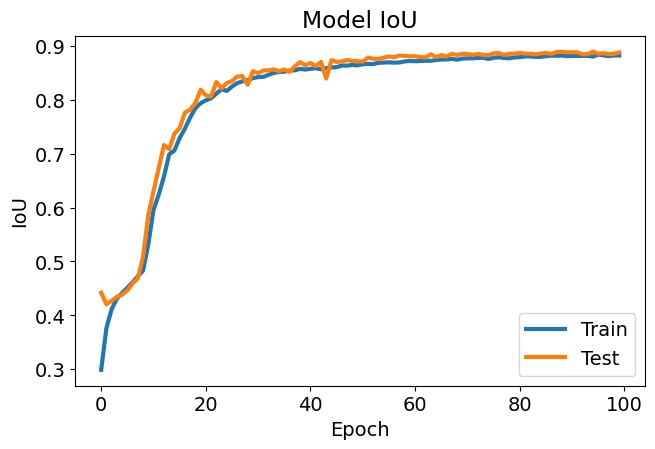

In [ ]:
import matplotlib.pyplot as plt
# Adjust font size and line width
plt.rcParams['font.size'] = 14
plt.rcParams['lines.linewidth'] = 3
# Plot training & validation IoU values
# Convert list of tensors to list of numpy arrays
train_miou = [x.cpu().numpy() for x in history['train_miou']]
val_miou = [x.cpu().numpy() for x in history['val_miou']]

# Plot training & validation IoU values
plt.figure(figsize=(25, 10))
plt.subplot(2, 3, 1)
plt.plot(train_miou)
plt.plot(val_miou)
plt.title('Model IoU')
plt.ylabel('IoU')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='lower right')
plt.show()


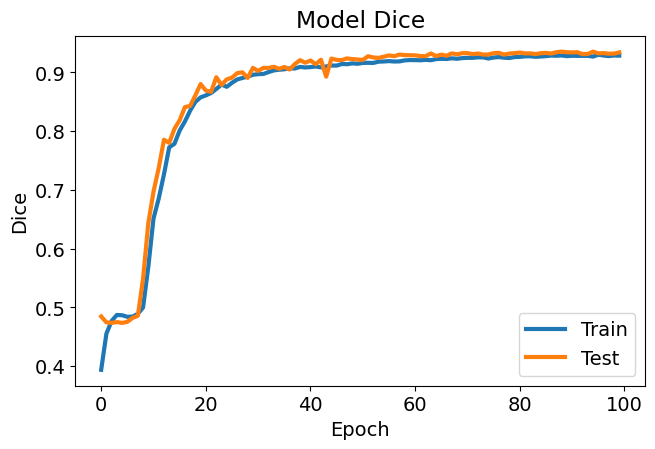

In [ ]:
import matplotlib.pyplot as plt
# Adjust font size and line width
plt.rcParams['font.size'] = 14
plt.rcParams['lines.linewidth'] = 3
# Plot training & validation IoU values
# Convert list of tensors to list of numpy arrays
train_miou = [x.cpu().numpy() for x in history['train_dice']]
val_miou = [x.cpu().numpy() for x in history['val_dice']]

# Plot training & validation IoU values
plt.figure(figsize=(25, 10))
plt.subplot(2, 3, 1)
plt.plot(train_miou)
plt.plot(val_miou)
plt.title('Model Dice')
plt.ylabel('Dice')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='lower right')
plt.show()


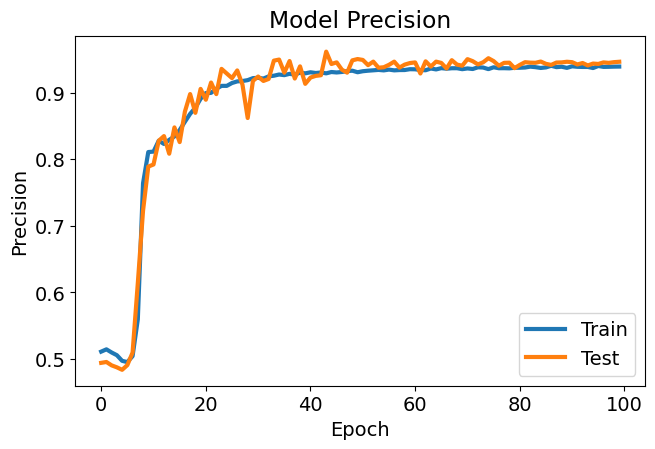

In [ ]:
trainX = [x.cpu().numpy() for x in history['train_Precision']]
valX = [x.cpu().numpy() for x in history['val_Precision']]
plt.figure(figsize=(25, 10))
plt.subplot(2, 3, 1)
plt.plot(trainX)
plt.plot(valX)
plt.title('Model Precision')
plt.ylabel('Precision')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='lower right')

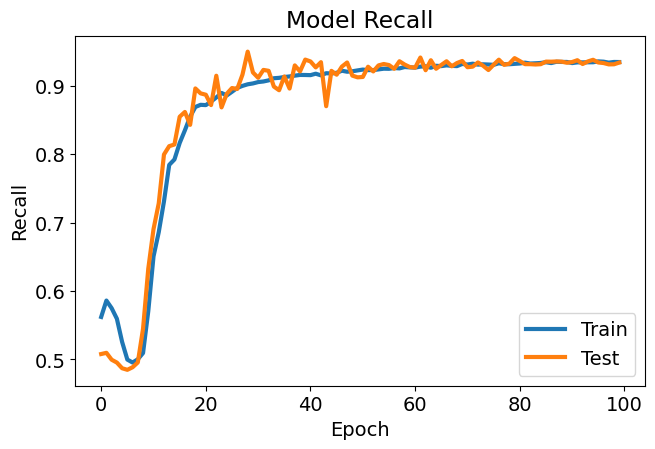

In [ ]:
trainX = [x.cpu().numpy() for x in history['train_recall']]
valX = [x.cpu().numpy() for x in history['val_recall']]
plt.figure(figsize=(25, 10))
plt.subplot(2, 3, 1)
plt.plot(trainX)
plt.plot(valX)
plt.title('Model Recall')
plt.ylabel('Recall')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='lower right')

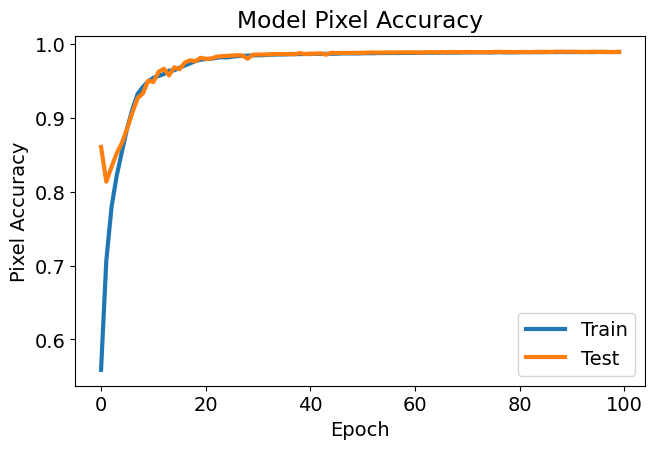

In [ ]:
trainX = [x.cpu().numpy() for x in history['train_acc']]
valX = [x.cpu().numpy() for x in history['val_acc']]
plt.figure(figsize=(25, 10))
plt.subplot(2, 3, 1)
plt.plot(trainX)
plt.plot(valX)
plt.title('Model Pixel Accuracy')
plt.ylabel('Pixel Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='lower right')

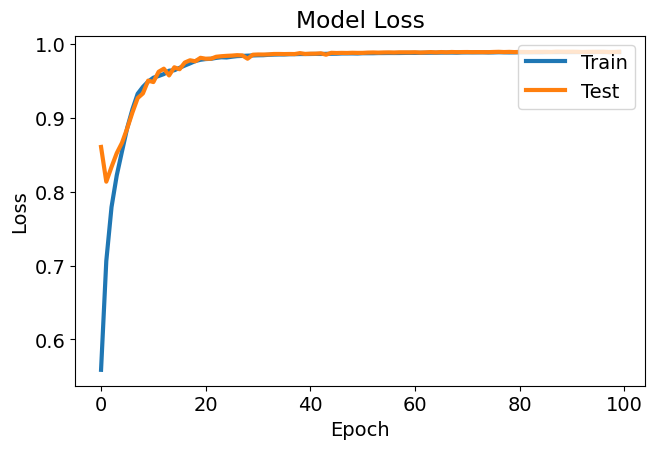

In [ ]:
trainX = [x.cpu().numpy() for x in history['train_acc']]
valX = [x.cpu().numpy() for x in history['val_acc']]
plt.figure(figsize=(25, 10))
plt.subplot(2, 3, 1)
plt.plot(trainX)
plt.plot(valX)
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper right')

In [ ]:
class TestDataset(Dataset):

    def __init__(self, img_path, mask_path, X, Xmask, transform=None):
        self.img_path = img_path
        self.mask_path = mask_path
        self.X = X
        self.Xmask = Xmask
        self.transform = transform

    def __len__(self):
        return len(self.X)

    def __getitem__(self, idx):
        img = cv2.imread(self.img_path +self.X[idx] + '.TIFF')
        #img[45:64, :] = 0
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        mask = cv2.imread(self.mask_path + self.Xmask[idx] + '.TIFF', cv2.IMREAD_GRAYSCALE)
        mask=mask/255
        if self.transform is not None:
            aug = self.transform(image=img, mask=mask)
            img = Image.fromarray(aug['image'])
            mask = aug['mask']

        if self.transform is None:
            img = Image.fromarray(img)

        mask = torch.from_numpy(mask).long()

        return img, mask


t_test = A.Resize(64, 64, interpolation=cv2.INTER_NEAREST)
test_set = TestDataset(IMAGE_PATH, MASK_PATH, X_test,X_test_mask, transform=t_test)

In [ ]:
def predict_image_mask_miou(model, image, mask, mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]):
    model.eval()
    t = T.Compose([T.ToTensor(), T.Normalize(mean, std)])
    image = t(image)
    model.to(device); image=image.to(device)
    mask = mask.to(device)
    with torch.no_grad():

        image = image.unsqueeze(0)
        mask = mask.unsqueeze(0)

        output = model(image)
        score = mIoU(output, mask)
        masked = torch.argmax(output, dim=1)
        masked = masked.cpu().squeeze(0)
    return masked, score

In [ ]:
def predict_image_mask_pixel(model, image, mask, mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]):
    model.eval()
    t = T.Compose([T.ToTensor(), T.Normalize(mean, std)])
    image = t(image)
    model.to(device); image=image.to(device)
    mask = mask.to(device)
    with torch.no_grad():

        image = image.unsqueeze(0)
        mask = mask.unsqueeze(0)

        output = model(image)
        acc = pixel_accuracy(output, mask)
        masked = torch.argmax(output, dim=1)
        masked = masked.cpu().squeeze(0)
    return masked, acc

In [ ]:
def miou_score(model, test_set):
    score_iou = []
    for i in tqdm(range(len(test_set))):
        img, mask = test_set[i]
        pred_mask, score = predict_image_mask_miou(model, img, mask)
        score_iou.append(score)
    return score_iou

In [ ]:
def pixel_acc(model, test_set):
    accuracy = []
    for i in tqdm(range(len(test_set))):
        img, mask = test_set[i]
        pred_mask, acc = predict_image_mask_pixel(model, img, mask)
        accuracy.append(acc)
    return accuracy

In [ ]:
def predict_image_mask_dice(model, image, mask, mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]):
    model.eval()
    t = T.Compose([T.ToTensor(), T.Normalize(mean, std)])
    image = t(image)
    model.to(device); image=image.to(device)
    mask = mask.to(device)
    with torch.no_grad():

        image = image.unsqueeze(0)
        mask = mask.unsqueeze(0)

        output = model(image)
        score = dice_score(output, mask)  # Compute Dice score
        masked = torch.argmax(output, dim=1)
        masked = masked.cpu().squeeze(0)
    return masked, score

def dice_score_model(model, test_set):
    score_dice = []
    for i in tqdm(range(len(test_set))):
        img, mask = test_set[i]
        pred_mask, score = predict_image_mask_dice(model, img, mask)  # Use the new function
        score_dice.append(score)
    return score_dice

In [ ]:
mob_miou = miou_score(model, test_set)
dice_miou = dice_score_model(model, test_set)
mob_acc = pixel_acc(model, test_set)

  0%|          | 0/456 [00:00<?, ?it/s]

  0%|          | 0/456 [00:00<?, ?it/s]

  0%|          | 0/456 [00:00<?, ?it/s]

In [ ]:
print(np.mean(mob_miou))
print(np.mean(dice_miou))
print(np.mean(mob_acc))

0.8963664171666516
0.9408606464195473
0.9898039165296053


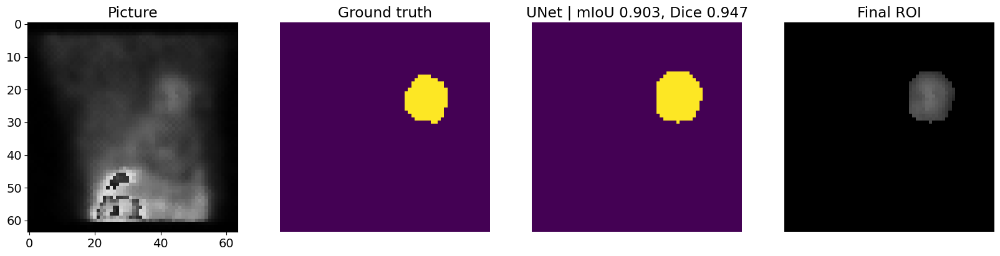

In [ ]:
from torchvision import transforms
image, mask = test_set[0]
pred_mask, Dscore = predict_image_mask_dice(model, image, mask)
pred_mask, score = predict_image_mask_miou(model, image, mask)
# Convert the PIL Image to a PyTorch Tensor
image_tensor = transforms.ToTensor()(image)

# Ensure the mask is on the same device as the image tensor
pred_mask = pred_mask.to(image_tensor.device)

# Apply the mask to the image tensor
masked_image = image_tensor * pred_mask.unsqueeze(0)

# Now, let's add the masked image to the plot
fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(20, 10))  # Create 4 subplots

ax1.imshow(image_tensor.permute(1, 2, 0))  # Permute the tensor dimensions to match the expected input of imshow
ax1.set_title('Picture')

ax2.imshow(mask)
ax2.set_title('Ground truth')
ax2.set_axis_off()

ax3.imshow(pred_mask)
ax3.set_title('UNet | mIoU {:.3f}'.format(score) + ', Dice {:.3f}'.format(Dscore))
ax3.set_axis_off()

ax4.imshow(masked_image.permute(1, 2, 0))  # Permute the tensor dimensions to match the expected input of imshow
ax4.set_title('Final ROI')
ax4.set_axis_off()

plt.show()


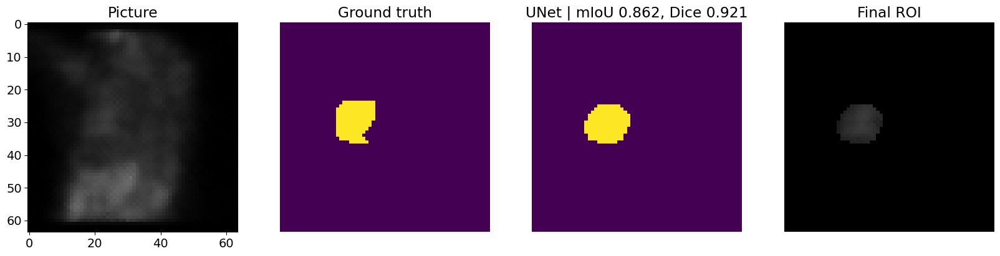

In [ ]:
from torchvision import transforms
image, mask = test_set[1]
pred_mask, Dscore = predict_image_mask_dice(model, image, mask)
pred_mask, score = predict_image_mask_miou(model, image, mask)
# Convert the PIL Image to a PyTorch Tensor
image_tensor = transforms.ToTensor()(image)

# Ensure the mask is on the same device as the image tensor
pred_mask = pred_mask.to(image_tensor.device)

# Apply the mask to the image tensor
masked_image = image_tensor * pred_mask.unsqueeze(0)

# Now, let's add the masked image to the plot
fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(20, 10))  # Create 4 subplots

ax1.imshow(image_tensor.permute(1, 2, 0))  # Permute the tensor dimensions to match the expected input of imshow
ax1.set_title('Picture')

ax2.imshow(mask)
ax2.set_title('Ground truth')
ax2.set_axis_off()

ax3.imshow(pred_mask)
ax3.set_title('UNet | mIoU {:.3f}'.format(score) + ', Dice {:.3f}'.format(Dscore))
ax3.set_axis_off()

ax4.imshow(masked_image.permute(1, 2, 0))  # Permute the tensor dimensions to match the expected input of imshow
ax4.set_title('Final ROI')
ax4.set_axis_off()

plt.show()


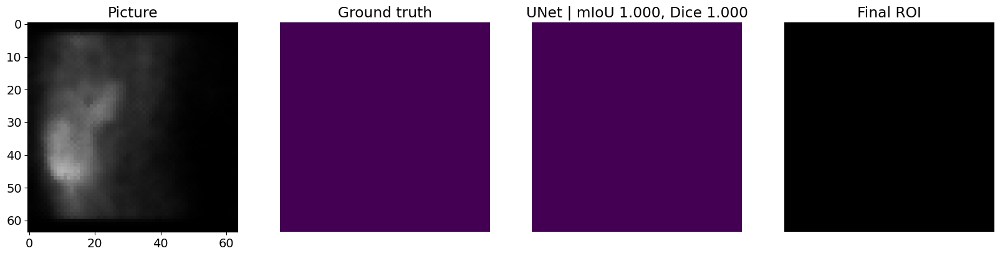

In [ ]:
from torchvision import transforms
image, mask = test_set[2]
pred_mask, Dscore = predict_image_mask_dice(model, image, mask)
pred_mask, score = predict_image_mask_miou(model, image, mask)
# Convert the PIL Image to a PyTorch Tensor
image_tensor = transforms.ToTensor()(image)

# Ensure the mask is on the same device as the image tensor
pred_mask = pred_mask.to(image_tensor.device)

# Apply the mask to the image tensor
masked_image = image_tensor * pred_mask.unsqueeze(0)

# Now, let's add the masked image to the plot
fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(20, 10))  # Create 4 subplots

ax1.imshow(image_tensor.permute(1, 2, 0))  # Permute the tensor dimensions to match the expected input of imshow
ax1.set_title('Picture')

ax2.imshow(mask)
ax2.set_title('Ground truth')
ax2.set_axis_off()

ax3.imshow(pred_mask)
ax3.set_title('UNet | mIoU {:.3f}'.format(score) + ', Dice {:.3f}'.format(Dscore))
ax3.set_axis_off()

ax4.imshow(masked_image.permute(1, 2, 0))  # Permute the tensor dimensions to match the expected input of imshow
ax4.set_title('Final ROI')
ax4.set_axis_off()

plt.show()


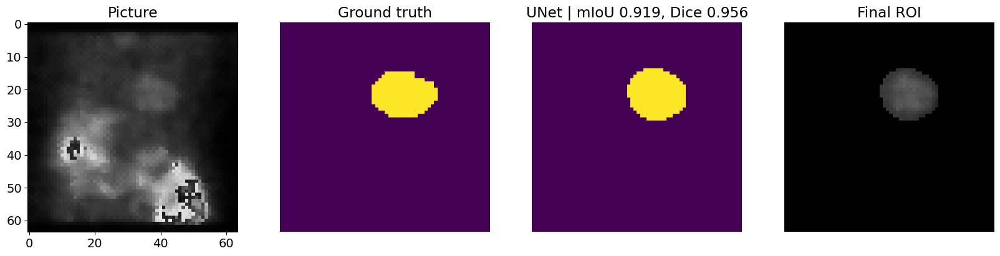

In [ ]:
from torchvision import transforms
image, mask = test_set[5]
pred_mask, Dscore = predict_image_mask_dice(model, image, mask)
pred_mask, score = predict_image_mask_miou(model, image, mask)
# Convert the PIL Image to a PyTorch Tensor
image_tensor = transforms.ToTensor()(image)

# Ensure the mask is on the same device as the image tensor
pred_mask = pred_mask.to(image_tensor.device)

# Apply the mask to the image tensor
masked_image = image_tensor * pred_mask.unsqueeze(0)

# Now, let's add the masked image to the plot
fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(20, 10))  # Create 4 subplots

ax1.imshow(image_tensor.permute(1, 2, 0))  # Permute the tensor dimensions to match the expected input of imshow
ax1.set_title('Picture')

ax2.imshow(mask)
ax2.set_title('Ground truth')
ax2.set_axis_off()

ax3.imshow(pred_mask)
ax3.set_title('UNet | mIoU {:.3f}'.format(score) + ', Dice {:.3f}'.format(Dscore))
ax3.set_axis_off()

ax4.imshow(masked_image.permute(1, 2, 0))  # Permute the tensor dimensions to match the expected input of imshow
ax4.set_title('Final ROI')
ax4.set_axis_off()

plt.show()


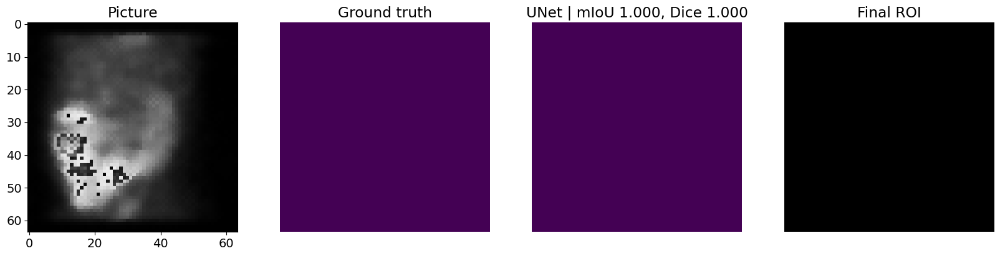

In [ ]:
from torchvision import transforms
image, mask = test_set[10]
pred_mask, Dscore = predict_image_mask_dice(model, image, mask)
pred_mask, score = predict_image_mask_miou(model, image, mask)
# Convert the PIL Image to a PyTorch Tensor
image_tensor = transforms.ToTensor()(image)

# Ensure the mask is on the same device as the image tensor
pred_mask = pred_mask.to(image_tensor.device)

# Apply the mask to the image tensor
masked_image = image_tensor * pred_mask.unsqueeze(0)

# Now, let's add the masked image to the plot
fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(20, 10))  # Create 4 subplots

ax1.imshow(image_tensor.permute(1, 2, 0))  # Permute the tensor dimensions to match the expected input of imshow
ax1.set_title('Picture')

ax2.imshow(mask)
ax2.set_title('Ground truth')
ax2.set_axis_off()

ax3.imshow(pred_mask)
ax3.set_title('UNet | mIoU {:.3f}'.format(score) + ', Dice {:.3f}'.format(Dscore))
ax3.set_axis_off()

ax4.imshow(masked_image.permute(1, 2, 0))  # Permute the tensor dimensions to match the expected input of imshow
ax4.set_title('Final ROI')
ax4.set_axis_off()

plt.show()


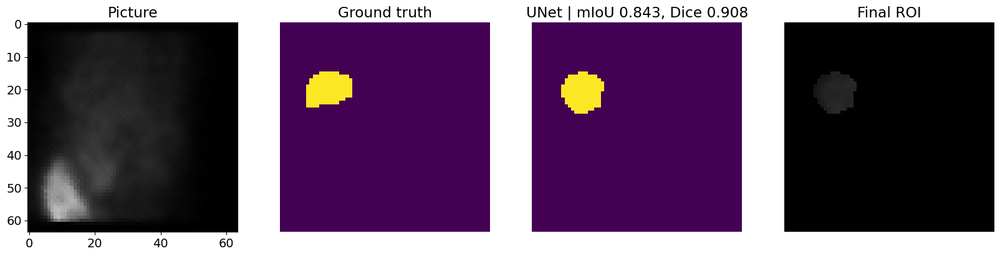

In [ ]:
from torchvision import transforms
image, mask = test_set[20]
pred_mask, Dscore = predict_image_mask_dice(model, image, mask)
pred_mask, score = predict_image_mask_miou(model, image, mask)
# Convert the PIL Image to a PyTorch Tensor
image_tensor = transforms.ToTensor()(image)

# Ensure the mask is on the same device as the image tensor
pred_mask = pred_mask.to(image_tensor.device)

# Apply the mask to the image tensor
masked_image = image_tensor * pred_mask.unsqueeze(0)

# Now, let's add the masked image to the plot
fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(20, 10))  # Create 4 subplots

ax1.imshow(image_tensor.permute(1, 2, 0))  # Permute the tensor dimensions to match the expected input of imshow
ax1.set_title('Picture')

ax2.imshow(mask)
ax2.set_title('Ground truth')
ax2.set_axis_off()

ax3.imshow(pred_mask)
ax3.set_title('UNet | mIoU {:.3f}'.format(score) + ', Dice {:.3f}'.format(Dscore))
ax3.set_axis_off()

ax4.imshow(masked_image.permute(1, 2, 0))  # Permute the tensor dimensions to match the expected input of imshow
ax4.set_title('Final ROI')
ax4.set_axis_off()

plt.show()


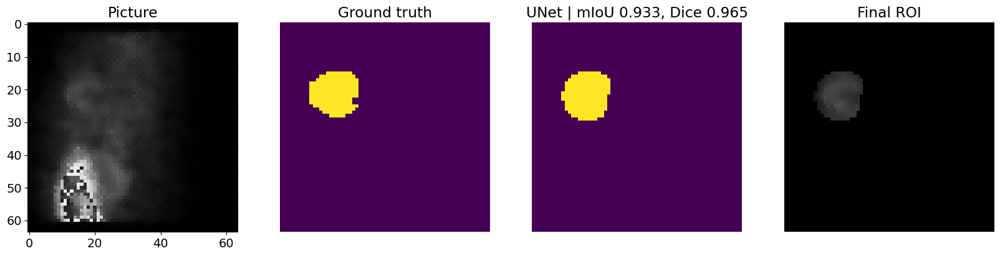

In [ ]:
from torchvision import transforms
image, mask = test_set[30]
pred_mask, Dscore = predict_image_mask_dice(model, image, mask)
pred_mask, score = predict_image_mask_miou(model, image, mask)
# Convert the PIL Image to a PyTorch Tensor
image_tensor = transforms.ToTensor()(image)

# Ensure the mask is on the same device as the image tensor
pred_mask = pred_mask.to(image_tensor.device)

# Apply the mask to the image tensor
masked_image = image_tensor * pred_mask.unsqueeze(0)

# Now, let's add the masked image to the plot
fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(20, 10))  # Create 4 subplots

ax1.imshow(image_tensor.permute(1, 2, 0))  # Permute the tensor dimensions to match the expected input of imshow
ax1.set_title('Picture')

ax2.imshow(mask)
ax2.set_title('Ground truth')
ax2.set_axis_off()

ax3.imshow(pred_mask)
ax3.set_title('UNet | mIoU {:.3f}'.format(score) + ', Dice {:.3f}'.format(Dscore))
ax3.set_axis_off()

ax4.imshow(masked_image.permute(1, 2, 0))  # Permute the tensor dimensions to match the expected input of imshow
ax4.set_title('Final ROI')
ax4.set_axis_off()

plt.show()


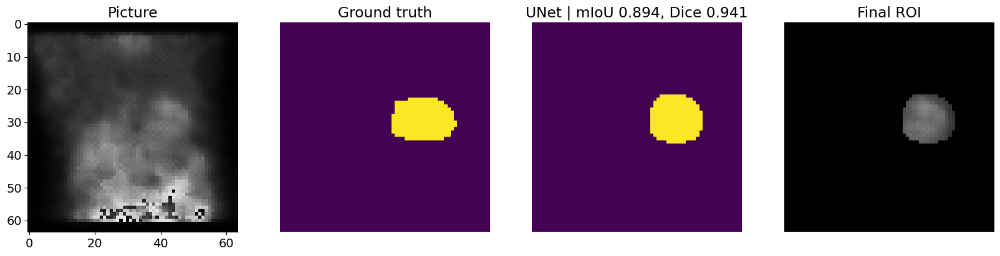

In [ ]:
from torchvision import transforms
image, mask = test_set[70]
pred_mask, Dscore = predict_image_mask_dice(model, image, mask)
pred_mask, score = predict_image_mask_miou(model, image, mask)
# Convert the PIL Image to a PyTorch Tensor
image_tensor = transforms.ToTensor()(image)

# Ensure the mask is on the same device as the image tensor
pred_mask = pred_mask.to(image_tensor.device)

# Apply the mask to the image tensor
masked_image = image_tensor * pred_mask.unsqueeze(0)

# Now, let's add the masked image to the plot
fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(20, 10))  # Create 4 subplots

ax1.imshow(image_tensor.permute(1, 2, 0))  # Permute the tensor dimensions to match the expected input of imshow
ax1.set_title('Picture')

ax2.imshow(mask)
ax2.set_title('Ground truth')
ax2.set_axis_off()

ax3.imshow(pred_mask)
ax3.set_title('UNet | mIoU {:.3f}'.format(score) + ', Dice {:.3f}'.format(Dscore))
ax3.set_axis_off()

ax4.imshow(masked_image.permute(1, 2, 0))  # Permute the tensor dimensions to match the expected input of imshow
ax4.set_title('Final ROI')
ax4.set_axis_off()

plt.show()


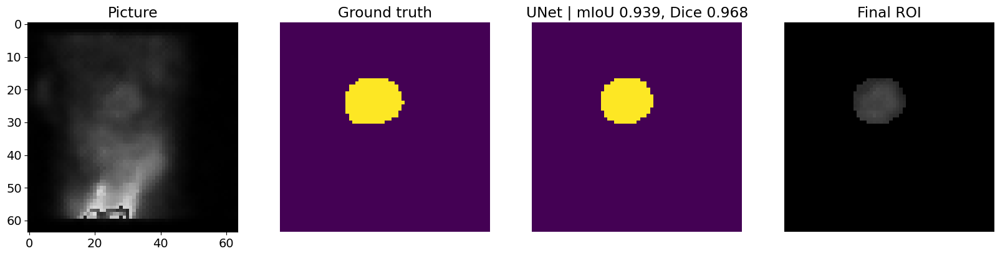

In [ ]:
from torchvision import transforms
image, mask = test_set[125]
pred_mask, Dscore = predict_image_mask_dice(model, image, mask)
pred_mask, score = predict_image_mask_miou(model, image, mask)
# Convert the PIL Image to a PyTorch Tensor
image_tensor = transforms.ToTensor()(image)

# Ensure the mask is on the same device as the image tensor
pred_mask = pred_mask.to(image_tensor.device)

# Apply the mask to the image tensor
masked_image = image_tensor * pred_mask.unsqueeze(0)

# Now, let's add the masked image to the plot
fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(20, 10))  # Create 4 subplots

ax1.imshow(image_tensor.permute(1, 2, 0))  # Permute the tensor dimensions to match the expected input of imshow
ax1.set_title('Picture')

ax2.imshow(mask)
ax2.set_title('Ground truth')
ax2.set_axis_off()

ax3.imshow(pred_mask)
ax3.set_title('UNet | mIoU {:.3f}'.format(score) + ', Dice {:.3f}'.format(Dscore))
ax3.set_axis_off()

ax4.imshow(masked_image.permute(1, 2, 0))  # Permute the tensor dimensions to match the expected input of imshow
ax4.set_title('Final ROI')
ax4.set_axis_off()

plt.show()


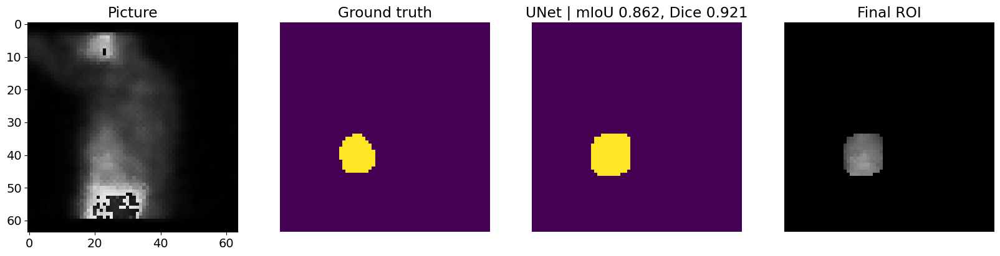

In [ ]:
from torchvision import transforms
image, mask = test_set[3]
pred_mask, Dscore = predict_image_mask_dice(model, image, mask)
pred_mask, score = predict_image_mask_miou(model, image, mask)
# Convert the PIL Image to a PyTorch Tensor
image_tensor = transforms.ToTensor()(image)

# Ensure the mask is on the same device as the image tensor
pred_mask = pred_mask.to(image_tensor.device)

# Apply the mask to the image tensor
masked_image = image_tensor * pred_mask.unsqueeze(0)

# Now, let's add the masked image to the plot
fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(20, 10))  # Create 4 subplots

ax1.imshow(image_tensor.permute(1, 2, 0))  # Permute the tensor dimensions to match the expected input of imshow
ax1.set_title('Picture')

ax2.imshow(mask)
ax2.set_title('Ground truth')
ax2.set_axis_off()

ax3.imshow(pred_mask)
ax3.set_title('UNet | mIoU {:.3f}'.format(score) + ', Dice {:.3f}'.format(Dscore))
ax3.set_axis_off()

ax4.imshow(masked_image.permute(1, 2, 0))  # Permute the tensor dimensions to match the expected input of imshow
ax4.set_title('Final ROI')
ax4.set_axis_off()

plt.show()


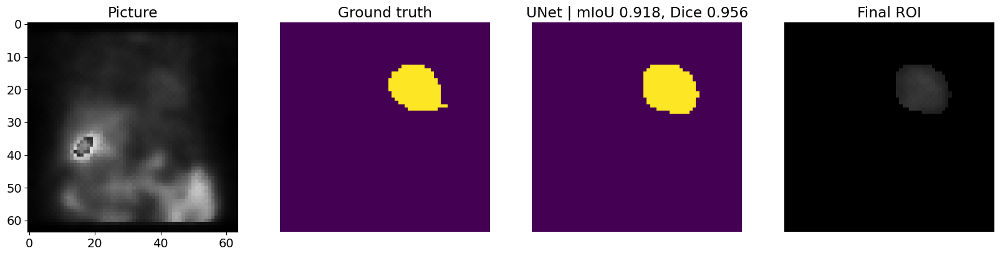

In [ ]:
from torchvision import transforms
image, mask = test_set[7]
pred_mask, Dscore = predict_image_mask_dice(model, image, mask)
pred_mask, score = predict_image_mask_miou(model, image, mask)
# Convert the PIL Image to a PyTorch Tensor
image_tensor = transforms.ToTensor()(image)

# Ensure the mask is on the same device as the image tensor
pred_mask = pred_mask.to(image_tensor.device)

# Apply the mask to the image tensor
masked_image = image_tensor * pred_mask.unsqueeze(0)

# Now, let's add the masked image to the plot
fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(20, 10))  # Create 4 subplots

ax1.imshow(image_tensor.permute(1, 2, 0))  # Permute the tensor dimensions to match the expected input of imshow
ax1.set_title('Picture')

ax2.imshow(mask)
ax2.set_title('Ground truth')
ax2.set_axis_off()

ax3.imshow(pred_mask)
ax3.set_title('UNet | mIoU {:.3f}'.format(score) + ', Dice {:.3f}'.format(Dscore))
ax3.set_axis_off()

ax4.imshow(masked_image.permute(1, 2, 0))  # Permute the tensor dimensions to match the expected input of imshow
ax4.set_title('Final ROI')
ax4.set_axis_off()

plt.show()


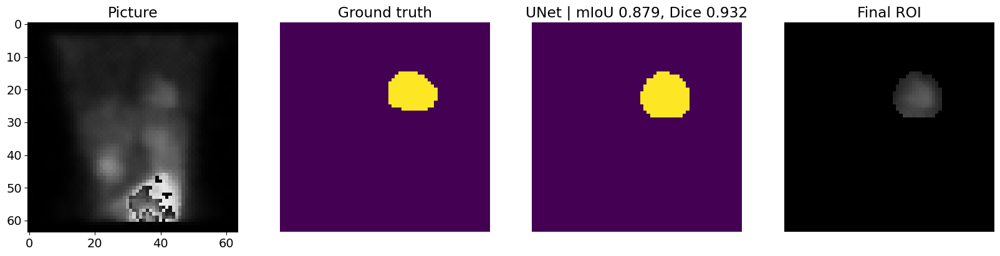

In [ ]:
from torchvision import transforms
image, mask = test_set[22]
pred_mask, Dscore = predict_image_mask_dice(model, image, mask)
pred_mask, score = predict_image_mask_miou(model, image, mask)
# Convert the PIL Image to a PyTorch Tensor
image_tensor = transforms.ToTensor()(image)

# Ensure the mask is on the same device as the image tensor
pred_mask = pred_mask.to(image_tensor.device)

# Apply the mask to the image tensor
masked_image = image_tensor * pred_mask.unsqueeze(0)

# Now, let's add the masked image to the plot
fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(20, 10))  # Create 4 subplots

ax1.imshow(image_tensor.permute(1, 2, 0))  # Permute the tensor dimensions to match the expected input of imshow
ax1.set_title('Picture')

ax2.imshow(mask)
ax2.set_title('Ground truth')
ax2.set_axis_off()

ax3.imshow(pred_mask)
ax3.set_title('UNet | mIoU {:.3f}'.format(score) + ', Dice {:.3f}'.format(Dscore))
ax3.set_axis_off()

ax4.imshow(masked_image.permute(1, 2, 0))  # Permute the tensor dimensions to match the expected input of imshow
ax4.set_title('Final ROI')
ax4.set_axis_off()

plt.show()


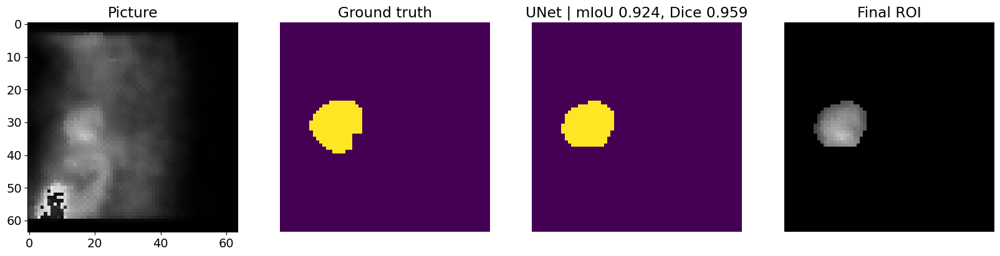

In [ ]:
from torchvision import transforms
image, mask = test_set[32]
pred_mask, Dscore = predict_image_mask_dice(model, image, mask)
pred_mask, score = predict_image_mask_miou(model, image, mask)
# Convert the PIL Image to a PyTorch Tensor
image_tensor = transforms.ToTensor()(image)

# Ensure the mask is on the same device as the image tensor
pred_mask = pred_mask.to(image_tensor.device)

# Apply the mask to the image tensor
masked_image = image_tensor * pred_mask.unsqueeze(0)

# Now, let's add the masked image to the plot
fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(20, 10))  # Create 4 subplots

ax1.imshow(image_tensor.permute(1, 2, 0))  # Permute the tensor dimensions to match the expected input of imshow
ax1.set_title('Picture')

ax2.imshow(mask)
ax2.set_title('Ground truth')
ax2.set_axis_off()

ax3.imshow(pred_mask)
ax3.set_title('UNet | mIoU {:.3f}'.format(score) + ', Dice {:.3f}'.format(Dscore))
ax3.set_axis_off()

ax4.imshow(masked_image.permute(1, 2, 0))  # Permute the tensor dimensions to match the expected input of imshow
ax4.set_title('Final ROI')
ax4.set_axis_off()

plt.show()


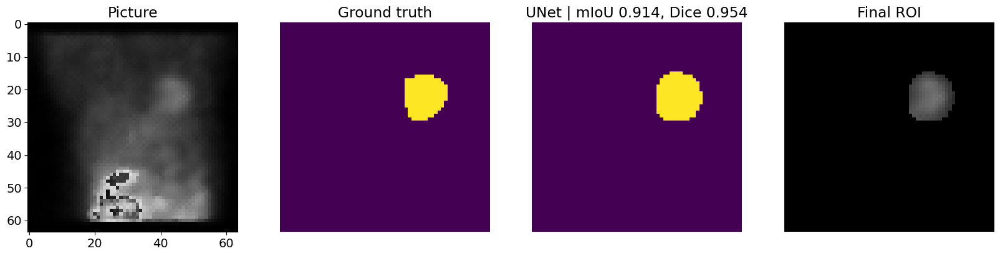

In [ ]:
from torchvision import transforms
image, mask = test_set[52]
pred_mask, Dscore = predict_image_mask_dice(model, image, mask)
pred_mask, score = predict_image_mask_miou(model, image, mask)
# Convert the PIL Image to a PyTorch Tensor
image_tensor = transforms.ToTensor()(image)

# Ensure the mask is on the same device as the image tensor
pred_mask = pred_mask.to(image_tensor.device)

# Apply the mask to the image tensor
masked_image = image_tensor * pred_mask.unsqueeze(0)

# Now, let's add the masked image to the plot
fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(20, 10))  # Create 4 subplots

ax1.imshow(image_tensor.permute(1, 2, 0))  # Permute the tensor dimensions to match the expected input of imshow
ax1.set_title('Picture')

ax2.imshow(mask)
ax2.set_title('Ground truth')
ax2.set_axis_off()

ax3.imshow(pred_mask)
ax3.set_title('UNet | mIoU {:.3f}'.format(score) + ', Dice {:.3f}'.format(Dscore))
ax3.set_axis_off()

ax4.imshow(masked_image.permute(1, 2, 0))  # Permute the tensor dimensions to match the expected input of imshow
ax4.set_title('Final ROI')
ax4.set_axis_off()

plt.show()


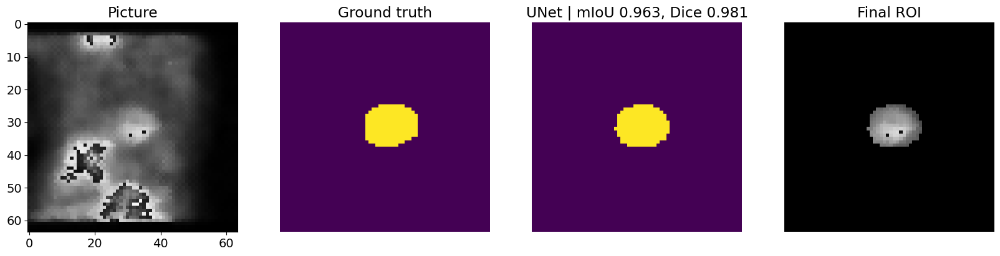

In [ ]:
from torchvision import transforms
image, mask = test_set[71]
pred_mask, Dscore = predict_image_mask_dice(model, image, mask)
pred_mask, score = predict_image_mask_miou(model, image, mask)
# Convert the PIL Image to a PyTorch Tensor
image_tensor = transforms.ToTensor()(image)

# Ensure the mask is on the same device as the image tensor
pred_mask = pred_mask.to(image_tensor.device)

# Apply the mask to the image tensor
masked_image = image_tensor * pred_mask.unsqueeze(0)

# Now, let's add the masked image to the plot
fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(20, 10))  # Create 4 subplots

ax1.imshow(image_tensor.permute(1, 2, 0))  # Permute the tensor dimensions to match the expected input of imshow
ax1.set_title('Picture')

ax2.imshow(mask)
ax2.set_title('Ground truth')
ax2.set_axis_off()

ax3.imshow(pred_mask)
ax3.set_title('UNet | mIoU {:.3f}'.format(score) + ', Dice {:.3f}'.format(Dscore))
ax3.set_axis_off()

ax4.imshow(masked_image.permute(1, 2, 0))  # Permute the tensor dimensions to match the expected input of imshow
ax4.set_title('Final ROI')
ax4.set_axis_off()

plt.show()


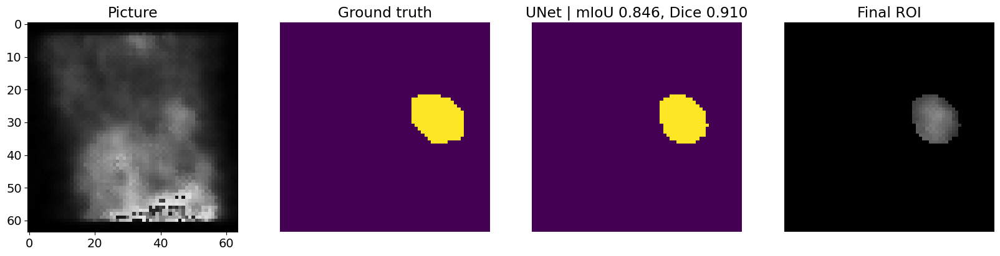

In [ ]:
from torchvision import transforms
image, mask = test_set[80]
pred_mask, Dscore = predict_image_mask_dice(model, image, mask)
pred_mask, score = predict_image_mask_miou(model, image, mask)
# Convert the PIL Image to a PyTorch Tensor
image_tensor = transforms.ToTensor()(image)

# Ensure the mask is on the same device as the image tensor
pred_mask = pred_mask.to(image_tensor.device)

# Apply the mask to the image tensor
masked_image = image_tensor * pred_mask.unsqueeze(0)

# Now, let's add the masked image to the plot
fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(20, 10))  # Create 4 subplots

ax1.imshow(image_tensor.permute(1, 2, 0))  # Permute the tensor dimensions to match the expected input of imshow
ax1.set_title('Picture')

ax2.imshow(mask)
ax2.set_title('Ground truth')
ax2.set_axis_off()

ax3.imshow(pred_mask)
ax3.set_title('UNet | mIoU {:.3f}'.format(score) + ', Dice {:.3f}'.format(Dscore))
ax3.set_axis_off()

ax4.imshow(masked_image.permute(1, 2, 0))  # Permute the tensor dimensions to match the expected input of imshow
ax4.set_title('Final ROI')
ax4.set_axis_off()

plt.show()


# Dice loss

In [ ]:
model = UNet(num_channels=3, num_classes=2)

In [ ]:
max_lr = 1e-4
epoch = 50
weight_decay = 1e-6

#
criterion = TverskyLoss(activation='softmax')
optimizer = torch.optim.AdamW(model.parameters(), lr=max_lr, weight_decay=weight_decay)
sched = torch.optim.lr_scheduler.OneCycleLR(optimizer, max_lr, epochs=epoch,
                                            steps_per_epoch=len(train_loader))

history = fit(epoch, model, train_loader, val_loader, criterion, optimizer, sched)

  0%|          | 0/735 [00:00<?, ?it/s]

  0%|          | 0/130 [00:00<?, ?it/s]

Loss Decreasing.. inf >> 0.565 
Epoch:1/50.. Train Loss: 0.609.. Val Loss: 0.565.. Train mIoU:0.433.. Val mIoU: 0.596.. Train Dice:0.533.. Val Dice: 0.698.. Train Precision:0.558.. Val Precision: 0.649.. Train Recall:0.749.. Val Recall: 0.912.. Train Accuracy:0.746.. Val Accuracy:0.902.. Time: 0.31m


  0%|          | 0/735 [00:00<?, ?it/s]

  0%|          | 0/130 [00:00<?, ?it/s]

Loss Decreasing.. 0.565 >> 0.544 
Epoch:2/50.. Train Loss: 0.559.. Val Loss: 0.544.. Train mIoU:0.609.. Val mIoU: 0.671.. Train Dice:0.711.. Val Dice: 0.768.. Train Precision:0.659.. Val Precision: 0.711.. Train Recall:0.908.. Val Recall: 0.914.. Train Accuracy:0.910.. Val Accuracy:0.941.. Time: 0.29m


  0%|          | 0/735 [00:00<?, ?it/s]

  0%|          | 0/130 [00:00<?, ?it/s]

Loss Decreasing.. 0.544 >> 0.533 
Epoch:3/50.. Train Loss: 0.541.. Val Loss: 0.533.. Train mIoU:0.662.. Val mIoU: 0.703.. Train Dice:0.760.. Val Dice: 0.795.. Train Precision:0.701.. Val Precision: 0.746.. Train Recall:0.917.. Val Recall: 0.894.. Train Accuracy:0.937.. Val Accuracy:0.955.. Time: 0.27m


  0%|          | 0/735 [00:00<?, ?it/s]

  0%|          | 0/130 [00:00<?, ?it/s]

Loss Decreasing.. 0.533 >> 0.517 
saving model...
Epoch:4/50.. Train Loss: 0.525.. Val Loss: 0.517.. Train mIoU:0.699.. Val mIoU: 0.738.. Train Dice:0.793.. Val Dice: 0.826.. Train Precision:0.734.. Val Precision: 0.780.. Train Recall:0.926.. Val Recall: 0.911.. Train Accuracy:0.950.. Val Accuracy:0.964.. Time: 0.27m


  0%|          | 0/735 [00:00<?, ?it/s]

  0%|          | 0/130 [00:00<?, ?it/s]

Loss Decreasing.. 0.517 >> 0.515 
Epoch:5/50.. Train Loss: 0.512.. Val Loss: 0.515.. Train mIoU:0.727.. Val mIoU: 0.655.. Train Dice:0.816.. Val Dice: 0.754.. Train Precision:0.759.. Val Precision: 0.694.. Train Recall:0.931.. Val Recall: 0.937.. Train Accuracy:0.958.. Val Accuracy:0.932.. Time: 0.27m


  0%|          | 0/735 [00:00<?, ?it/s]

  0%|          | 0/130 [00:00<?, ?it/s]

Loss Decreasing.. 0.515 >> 0.503 
Epoch:6/50.. Train Loss: 0.500.. Val Loss: 0.503.. Train mIoU:0.748.. Val mIoU: 0.748.. Train Dice:0.835.. Val Dice: 0.833.. Train Precision:0.779.. Val Precision: 0.801.. Train Recall:0.940.. Val Recall: 0.895.. Train Accuracy:0.964.. Val Accuracy:0.968.. Time: 0.29m


  0%|          | 0/735 [00:00<?, ?it/s]

  0%|          | 0/130 [00:00<?, ?it/s]

Loss Decreasing.. 0.503 >> 0.494 
Epoch:7/50.. Train Loss: 0.493.. Val Loss: 0.494.. Train mIoU:0.770.. Val mIoU: 0.741.. Train Dice:0.852.. Val Dice: 0.828.. Train Precision:0.799.. Val Precision: 0.773.. Train Recall:0.945.. Val Recall: 0.939.. Train Accuracy:0.969.. Val Accuracy:0.962.. Time: 0.29m


  0%|          | 0/735 [00:00<?, ?it/s]

  0%|          | 0/130 [00:00<?, ?it/s]

Loss Decreasing.. 0.494 >> 0.491 
Epoch:8/50.. Train Loss: 0.490.. Val Loss: 0.491.. Train mIoU:0.778.. Val mIoU: 0.777.. Train Dice:0.858.. Val Dice: 0.856.. Train Precision:0.807.. Val Precision: 0.814.. Train Recall:0.947.. Val Recall: 0.934.. Train Accuracy:0.971.. Val Accuracy:0.971.. Time: 0.27m


  0%|          | 0/735 [00:00<?, ?it/s]

  0%|          | 0/130 [00:00<?, ?it/s]

Loss Decreasing.. 0.491 >> 0.487 
saving model...
Epoch:9/50.. Train Loss: 0.488.. Val Loss: 0.487.. Train mIoU:0.784.. Val mIoU: 0.795.. Train Dice:0.863.. Val Dice: 0.870.. Train Precision:0.814.. Val Precision: 0.825.. Train Recall:0.947.. Val Recall: 0.951.. Train Accuracy:0.972.. Val Accuracy:0.974.. Time: 0.26m


  0%|          | 0/735 [00:00<?, ?it/s]

  0%|          | 0/130 [00:00<?, ?it/s]

Loss Not Decrease for 1 time
Epoch:10/50.. Train Loss: 0.485.. Val Loss: 0.489.. Train mIoU:0.801.. Val mIoU: 0.749.. Train Dice:0.876.. Val Dice: 0.835.. Train Precision:0.828.. Val Precision: 0.774.. Train Recall:0.953.. Val Recall: 0.962.. Train Accuracy:0.975.. Val Accuracy:0.962.. Time: 0.27m


  0%|          | 0/735 [00:00<?, ?it/s]

  0%|          | 0/130 [00:00<?, ?it/s]

Loss Decreasing.. 0.489 >> 0.484 
Epoch:11/50.. Train Loss: 0.485.. Val Loss: 0.484.. Train mIoU:0.798.. Val mIoU: 0.798.. Train Dice:0.873.. Val Dice: 0.872.. Train Precision:0.825.. Val Precision: 0.823.. Train Recall:0.953.. Val Recall: 0.960.. Train Accuracy:0.975.. Val Accuracy:0.974.. Time: 0.29m


  0%|          | 0/735 [00:00<?, ?it/s]

  0%|          | 0/130 [00:00<?, ?it/s]

Loss Not Decrease for 2 time
Epoch:12/50.. Train Loss: 0.483.. Val Loss: 0.488.. Train mIoU:0.808.. Val mIoU: 0.818.. Train Dice:0.881.. Val Dice: 0.888.. Train Precision:0.833.. Val Precision: 0.864.. Train Recall:0.959.. Val Recall: 0.924.. Train Accuracy:0.976.. Val Accuracy:0.981.. Time: 0.27m


  0%|          | 0/735 [00:00<?, ?it/s]

  0%|          | 0/130 [00:00<?, ?it/s]

Loss Decreasing.. 0.488 >> 0.483 
Epoch:13/50.. Train Loss: 0.483.. Val Loss: 0.483.. Train mIoU:0.813.. Val mIoU: 0.819.. Train Dice:0.885.. Val Dice: 0.890.. Train Precision:0.838.. Val Precision: 0.844.. Train Recall:0.960.. Val Recall: 0.961.. Train Accuracy:0.977.. Val Accuracy:0.979.. Time: 0.27m


  0%|          | 0/735 [00:00<?, ?it/s]

  0%|          | 0/130 [00:00<?, ?it/s]

Loss Not Decrease for 3 time
Epoch:14/50.. Train Loss: 0.482.. Val Loss: 0.483.. Train mIoU:0.820.. Val mIoU: 0.818.. Train Dice:0.890.. Val Dice: 0.888.. Train Precision:0.844.. Val Precision: 0.845.. Train Recall:0.961.. Val Recall: 0.957.. Train Accuracy:0.979.. Val Accuracy:0.979.. Time: 0.26m


  0%|          | 0/735 [00:00<?, ?it/s]

  0%|          | 0/130 [00:00<?, ?it/s]

Loss Not Decrease for 4 time
Epoch:15/50.. Train Loss: 0.482.. Val Loss: 0.484.. Train mIoU:0.821.. Val mIoU: 0.781.. Train Dice:0.890.. Val Dice: 0.861.. Train Precision:0.844.. Val Precision: 0.802.. Train Recall:0.963.. Val Recall: 0.969.. Train Accuracy:0.979.. Val Accuracy:0.970.. Time: 0.27m


  0%|          | 0/735 [00:00<?, ?it/s]

  0%|          | 0/130 [00:00<?, ?it/s]

Loss Decreasing.. 0.484 >> 0.483 
Epoch:16/50.. Train Loss: 0.482.. Val Loss: 0.483.. Train mIoU:0.825.. Val mIoU: 0.820.. Train Dice:0.893.. Val Dice: 0.890.. Train Precision:0.848.. Val Precision: 0.848.. Train Recall:0.962.. Val Recall: 0.956.. Train Accuracy:0.979.. Val Accuracy:0.979.. Time: 0.28m


  0%|          | 0/735 [00:00<?, ?it/s]

  0%|          | 0/130 [00:00<?, ?it/s]

Loss Decreasing.. 0.483 >> 0.482 
Epoch:17/50.. Train Loss: 0.481.. Val Loss: 0.482.. Train mIoU:0.824.. Val mIoU: 0.823.. Train Dice:0.893.. Val Dice: 0.891.. Train Precision:0.847.. Val Precision: 0.846.. Train Recall:0.963.. Val Recall: 0.965.. Train Accuracy:0.979.. Val Accuracy:0.979.. Time: 0.28m


  0%|          | 0/735 [00:00<?, ?it/s]

  0%|          | 0/130 [00:00<?, ?it/s]

Loss Not Decrease for 5 time
Epoch:18/50.. Train Loss: 0.481.. Val Loss: 0.483.. Train mIoU:0.824.. Val mIoU: 0.786.. Train Dice:0.893.. Val Dice: 0.865.. Train Precision:0.848.. Val Precision: 0.807.. Train Recall:0.963.. Val Recall: 0.971.. Train Accuracy:0.979.. Val Accuracy:0.971.. Time: 0.27m


  0%|          | 0/735 [00:00<?, ?it/s]

  0%|          | 0/130 [00:00<?, ?it/s]

Loss Decreasing.. 0.483 >> 0.482 
saving model...
Epoch:19/50.. Train Loss: 0.481.. Val Loss: 0.482.. Train mIoU:0.827.. Val mIoU: 0.813.. Train Dice:0.895.. Val Dice: 0.884.. Train Precision:0.850.. Val Precision: 0.832.. Train Recall:0.965.. Val Recall: 0.971.. Train Accuracy:0.980.. Val Accuracy:0.977.. Time: 0.27m


  0%|          | 0/735 [00:00<?, ?it/s]

  0%|          | 0/130 [00:00<?, ?it/s]

Loss Decreasing.. 0.482 >> 0.481 
Epoch:20/50.. Train Loss: 0.480.. Val Loss: 0.481.. Train mIoU:0.835.. Val mIoU: 0.818.. Train Dice:0.901.. Val Dice: 0.889.. Train Precision:0.857.. Val Precision: 0.837.. Train Recall:0.968.. Val Recall: 0.973.. Train Accuracy:0.981.. Val Accuracy:0.978.. Time: 0.29m


  0%|          | 0/735 [00:00<?, ?it/s]

  0%|          | 0/130 [00:00<?, ?it/s]

Loss Decreasing.. 0.481 >> 0.481 
Epoch:21/50.. Train Loss: 0.480.. Val Loss: 0.481.. Train mIoU:0.833.. Val mIoU: 0.850.. Train Dice:0.899.. Val Dice: 0.912.. Train Precision:0.854.. Val Precision: 0.875.. Train Recall:0.967.. Val Recall: 0.962.. Train Accuracy:0.981.. Val Accuracy:0.984.. Time: 0.28m


  0%|          | 0/735 [00:00<?, ?it/s]

  0%|          | 0/130 [00:00<?, ?it/s]

Loss Decreasing.. 0.481 >> 0.480 
Epoch:22/50.. Train Loss: 0.480.. Val Loss: 0.480.. Train mIoU:0.837.. Val mIoU: 0.846.. Train Dice:0.902.. Val Dice: 0.908.. Train Precision:0.857.. Val Precision: 0.865.. Train Recall:0.970.. Val Recall: 0.972.. Train Accuracy:0.981.. Val Accuracy:0.983.. Time: 0.28m


  0%|          | 0/735 [00:00<?, ?it/s]

  0%|          | 0/130 [00:00<?, ?it/s]

Loss Not Decrease for 6 time
Epoch:23/50.. Train Loss: 0.480.. Val Loss: 0.481.. Train mIoU:0.834.. Val mIoU: 0.808.. Train Dice:0.900.. Val Dice: 0.881.. Train Precision:0.855.. Val Precision: 0.827.. Train Recall:0.968.. Val Recall: 0.972.. Train Accuracy:0.981.. Val Accuracy:0.976.. Time: 0.32m


  0%|          | 0/735 [00:00<?, ?it/s]

  0%|          | 0/130 [00:00<?, ?it/s]

Loss Not Decrease for 7 time
Epoch:24/50.. Train Loss: 0.479.. Val Loss: 0.482.. Train mIoU:0.841.. Val mIoU: 0.844.. Train Dice:0.905.. Val Dice: 0.907.. Train Precision:0.861.. Val Precision: 0.871.. Train Recall:0.971.. Val Recall: 0.959.. Train Accuracy:0.982.. Val Accuracy:0.983.. Time: 0.29m


  0%|          | 0/735 [00:00<?, ?it/s]

  0%|          | 0/130 [00:00<?, ?it/s]

Loss Decreasing.. 0.482 >> 0.482 
Epoch:25/50.. Train Loss: 0.480.. Val Loss: 0.482.. Train mIoU:0.834.. Val mIoU: 0.824.. Train Dice:0.900.. Val Dice: 0.892.. Train Precision:0.855.. Val Precision: 0.843.. Train Recall:0.968.. Val Recall: 0.971.. Train Accuracy:0.981.. Val Accuracy:0.979.. Time: 0.28m


  0%|          | 0/735 [00:00<?, ?it/s]

  0%|          | 0/130 [00:00<?, ?it/s]

Loss Decreasing.. 0.482 >> 0.480 
saving model...
Epoch:26/50.. Train Loss: 0.480.. Val Loss: 0.480.. Train mIoU:0.841.. Val mIoU: 0.841.. Train Dice:0.905.. Val Dice: 0.905.. Train Precision:0.861.. Val Precision: 0.860.. Train Recall:0.971.. Val Recall: 0.973.. Train Accuracy:0.982.. Val Accuracy:0.982.. Time: 0.28m


  0%|          | 0/735 [00:00<?, ?it/s]

  0%|          | 0/130 [00:00<?, ?it/s]

Loss Not Decrease for 8 time
Epoch:27/50.. Train Loss: 0.479.. Val Loss: 0.481.. Train mIoU:0.846.. Val mIoU: 0.822.. Train Dice:0.909.. Val Dice: 0.891.. Train Precision:0.866.. Val Precision: 0.842.. Train Recall:0.972.. Val Recall: 0.971.. Train Accuracy:0.983.. Val Accuracy:0.979.. Time: 0.28m


  0%|          | 0/735 [00:00<?, ?it/s]

  0%|          | 0/130 [00:00<?, ?it/s]

Loss Decreasing.. 0.481 >> 0.480 
Epoch:28/50.. Train Loss: 0.479.. Val Loss: 0.480.. Train mIoU:0.844.. Val mIoU: 0.835.. Train Dice:0.907.. Val Dice: 0.900.. Train Precision:0.863.. Val Precision: 0.853.. Train Recall:0.972.. Val Recall: 0.973.. Train Accuracy:0.983.. Val Accuracy:0.981.. Time: 0.29m


  0%|          | 0/735 [00:00<?, ?it/s]

  0%|          | 0/130 [00:00<?, ?it/s]

Loss Decreasing.. 0.480 >> 0.480 
Epoch:29/50.. Train Loss: 0.479.. Val Loss: 0.480.. Train mIoU:0.847.. Val mIoU: 0.855.. Train Dice:0.910.. Val Dice: 0.914.. Train Precision:0.867.. Val Precision: 0.877.. Train Recall:0.972.. Val Recall: 0.969.. Train Accuracy:0.983.. Val Accuracy:0.985.. Time: 0.27m


  0%|          | 0/735 [00:00<?, ?it/s]

  0%|          | 0/130 [00:00<?, ?it/s]

Loss Not Decrease for 9 time
Epoch:30/50.. Train Loss: 0.479.. Val Loss: 0.480.. Train mIoU:0.845.. Val mIoU: 0.824.. Train Dice:0.908.. Val Dice: 0.893.. Train Precision:0.865.. Val Precision: 0.842.. Train Recall:0.973.. Val Recall: 0.974.. Train Accuracy:0.983.. Val Accuracy:0.979.. Time: 0.28m


  0%|          | 0/735 [00:00<?, ?it/s]

  0%|          | 0/130 [00:00<?, ?it/s]

Loss Decreasing.. 0.480 >> 0.480 
Epoch:31/50.. Train Loss: 0.479.. Val Loss: 0.480.. Train mIoU:0.848.. Val mIoU: 0.839.. Train Dice:0.910.. Val Dice: 0.904.. Train Precision:0.867.. Val Precision: 0.856.. Train Recall:0.973.. Val Recall: 0.976.. Train Accuracy:0.983.. Val Accuracy:0.982.. Time: 0.28m


  0%|          | 0/735 [00:00<?, ?it/s]

  0%|          | 0/130 [00:00<?, ?it/s]

Loss Not Decrease for 10 time
Epoch:32/50.. Train Loss: 0.479.. Val Loss: 0.481.. Train mIoU:0.846.. Val mIoU: 0.845.. Train Dice:0.908.. Val Dice: 0.908.. Train Precision:0.865.. Val Precision: 0.867.. Train Recall:0.972.. Val Recall: 0.969.. Train Accuracy:0.983.. Val Accuracy:0.983.. Time: 0.30m


  0%|          | 0/735 [00:00<?, ?it/s]

  0%|          | 0/130 [00:00<?, ?it/s]

Loss Decreasing.. 0.481 >> 0.480 
Epoch:33/50.. Train Loss: 0.479.. Val Loss: 0.480.. Train mIoU:0.850.. Val mIoU: 0.848.. Train Dice:0.912.. Val Dice: 0.910.. Train Precision:0.868.. Val Precision: 0.867.. Train Recall:0.974.. Val Recall: 0.973.. Train Accuracy:0.984.. Val Accuracy:0.983.. Time: 0.27m


  0%|          | 0/735 [00:00<?, ?it/s]

  0%|          | 0/130 [00:00<?, ?it/s]

Loss Decreasing.. 0.480 >> 0.479 
saving model...
Epoch:34/50.. Train Loss: 0.478.. Val Loss: 0.479.. Train mIoU:0.852.. Val mIoU: 0.852.. Train Dice:0.913.. Val Dice: 0.912.. Train Precision:0.871.. Val Precision: 0.869.. Train Recall:0.974.. Val Recall: 0.975.. Train Accuracy:0.984.. Val Accuracy:0.984.. Time: 0.29m


  0%|          | 0/735 [00:00<?, ?it/s]

  0%|          | 0/130 [00:00<?, ?it/s]

Loss Not Decrease for 11 time
Epoch:35/50.. Train Loss: 0.479.. Val Loss: 0.480.. Train mIoU:0.853.. Val mIoU: 0.863.. Train Dice:0.913.. Val Dice: 0.920.. Train Precision:0.871.. Val Precision: 0.885.. Train Recall:0.974.. Val Recall: 0.969.. Train Accuracy:0.984.. Val Accuracy:0.986.. Time: 0.28m


  0%|          | 0/735 [00:00<?, ?it/s]

  0%|          | 0/130 [00:00<?, ?it/s]

Loss Decreasing.. 0.480 >> 0.478 
Epoch:36/50.. Train Loss: 0.479.. Val Loss: 0.478.. Train mIoU:0.855.. Val mIoU: 0.856.. Train Dice:0.915.. Val Dice: 0.916.. Train Precision:0.872.. Val Precision: 0.874.. Train Recall:0.975.. Val Recall: 0.975.. Train Accuracy:0.984.. Val Accuracy:0.985.. Time: 0.30m


  0%|          | 0/735 [00:00<?, ?it/s]

  0%|          | 0/130 [00:00<?, ?it/s]

Loss Not Decrease for 12 time
Epoch:37/50.. Train Loss: 0.478.. Val Loss: 0.479.. Train mIoU:0.853.. Val mIoU: 0.856.. Train Dice:0.913.. Val Dice: 0.915.. Train Precision:0.871.. Val Precision: 0.875.. Train Recall:0.975.. Val Recall: 0.973.. Train Accuracy:0.984.. Val Accuracy:0.985.. Time: 0.27m


  0%|          | 0/735 [00:00<?, ?it/s]

  0%|          | 0/130 [00:00<?, ?it/s]

Loss Not Decrease for 13 time
Epoch:38/50.. Train Loss: 0.478.. Val Loss: 0.479.. Train mIoU:0.857.. Val mIoU: 0.856.. Train Dice:0.916.. Val Dice: 0.915.. Train Precision:0.874.. Val Precision: 0.875.. Train Recall:0.975.. Val Recall: 0.974.. Train Accuracy:0.984.. Val Accuracy:0.985.. Time: 0.28m


  0%|          | 0/735 [00:00<?, ?it/s]

  0%|          | 0/130 [00:00<?, ?it/s]

Loss Not Decrease for 14 time
Epoch:39/50.. Train Loss: 0.478.. Val Loss: 0.480.. Train mIoU:0.855.. Val mIoU: 0.858.. Train Dice:0.915.. Val Dice: 0.917.. Train Precision:0.873.. Val Precision: 0.876.. Train Recall:0.975.. Val Recall: 0.974.. Train Accuracy:0.984.. Val Accuracy:0.985.. Time: 0.28m


  0%|          | 0/735 [00:00<?, ?it/s]

  0%|          | 0/130 [00:00<?, ?it/s]

Loss Decreasing.. 0.480 >> 0.480 
Epoch:40/50.. Train Loss: 0.478.. Val Loss: 0.480.. Train mIoU:0.856.. Val mIoU: 0.852.. Train Dice:0.915.. Val Dice: 0.913.. Train Precision:0.873.. Val Precision: 0.869.. Train Recall:0.975.. Val Recall: 0.976.. Train Accuracy:0.984.. Val Accuracy:0.984.. Time: 0.29m


  0%|          | 0/735 [00:00<?, ?it/s]

  0%|          | 0/130 [00:00<?, ?it/s]

Loss Decreasing.. 0.480 >> 0.479 
Epoch:41/50.. Train Loss: 0.478.. Val Loss: 0.479.. Train mIoU:0.857.. Val mIoU: 0.848.. Train Dice:0.916.. Val Dice: 0.909.. Train Precision:0.874.. Val Precision: 0.865.. Train Recall:0.976.. Val Recall: 0.975.. Train Accuracy:0.984.. Val Accuracy:0.983.. Time: 0.29m


  0%|          | 0/735 [00:00<?, ?it/s]

  0%|          | 0/130 [00:00<?, ?it/s]

Loss Decreasing.. 0.479 >> 0.479 
Epoch:42/50.. Train Loss: 0.478.. Val Loss: 0.479.. Train mIoU:0.857.. Val mIoU: 0.858.. Train Dice:0.917.. Val Dice: 0.917.. Train Precision:0.874.. Val Precision: 0.876.. Train Recall:0.977.. Val Recall: 0.974.. Train Accuracy:0.984.. Val Accuracy:0.985.. Time: 0.28m


  0%|          | 0/735 [00:00<?, ?it/s]

  0%|          | 0/130 [00:00<?, ?it/s]

Loss Not Decrease for 15 time
Epoch:43/50.. Train Loss: 0.478.. Val Loss: 0.479.. Train mIoU:0.858.. Val mIoU: 0.855.. Train Dice:0.917.. Val Dice: 0.915.. Train Precision:0.875.. Val Precision: 0.871.. Train Recall:0.977.. Val Recall: 0.978.. Train Accuracy:0.985.. Val Accuracy:0.984.. Time: 0.27m


  0%|          | 0/735 [00:00<?, ?it/s]

  0%|          | 0/130 [00:00<?, ?it/s]

Loss Decreasing.. 0.479 >> 0.479 
saving model...
Epoch:44/50.. Train Loss: 0.478.. Val Loss: 0.479.. Train mIoU:0.859.. Val mIoU: 0.855.. Train Dice:0.917.. Val Dice: 0.914.. Train Precision:0.875.. Val Precision: 0.873.. Train Recall:0.977.. Val Recall: 0.974.. Train Accuracy:0.985.. Val Accuracy:0.984.. Time: 0.28m


  0%|          | 0/735 [00:00<?, ?it/s]

  0%|          | 0/130 [00:00<?, ?it/s]

Loss Not Decrease for 16 time
Epoch:45/50.. Train Loss: 0.478.. Val Loss: 0.479.. Train mIoU:0.859.. Val mIoU: 0.855.. Train Dice:0.918.. Val Dice: 0.915.. Train Precision:0.876.. Val Precision: 0.872.. Train Recall:0.977.. Val Recall: 0.976.. Train Accuracy:0.985.. Val Accuracy:0.984.. Time: 0.28m


  0%|          | 0/735 [00:00<?, ?it/s]

  0%|          | 0/130 [00:00<?, ?it/s]

Loss Decreasing.. 0.479 >> 0.479 
Epoch:46/50.. Train Loss: 0.478.. Val Loss: 0.479.. Train mIoU:0.860.. Val mIoU: 0.856.. Train Dice:0.919.. Val Dice: 0.915.. Train Precision:0.877.. Val Precision: 0.874.. Train Recall:0.977.. Val Recall: 0.975.. Train Accuracy:0.985.. Val Accuracy:0.985.. Time: 0.27m


  0%|          | 0/735 [00:00<?, ?it/s]

  0%|          | 0/130 [00:00<?, ?it/s]

Loss Not Decrease for 17 time
Epoch:47/50.. Train Loss: 0.478.. Val Loss: 0.479.. Train mIoU:0.860.. Val mIoU: 0.854.. Train Dice:0.919.. Val Dice: 0.914.. Train Precision:0.877.. Val Precision: 0.871.. Train Recall:0.977.. Val Recall: 0.977.. Train Accuracy:0.985.. Val Accuracy:0.984.. Time: 0.26m


  0%|          | 0/735 [00:00<?, ?it/s]

  0%|          | 0/130 [00:00<?, ?it/s]

Loss Not Decrease for 18 time
Epoch:48/50.. Train Loss: 0.478.. Val Loss: 0.479.. Train mIoU:0.859.. Val mIoU: 0.854.. Train Dice:0.918.. Val Dice: 0.914.. Train Precision:0.876.. Val Precision: 0.872.. Train Recall:0.977.. Val Recall: 0.976.. Train Accuracy:0.985.. Val Accuracy:0.984.. Time: 0.28m


  0%|          | 0/735 [00:00<?, ?it/s]

  0%|          | 0/130 [00:00<?, ?it/s]

Loss Decreasing.. 0.479 >> 0.479 
Epoch:49/50.. Train Loss: 0.478.. Val Loss: 0.479.. Train mIoU:0.860.. Val mIoU: 0.856.. Train Dice:0.918.. Val Dice: 0.915.. Train Precision:0.877.. Val Precision: 0.873.. Train Recall:0.977.. Val Recall: 0.976.. Train Accuracy:0.985.. Val Accuracy:0.985.. Time: 0.29m


  0%|          | 0/735 [00:00<?, ?it/s]

  0%|          | 0/130 [00:00<?, ?it/s]

Loss Not Decrease for 19 time
Epoch:50/50.. Train Loss: 0.478.. Val Loss: 0.479.. Train mIoU:0.860.. Val mIoU: 0.855.. Train Dice:0.919.. Val Dice: 0.914.. Train Precision:0.877.. Val Precision: 0.871.. Train Recall:0.977.. Val Recall: 0.977.. Train Accuracy:0.985.. Val Accuracy:0.984.. Time: 0.27m
Total time: 14.02 m


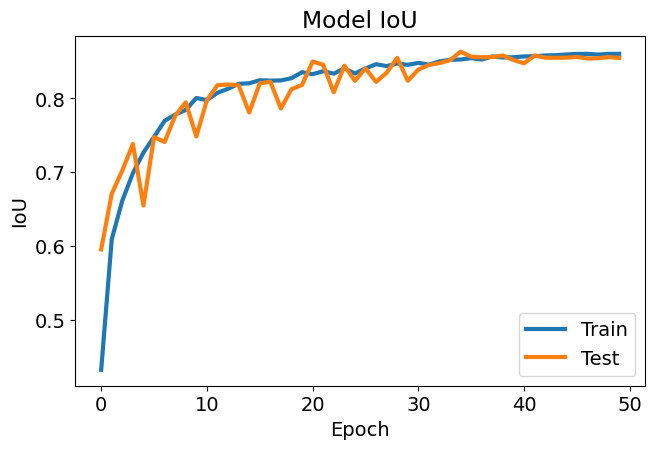

In [ ]:
import matplotlib.pyplot as plt
# Adjust font size and line width
plt.rcParams['font.size'] = 14
plt.rcParams['lines.linewidth'] = 3
# Plot training & validation IoU values
plt.figure(figsize=(25, 10))
plt.subplot(2, 3, 1)
plt.plot(history['train_miou'])
plt.plot(history['val_miou'])
plt.title('Model IoU')
plt.ylabel('IoU')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='lower right')
plt.show()

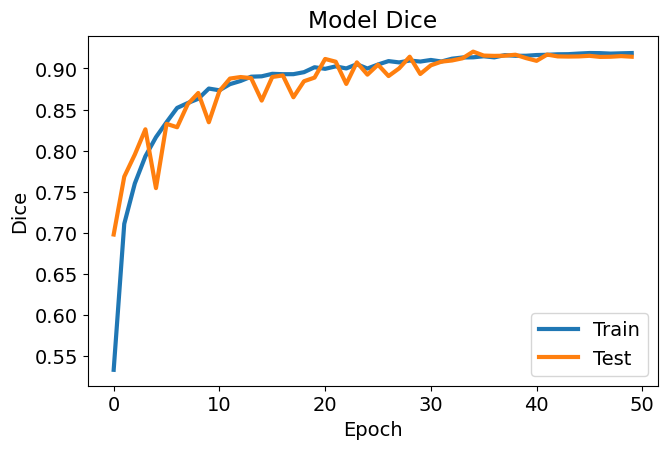

In [ ]:
plt.figure(figsize=(25, 10))
plt.subplot(2, 3, 1)
plt.plot(history['train_dice'])
plt.plot(history['val_dice'])
plt.title('Model Dice')
plt.ylabel('Dice')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='lower right')

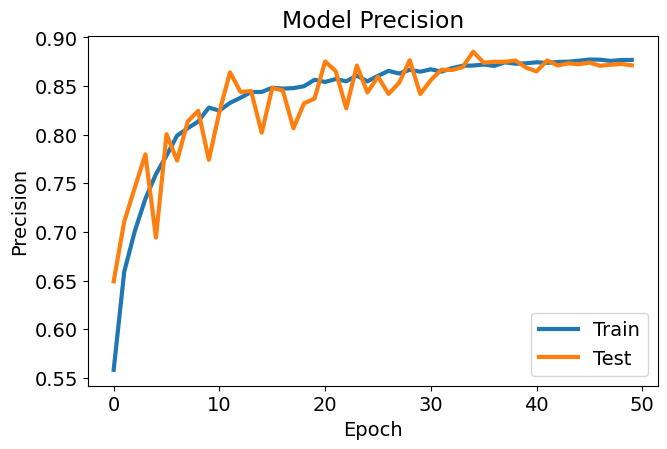

In [ ]:
plt.figure(figsize=(25, 10))
plt.subplot(2, 3, 1)
plt.plot(history['train_Precision'])
plt.plot(history['val_Precision'])
plt.title('Model Precision')
plt.ylabel('Precision')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='lower right')

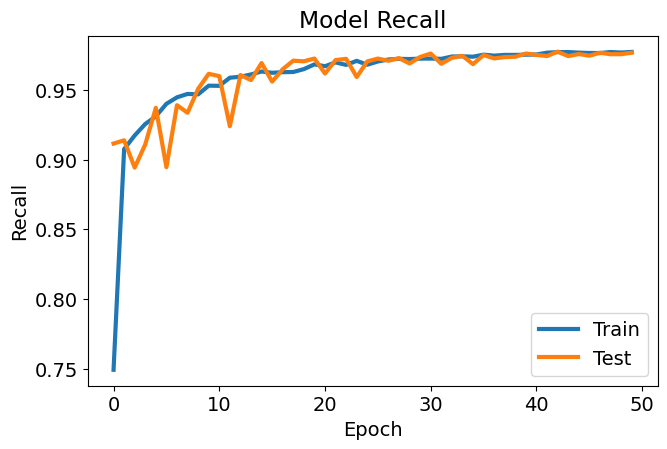

In [ ]:
plt.figure(figsize=(25, 10))
plt.subplot(2, 3, 1)
plt.plot(history['train_recall'])
plt.plot(history['val_recall'])
plt.title('Model Recall')
plt.ylabel('Recall')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='lower right')

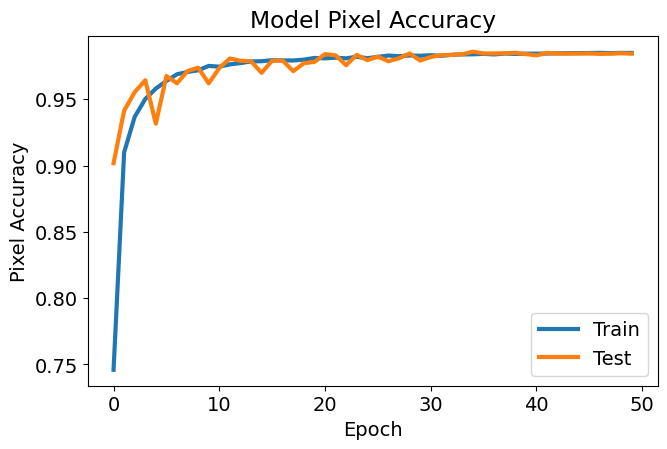

In [ ]:
plt.figure(figsize=(25, 10))
plt.subplot(2, 3, 1)
plt.plot(history['train_acc'])
plt.plot(history['val_acc'])
plt.title('Model Pixel Accuracy')
plt.ylabel('Pixel Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='lower right')

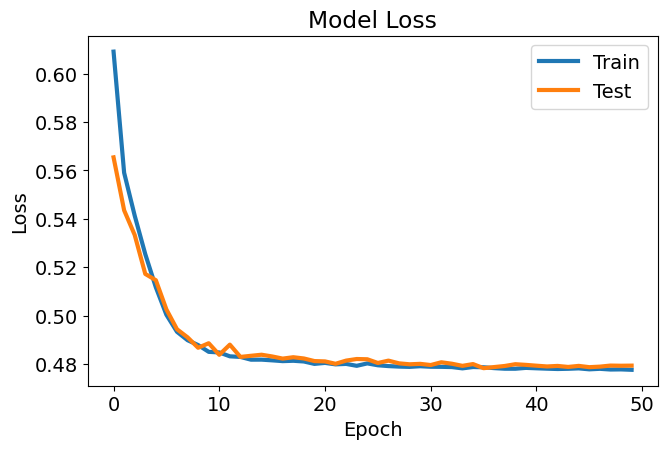

In [ ]:
plt.figure(figsize=(25, 10))
plt.subplot(2, 3, 1)
plt.plot(history['train_loss'])
plt.plot(history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper right')

In [ ]:
mob_miou = miou_score(model, test_set)
dice_miou = dice_score_model(model, test_set)
mob_acc = pixel_acc(model, test_set)

  0%|          | 0/288 [00:00<?, ?it/s]

  0%|          | 0/288 [00:00<?, ?it/s]

  0%|          | 0/288 [00:00<?, ?it/s]

In [ ]:
print(np.mean(mob_miou))
print(np.mean(dice_miou))
print(np.mean(mob_acc))

0.8704559483033719
0.9247425193068016
0.9850073920355903


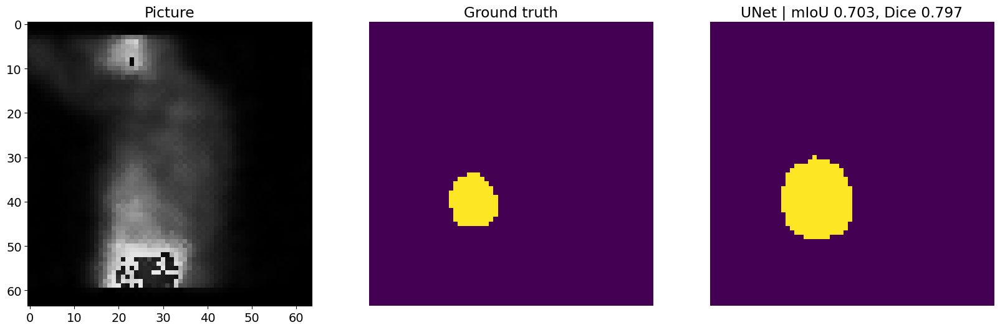

In [ ]:
image, mask = test_set[0]
pred_mask, Dscore = predict_image_mask_dice(model, image, mask)
pred_mask, score = predict_image_mask_miou(model, image, mask)
fig, (ax1, ax2, ax3) = plt.subplots(1,3, figsize=(20,10))
ax1.imshow(image)
ax1.set_title('Picture');

ax2.imshow(mask)
ax2.set_title('Ground truth')
ax2.set_axis_off()

ax3.imshow(pred_mask)
ax3.set_title('UNet | mIoU {:.3f}'.format(score)+', Dice {:.3f}'.format(Dscore))
ax3.set_axis_off()

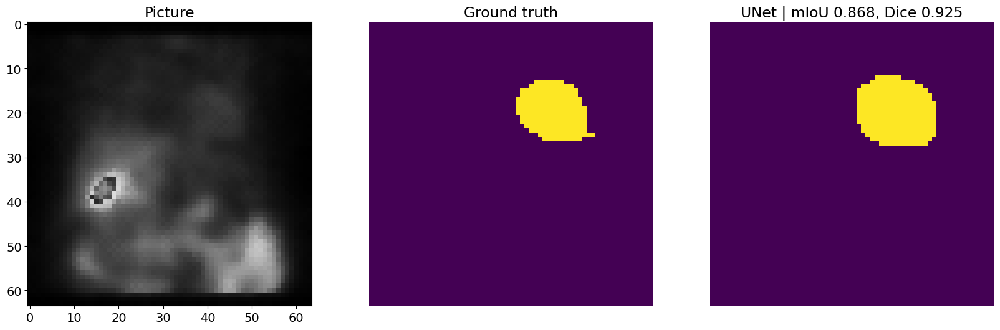

In [ ]:
image, mask = test_set[1]
pred_mask, Dscore = predict_image_mask_dice(model, image, mask)
pred_mask, score = predict_image_mask_miou(model, image, mask)
fig, (ax1, ax2, ax3) = plt.subplots(1,3, figsize=(20,10))
ax1.imshow(image)
ax1.set_title('Picture');

ax2.imshow(mask)
ax2.set_title('Ground truth')
ax2.set_axis_off()

ax3.imshow(pred_mask)
ax3.set_title('UNet | mIoU {:.3f}'.format(score)+', Dice {:.3f}'.format(Dscore))
ax3.set_axis_off()

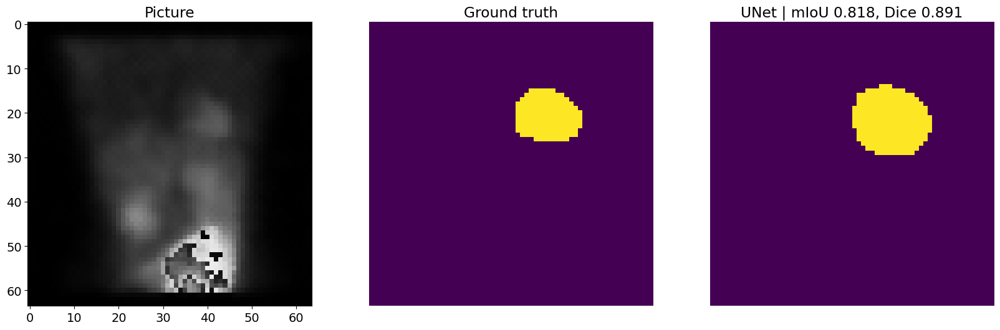

In [ ]:
image, mask = test_set[2]
pred_mask, Dscore = predict_image_mask_dice(model, image, mask)
pred_mask, score = predict_image_mask_miou(model, image, mask)
fig, (ax1, ax2, ax3) = plt.subplots(1,3, figsize=(20,10))
ax1.imshow(image)
ax1.set_title('Picture');

ax2.imshow(mask)
ax2.set_title('Ground truth')
ax2.set_axis_off()

ax3.imshow(pred_mask)
ax3.set_title('UNet | mIoU {:.3f}'.format(score)+', Dice {:.3f}'.format(Dscore))
ax3.set_axis_off()

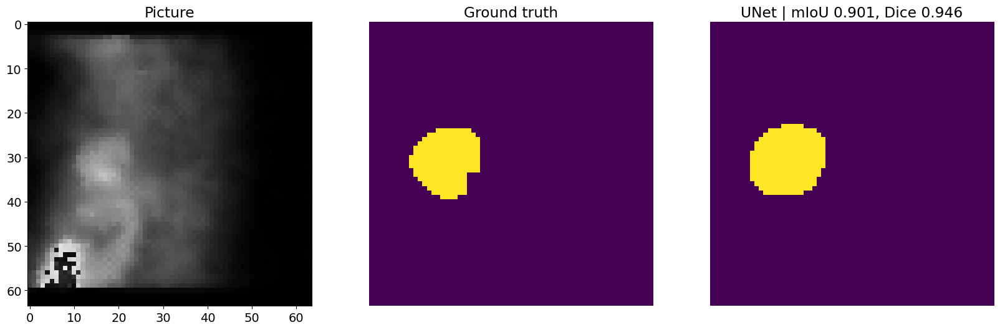

In [ ]:
image, mask = test_set[20]
pred_mask, Dscore = predict_image_mask_dice(model, image, mask)
pred_mask, score = predict_image_mask_miou(model, image, mask)
fig, (ax1, ax2, ax3) = plt.subplots(1,3, figsize=(20,10))
ax1.imshow(image)
ax1.set_title('Picture');

ax2.imshow(mask)
ax2.set_title('Ground truth')
ax2.set_axis_off()

ax3.imshow(pred_mask)
ax3.set_title('UNet | mIoU {:.3f}'.format(score)+', Dice {:.3f}'.format(Dscore))
ax3.set_axis_off()

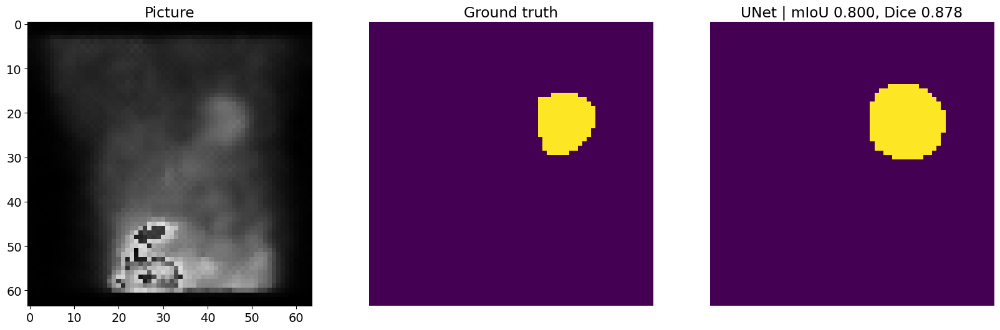

In [ ]:
image, mask = test_set[50]
pred_mask, Dscore = predict_image_mask_dice(model, image, mask)
pred_mask, score = predict_image_mask_miou(model, image, mask)
fig, (ax1, ax2, ax3) = plt.subplots(1,3, figsize=(20,10))
ax1.imshow(image)
ax1.set_title('Picture');

ax2.imshow(mask)
ax2.set_title('Ground truth')
ax2.set_axis_off()

ax3.imshow(pred_mask)
ax3.set_title('UNet | mIoU {:.3f}'.format(score)+', Dice {:.3f}'.format(Dscore))
ax3.set_axis_off()

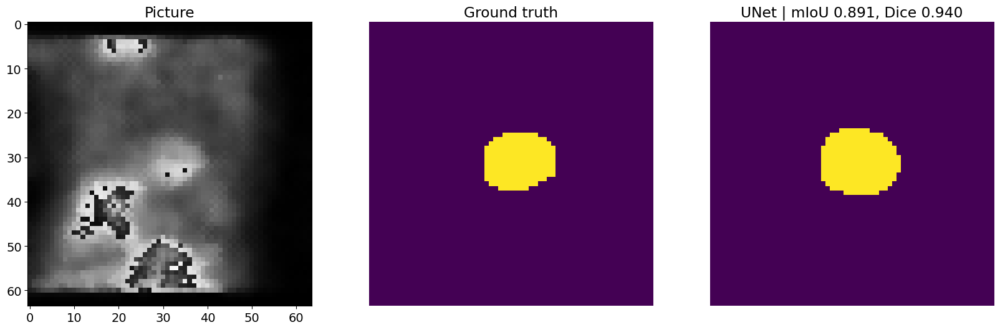

In [ ]:
image, mask = test_set[70]
pred_mask, Dscore = predict_image_mask_dice(model, image, mask)
pred_mask, score = predict_image_mask_miou(model, image, mask)
fig, (ax1, ax2, ax3) = plt.subplots(1,3, figsize=(20,10))
ax1.imshow(image)
ax1.set_title('Picture');

ax2.imshow(mask)
ax2.set_title('Ground truth')
ax2.set_axis_off()

ax3.imshow(pred_mask)
ax3.set_title('UNet | mIoU {:.3f}'.format(score)+', Dice {:.3f}'.format(Dscore))
ax3.set_axis_off()

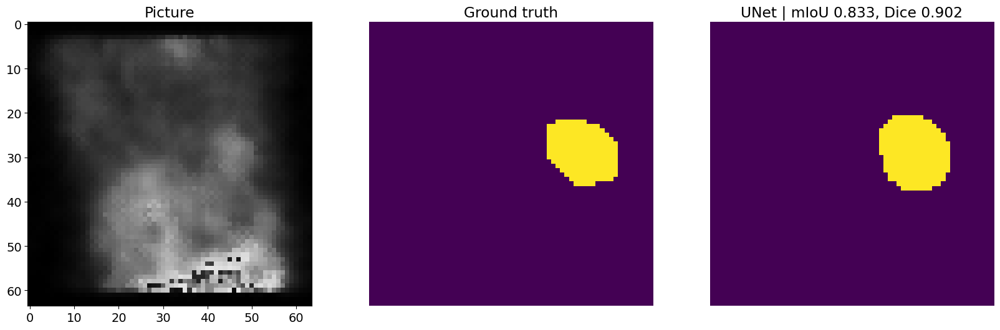

In [ ]:
image, mask = test_set[80]
pred_mask, Dscore = predict_image_mask_dice(model, image, mask)
pred_mask, score = predict_image_mask_miou(model, image, mask)
fig, (ax1, ax2, ax3) = plt.subplots(1,3, figsize=(20,10))
ax1.imshow(image)
ax1.set_title('Picture');

ax2.imshow(mask)
ax2.set_title('Ground truth')
ax2.set_axis_off()

ax3.imshow(pred_mask)
ax3.set_title('UNet | mIoU {:.3f}'.format(score)+', Dice {:.3f}'.format(Dscore))
ax3.set_axis_off()

# 3D reconstruction

In [ ]:
import torch

# Specify the path to your saved model
model_path = "Unet-Mobilenet_v2_mIoU-0.890.pt"

# Load the model onto the CPU
model = torch.load(model_path, map_location=torch.device('cpu'))

# Set the model in evaluation mode
model.eval()


UNet(
  (max_pool_2x2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (down_conv_1): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
  )
  (down_conv_2): Sequential(
    (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
  )
  (down_conv_3): Sequential(
    (0): Conv2d(128, 256, kernel_s

In [ ]:
!apt-get install unrar
!unrar x "/content/f1.rar" "/content/"

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
unrar is already the newest version (1:6.1.5-1).
0 upgraded, 0 newly installed, 0 to remove and 45 not upgraded.

UNRAR 6.11 beta 1 freeware      Copyright (c) 1993-2022 Alexander Roshal


Extracting from /content/f1.rar

Creating    /content/f1                                               OK
Extracting  /content/f1/test16Original_SGATE_G_1001_DS_0.TIFF              0%  OK 
Extracting  /content/f1/test16Original_SGATE_G_1001_DS_100.TIFF            1%  OK 
Extracting  /content/f1/test16Original_SGATE_G_1001_DS_104.TIFF            2%  OK 
Extracting  /content/f1/test16Original_SGATE_G_1001_DS_108.TIFF            3%  OK 
Extracting  /content/f1/test16Original_SGATE_G_1001_DS_112.TIFF            3%  OK 
Extracting  /content/f1/test16Original_SGATE_G_1001_DS_116.TIFF            4%  OK 
Extracting  /content/f1/test16Original_SGATE_G_1001_DS_1

In [ ]:
def predict_image_mask(model, image, mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]):
    model.eval()
    t = T.Compose([T.ToTensor(), T.Normalize(mean, std)])
    image = t(image)
    model.to(device); image=image.to(device)
    with torch.no_grad():

        image = image.unsqueeze(0)

        output = model(image)
        masked = torch.argmax(output, dim=1)
        masked = masked.cpu().squeeze(0)
    return masked

In [ ]:
import os
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from torchvision.transforms.functional import normalize
from torchvision import transforms
import re


# Step 1: Load the images
folder_path = '/content/f1'
image_files = os.listdir(folder_path)
image_files.sort(key=lambda f: int(re.findall(r'DS_(\d+)', f)[0]))


images = [Image.open(os.path.join(folder_path, image_file)).convert("RGB") for image_file in image_files]

# Now, each image should have three channels and match the input dimensions expected by your model.
pred_masks = [predict_image_mask(model, image) for image in images]


# Ensure the mask is on the same device as the image tensor
#pred_mask = pred_mask.to(image_tensor.device)

# Apply the mask to the image tensor
#masked_image = image_tensor * pred_mask.unsqueeze(0)

# Step 3: Save the predicted masks
mask_folder_path = '/content/output'
os.makedirs(mask_folder_path, exist_ok=True)
for i, pred_mask in enumerate(pred_masks):
    # Convert the mask to uint8
    image_tensor = transforms.ToTensor()(images[i])
    pred_mask = pred_mask.to(image_tensor.device)
    #pred_mask_uint8 = pred_mask.cpu().numpy()#.astype(np.uint8)
    masked_image = image_tensor * pred_mask.unsqueeze(0)
    # Convert the tensor to a numpy array
    masked_image_np = masked_image.permute(1, 2, 0).cpu().detach().numpy()
    Image.fromarray((masked_image_np * 255).astype(np.uint8)).save(os.path.join(mask_folder_path, f'mask_{i}.png'))



In [ ]:
import os
import numpy as np
import plotly.graph_objects as go
from PIL import Image

# Step 1: Load the segmented images from 'f1' folder
folder_path = '/content/output'
image_files = os.listdir(folder_path)
segmented_images = [Image.open(os.path.join(folder_path, image_file)) for image_file in image_files]

# Convert the images to grayscale and then to numpy arrays
segmented_images = [np.array(image.convert('L')) for image in segmented_images]

# Step 2: Create a 3D volume of the segmented images
volume = np.stack(segmented_images)
x, y, z = volume.nonzero()

# Create a 3D scatter plot
fig = go.Figure(data=go.Scatter3d(
    x=x,
    y=y,
    z=z,
    mode='markers',
    marker=dict(
        size=4,
        color=z,                # set color to an array/list of desired values
        colorscale='Viridis',    # choose a colorscale
        opacity=0.8
    )
))

# Update layout for better view
fig.update_layout(scene=dict(
                    xaxis=dict(nticks=4, range=[np.min(x),np.max(x)],),
                    yaxis=dict(nticks=4, range=[np.min(y),np.max(y)],),
                    zaxis=dict(nticks=4, range=[np.min(z),np.max(z)],),),
                  width=700,
                  margin=dict(r=20, l=10, b=10, t=10))

fig.show()


In [ ]:
import os
import re
import numpy as np
import plotly.graph_objects as go
from PIL import Image

# Step 1: Load the segmented images from 'f1' folder
folder_path = '/content/output'
image_files = os.listdir(folder_path)
image_files.sort(key=lambda f: int(re.findall(r'\d+', f)[0]))

segmented_images = [Image.open(os.path.join(folder_path, image_file)).convert("L") for image_file in image_files]

# Convert the images to grayscale and then to numpy arrays
segmented_images = [np.array(image) for image in segmented_images]

# Step 2: Create a 3D volume of the segmented images
volume = np.stack(segmented_images)

# Create x, y, z coordinates for voxel centers
x = np.arange(volume.shape[0])
y = np.arange(volume.shape[1])
z = np.arange(volume.shape[2])
x, y, z = np.meshgrid(x, y, z, indexing='ij')

fig = go.Figure(data=go.Volume(
    x=x.flatten(),
    y=y.flatten(),
    z=z.flatten(),
    value=volume.flatten(),
    isomin=0,
    isomax=np.max(volume),
    opacity=0.1,  # needs to be small to see through all surfaces
    surface_count=17,  # needs to be a large number for good volume rendering
    colorscale='Viridis'
))

fig.show()
